## Imports ##

In [ ]:
import pandas as pd
import numpy as np
import math
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sb

from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.utils import resample, shuffle
from sklearn.decomposition import PCA, NMF
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_curve, roc_auc_score, precision_recall_curve, average_precision_score, balanced_accuracy_score

from sklearn.neighbors import KNeighborsClassifier
import sklearn.tree as SKTree
from sklearn.ensemble import RandomForestClassifier
import sklearn.naive_bayes as SKNB
from sklearn.ensemble import GradientBoostingClassifier


import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input

tf.random.set_seed(42)
np.random.seed(42)

### Funções ###

#### Função para armazenar os resultados ####

In [ ]:
resultados = []

def mostrar_metricas(resultado):
    print(f"Modelo: {resultado['modelo']} (Iteração {resultado['iteracao']})")
    print(f"  Accuracy:  {resultado['accuracy']:.4f}")
    print(f"  Precision: {resultado['precision']:.4f}")
    print(f"  Recall:    {resultado['recall']:.4f}")
    print(f"  F1 Score:  {resultado['f1_score']:.4f}")
    print("-" * 40)

def plotar(resultado):
    sb.set(style='whitegrid')  # define estilo global

    modelo = resultado['modelo']
    iteracao = resultado['iteracao']

    # Recupera os dados das curvas e matriz
    fpr, tpr = resultado['roc_curve']
    auc = resultado['roc_auc']
    precisions, recalls = resultado['precision_recall_curve']
    avg_prec = resultado['average_precision']
    conf_mat = resultado['confusion_matrix']

    # Cria a figura
    fig, axs = plt.subplots(1, 3, figsize=(20, 5))

    # --- Curva ROC ---
    axs[0].plot(fpr, tpr, color='darkorange', lw=2, label=f'AUC = {auc:.4f}')
    axs[0].plot([0, 1], [0, 1], linestyle='--', color='gray', lw=1)
    axs[0].set_title(f'Curva ROC - {modelo} (Iteração {iteracao})', fontsize=12)
    axs[0].set_xlabel('Taxa de Falsos Positivos (FPR)')
    axs[0].set_ylabel('Taxa de Verdadeiros Positivos (TPR)')
    axs[0].legend(loc='lower right')
    axs[0].grid(True)

    # --- Curva Precision-Recall ---
    axs[1].plot(recalls, precisions, color='seagreen', lw=2, label=f'AP = {avg_prec:.4f}')
    axs[1].set_title(f'Precision-Recall - {modelo} (Iteração {iteracao})', fontsize=12)
    axs[1].set_xlabel('Recall')
    axs[1].set_ylabel('Precision')
    axs[1].legend(loc='upper right')
    axs[1].grid(True)

    # --- Matriz de Confusão ---
    sb.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', cbar=False,
               ax=axs[2], linewidths=0.5, linecolor='gray', annot_kws={"size": 12})
    axs[2].set_title(f'Matriz de Confusão - {modelo} (Iteração {iteracao})', fontsize=12)
    axs[2].set_xlabel('Predito')
    axs[2].set_ylabel('Verdadeiro')

    plt.tight_layout()
    plt.show()

def metricas(nome_modelo, iteracao, y_true, y_pred, y_proba):
    # Cálculo das métricas principais
    acc = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred, zero_division=0)
    rec = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    bal_acc = balanced_accuracy_score(y_true, y_pred)
    conf_mat = confusion_matrix(y_true, y_pred)

    # ROC
    fpr, tpr, _ = roc_curve(y_true, y_proba)
    auc = roc_auc_score(y_true, y_proba)

    # Precision-Recall
    precisions, recalls, _ = precision_recall_curve(y_true, y_proba)
    avg_prec = average_precision_score(y_true, y_proba)

    # Armazena os resultados em um dicionário
    resultado = {
        'modelo': nome_modelo,
        'iteracao': iteracao,
        'accuracy': acc,
        'precision': prec,
        'recall': rec,
        'f1_score': f1,
        'balanced_accuracy': bal_acc,
        'roc_auc': auc,
        'average_precision': avg_prec,
        'confusion_matrix': conf_mat,
        'roc_curve': (fpr, tpr),
        'precision_recall_curve': (precisions, recalls)
    }
    mostrar_metricas(resultado)
    plotar(resultado)
    resultados.append(resultado)

    return

#### Funções para plots das métricas ####

In [ ]:
def plotar_metricas_evolucao(resultados):
    """
    Para cada métrica de interesse em resultados, plota a evolução ao longo das iterações,
    agrupando por modelo. Cada modelo recebe uma cor distinta.
    Métricas: accuracy, precision, recall, f1_score, balanced_accuracy, average_precision.
    """
    sb.set(style='whitegrid')

    # Define quais métricas serão plotadas e seus rótulos
    metricas = {
        'accuracy': 'Accuracy',
        'precision': 'Precision',
        'recall': 'Recall',
        'f1_score': 'F1 Score',
        'balanced_accuracy': 'Balanced Accuracy',
        'average_precision': 'Average Precision'
    }

    # Identifica todos os modelos únicos
    modelos = sorted({r['modelo'] for r in resultados})

    # Gera uma paleta de cores com um tom para cada modelo
    cores = sb.color_palette(n_colors=len(modelos))
    cor_modelo = {modelo: cores[i] for i, modelo in enumerate(modelos)}

    # Para cada métrica, plota um gráfico
    for key, label in metricas.items():
        plt.figure(figsize=(8, 5))
        for modelo in modelos:
            # Seleciona apenas as iterações desse modelo
            sel = [r for r in resultados if r['modelo'] == modelo]
            # Ordena por iteração
            sel = sorted(sel, key=lambda r: r['iteracao'])
            # Pega listas de iterações e valores da métrica
            its  = [r['iteracao'] for r in sel]
            vals = [r[key]       for r in sel]
            # Plota a linha usando a cor dedicada
            plt.plot(its, vals, marker='o', color=cor_modelo[modelo], label=modelo)

        plt.title(f'Evolução de {label} por Iteração')
        plt.xlabel('Iteração')
        plt.ylabel(label)
        plt.xticks(sorted({r['iteracao'] for r in resultados}))
        plt.legend(title='Modelo', loc='best')
        plt.grid(True)
        plt.tight_layout()
        plt.show()

In [ ]:
def plot_roc_por_modelo(resultados):
    """
    Para cada modelo em `resultados`, plota em um subplot a evolução da curva ROC
    ao longo das iterações, com cada iteração numa cor distinta.
    """
    sb.set(style='whitegrid')
    modelos = sorted({r['modelo'] for r in resultados})
    n = len(modelos)
    n_cols = min(3, n)
    n_rows = math.ceil(n / n_cols)
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 5 * n_rows))
    axes = axes.flatten()

    for ax, modelo in zip(axes, modelos):
        sel = sorted([r for r in resultados if r['modelo'] == modelo],
                     key=lambda r: r['iteracao'])
        iterations = [r['iteracao'] for r in sel]
        palette = sb.color_palette(n_colors=len(iterations))
        # Mapear cada iteração a uma cor
        cor_it = {it: palette[i] for i, it in enumerate(iterations)}

        for r in sel:
            fpr, tpr = r['roc_curve']
            ax.plot(fpr,
                    tpr,
                    lw=2,
                    color=cor_it[r['iteracao']],
                    label=f"it {r['iteracao']} (AUC={r['roc_auc']:.3f})")
        ax.plot([0,1], [0,1], '--', color='gray')
        ax.set_title(f"ROC — {modelo}")
        ax.set_xlabel("FPR")
        ax.set_ylabel("TPR")
        ax.legend(fontsize='small')
        ax.grid(True)

    # Remove eixos extras
    for ax in axes[n:]:
        ax.axis('off')

    plt.tight_layout()
    plt.show()


def plot_pr_por_modelo(resultados):
    """
    Para cada modelo em `resultados`, plota em um subplot a evolução da curva
    Precision-Recall ao longo das iterações, com cada iteração numa cor distinta.
    """
    sb.set(style='whitegrid')
    modelos = sorted({r['modelo'] for r in resultados})
    n = len(modelos)
    n_cols = min(3, n)
    n_rows = math.ceil(n / n_cols)
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 5 * n_rows))
    axes = axes.flatten()

    for ax, modelo in zip(axes, modelos):
        sel = sorted([r for r in resultados if r['modelo'] == modelo],
                     key=lambda r: r['iteracao'])
        iterations = [r['iteracao'] for r in sel]
        palette = sb.color_palette(n_colors=len(iterations))
        cor_it = {it: palette[i] for i, it in enumerate(iterations)}

        for r in sel:
            precisions, recalls = r['precision_recall_curve']
            ax.plot(recalls,
                    precisions,
                    lw=2,
                    color=cor_it[r['iteracao']],
                    label=f"it {r['iteracao']} (AP={r['average_precision']:.3f})")
        ax.set_title(f"PR — {modelo}")
        ax.set_xlabel("Recall")
        ax.set_ylabel("Precision")
        ax.legend(fontsize='small')
        ax.grid(True)

    # Remove eixos extras
    for ax in axes[n:]:
        ax.axis('off')

    plt.tight_layout()
    plt.show()

def plot_conf_matrices(resultados, modelo=None):
    """
    Plota as matrizes de confusão armazenadas em `resultados`.
    Se `modelo` for None, plota todos os modelos; caso contrário, apenas as iterações desse modelo.
    """
    # Filtra pelos resultados desejados
    sel = [r for r in resultados if modelo is None or r['modelo'] == modelo]
    if not sel:
        print("Nenhum resultado encontrado para esse modelo.")
        return

    n = len(sel)
    # Define grid: até 4 colunas por linha
    cols = min(4, n)
    rows = math.ceil(n / cols)
    fig, axes = plt.subplots(rows, cols, figsize=(4 * cols, 4 * rows))
    axes = axes.flatten()

    for ax, r in zip(axes, sel):
        cm = r['confusion_matrix']
        sb.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
                   ax=ax, linewidths=0.5, linecolor='gray', annot_kws={"size": 12})
        ax.set_title(f"{r['modelo']} iteração {r['iteracao']}")
        ax.set_xlabel('Predito')
        ax.set_ylabel('Verdadeiro')

    # Se sobrar espaço em axes, esconde os eixos extras
    for ax in axes[n:]:
        ax.axis('off')

    plt.suptitle(f"Matrizes de Confusão{' - ' + modelo if modelo else ''}", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

#### Funções para plots regressão ####

In [ ]:
def plot_loss(history, title='Gráfico de Loss'):
    plt.plot(history.history['loss'], label='Loss')
    plt.plot(history.history['val_loss'], label='Val Loss')
    plt.xlabel('Épocas')
    plt.ylabel('Erro')
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.show()

def plot_acc(history, title='Gráfico de Acurácia'):
    plt.plot(history.history['accuracy'], label='Acurácia')
    plt.plot(history.history['val_accuracy'], label='Val Acurácia')
    plt.xlabel('Épocas')
    plt.ylabel('Acurácia')
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.show()

def plot_auc(history, title='Gráfico de AUC'):
    plt.plot(history.history['auc'], label='AUC')
    plt.plot(history.history['val_auc'], label='Val AUC')
    plt.xlabel('Épocas')
    plt.ylabel('AUC')
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.show()

def plot_precision(history, title='Gráfico de Precision'):
    plt.plot(history.history['precision'], label='Precision')
    plt.plot(history.history['val_precision'], label='Val Precision')
    plt.xlabel('Épocas')
    plt.ylabel('Precision')
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.show()

def plot_recall(history, title='Gráfico de Recall'):
    plt.plot(history.history['recall'], label='Recall')
    plt.plot(history.history['val_recall'], label='Val Recall')
    plt.xlabel('Épocas')
    plt.ylabel('Recall')
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.show()

## Leitura e tratamento do dataset ##

In [ ]:
ds = pd.read_csv("/content/drive/MyDrive/TCC/healthcare-dataset-stroke-data.csv")

In [ ]:
print('Quantidade de linha e colunas:')
display(ds.shape)
print('\nPrimeiras 5 linhas')
display(ds.head())

Quantidade de linha e colunas:


(5110, 12)


Primeiras 5 linhas


,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
1,51676,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,NaN,never smoked,1
2,31112,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1
3,60182,Female,49.0,0,0,Yes,Private,Urban,171.23,34.4,smokes,1
4,1665,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1


In [ ]:
print('Descrição dos dados:')
display(ds.describe(include='all'))
print('\n%de nulos no dataset')
display(ds.isna().sum() / ds.shape[0])

Descrição dos dados:


,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
count,5110.000000,5110,5110.000000,5110.000000,5110.000000,5110,5110,5110,5110.000000,4909.000000,5110,5110.000000
unique,NaN,3,NaN,NaN,NaN,2,5,2,NaN,NaN,4,NaN
top,NaN,Female,NaN,NaN,NaN,Yes,Private,Urban,NaN,NaN,never smoked,NaN
freq,NaN,2994,NaN,NaN,NaN,3353,2925,2596,NaN,NaN,1892,NaN
mean,36517.829354,NaN,43.226614,0.097456,0.054012,NaN,NaN,NaN,106.147677,28.893237,NaN,0.048728
std,21161.721625,NaN,22.612647,0.296607,0.226063,NaN,NaN,NaN,45.283560,7.854067,NaN,0.215320
min,67.000000,NaN,0.080000,0.000000,0.000000,NaN,NaN,NaN,55.120000,10.300000,NaN,0.000000
25%,17741.250000,NaN,25.000000,0.000000,0.000000,NaN,NaN,NaN,77.245000,23.500000,NaN,0.000000
50%,36932.000000,NaN,45.000000,0.000000,0.000000,NaN,NaN,NaN,91.885000,28.100000,NaN,0.000000
75%,54682.000000,NaN,61.000000,0.000000,0.000000,NaN,NaN,NaN,114.090000,33.100000,NaN,0.000000



%de nulos no dataset


,0
id,0.000000
gender,0.000000
age,0.000000
hypertension,0.000000
heart_disease,0.000000
ever_married,0.000000
work_type,0.000000
Residence_type,0.000000
avg_glucose_level,0.000000
bmi,0.039335


In [ ]:
bmi = ds['bmi']
display(bmi.describe())

,bmi
count,4909.000000
mean,28.893237
std,7.854067
min,10.300000
25%,23.500000
50%,28.100000
75%,33.100000
max,97.600000


In [ ]:
ds['bmi'] = ds['bmi'].fillna(28.1)

In [ ]:
contagem = ds['gender'].value_counts()
print(contagem)

gender
Female    2994
Male      2115
Other        1
Name: count, dtype: int64


In [ ]:
contagem = ds['smoking_status'].value_counts()
print(contagem)

smoking_status
never smoked       1892
Unknown            1544
formerly smoked     885
smokes              789
Name: count, dtype: int64


In [ ]:
encoder = OneHotEncoder(sparse_output=False)

encoded = encoder.fit_transform(ds[['gender', 'work_type', 'Residence_type', 'smoking_status']])
encoded_ds = pd.DataFrame(encoded, columns=encoder.get_feature_names_out(['gender', 'work_type', 'Residence_type', 'smoking_status']))

ds_final = pd.concat([ds, encoded_ds], axis = 1)
ds_final = ds_final[ds_final['gender_Other'] !=1 ]
ds_final = ds_final.drop([ 'id', 'gender', 'work_type', 'Residence_type', 'smoking_status', 'gender_Other', 'smoking_status_Unknown'], axis = 1)


In [ ]:
ds_final['ever_married'] = ds_final.ever_married.map({'Yes': 1, 'No': 0})

In [ ]:
display(ds_final.head())
print('\n% de nulos no dataset')
display(ds.isna().sum() / ds.shape[0])

,age,hypertension,heart_disease,ever_married,avg_glucose_level,bmi,stroke,gender_Female,gender_Male,work_type_Govt_job,work_type_Never_worked,work_type_Private,work_type_Self-employed,work_type_children,Residence_type_Rural,Residence_type_Urban,smoking_status_formerly smoked,smoking_status_never smoked,smoking_status_smokes
0,67.0,0,1,1,228.69,36.6,1,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
1,61.0,0,0,1,202.21,28.1,1,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0
2,80.0,0,1,1,105.92,32.5,1,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
3,49.0,0,0,1,171.23,34.4,1,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
4,79.0,1,0,1,174.12,24.0,1,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0



% de nulos no dataset


,0
id,0.0
gender,0.0
age,0.0
hypertension,0.0
heart_disease,0.0
ever_married,0.0
work_type,0.0
Residence_type,0.0
avg_glucose_level,0.0
bmi,0.0


## Análise dos dados ##

<ipython-input-16-0275270d864d>:3: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([colunas[col] for col in colunas.columns], labels=colunas.columns)


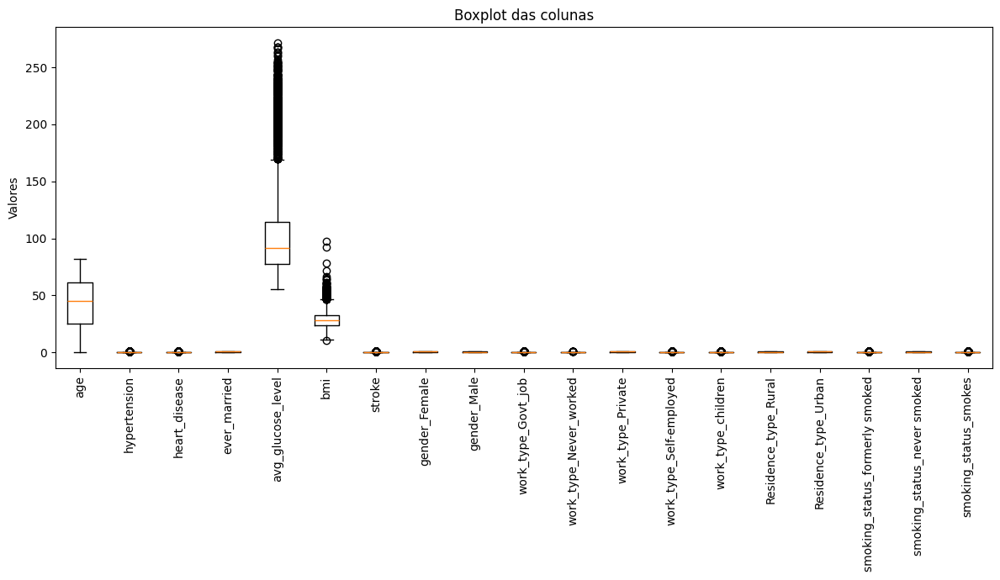

In [ ]:
colunas = ds_final.select_dtypes(include='number')
plt.figure(figsize=(12, 7))
plt.boxplot([colunas[col] for col in colunas.columns], labels=colunas.columns)

plt.title('Boxplot das colunas')
plt.ylabel('Valores')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

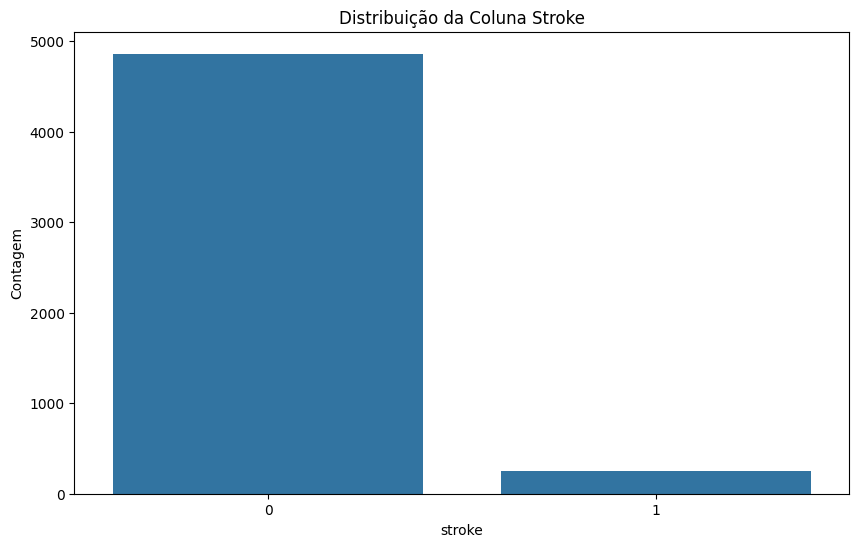

In [ ]:
plt.figure(figsize=(10, 6))
sb.countplot(x='stroke', data=ds_final)
plt.title('Distribuição da Coluna Stroke')
plt.ylabel('Contagem')
plt.xticks([0, 1], ['0', '1'])
plt.show()

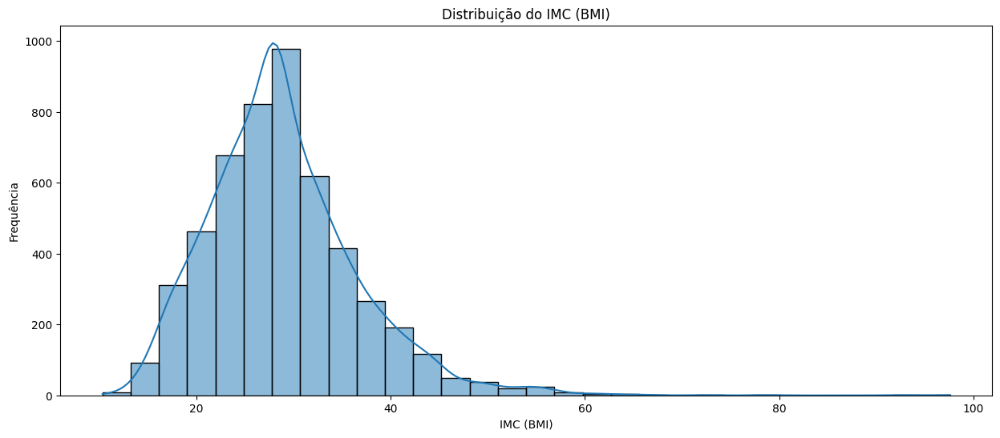

In [ ]:
plt.figure(figsize=(15, 6))
sb.histplot(data=ds_final, x='bmi', bins=30, kde=True)
plt.title('Distribuição do IMC (BMI)')
plt.xlabel('IMC (BMI)')
plt.ylabel('Frequência')
plt.show()

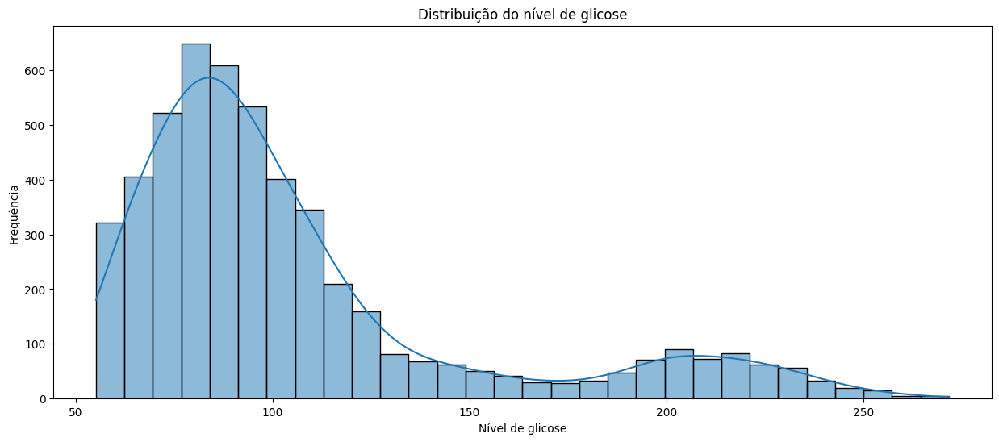

In [ ]:
plt.figure(figsize=(15, 6))
sb.histplot(data=ds_final, x='avg_glucose_level', bins=30, kde=True)
plt.title('Distribuição do nível de glicose')
plt.xlabel('Nível de glicose')
plt.ylabel('Frequência')
plt.show()

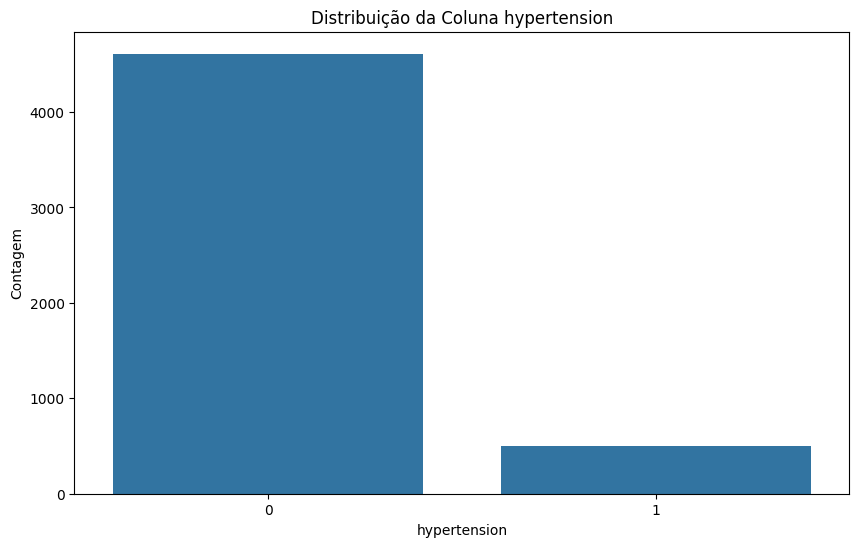

In [ ]:
plt.figure(figsize=(10, 6))
sb.countplot(x='hypertension', data=ds_final)
plt.title('Distribuição da Coluna hypertension')
plt.ylabel('Contagem')
plt.xticks([0, 1], ['0', '1'])
plt.show()

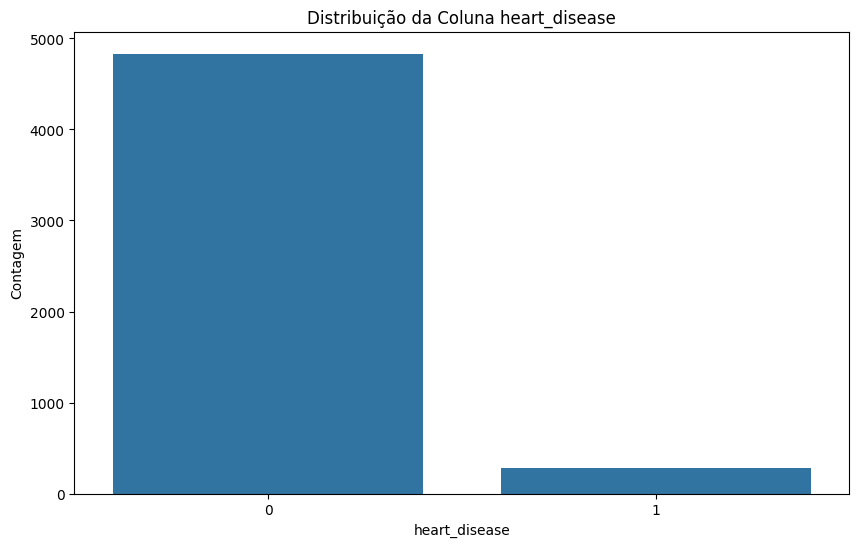

In [ ]:
plt.figure(figsize=(10, 6))
sb.countplot(x='heart_disease', data=ds_final)
plt.title('Distribuição da Coluna heart_disease')
plt.ylabel('Contagem')
plt.xticks([0, 1], ['0', '1'])
plt.show()

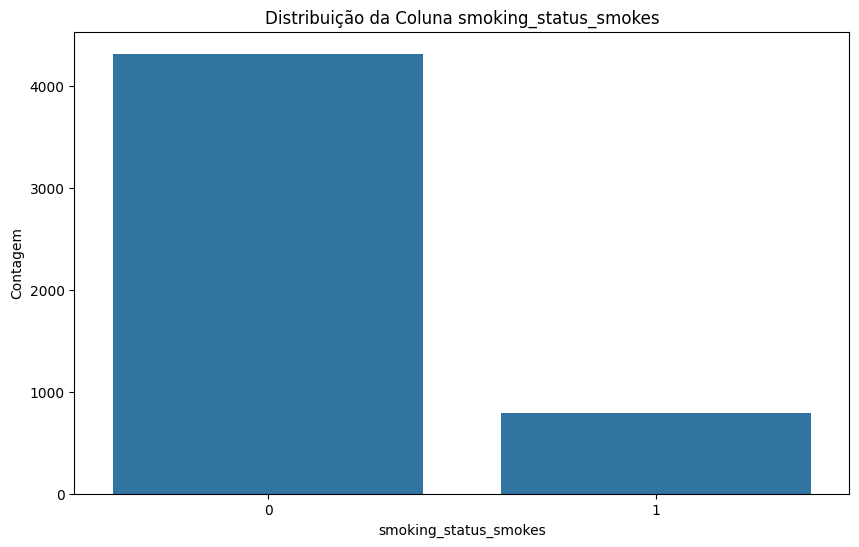

In [ ]:
plt.figure(figsize=(10, 6))
sb.countplot(x='smoking_status_smokes', data=ds_final)
plt.title('Distribuição da Coluna smoking_status_smokes')
plt.ylabel('Contagem')
plt.xticks([0, 1], ['0', '1'])
plt.show()

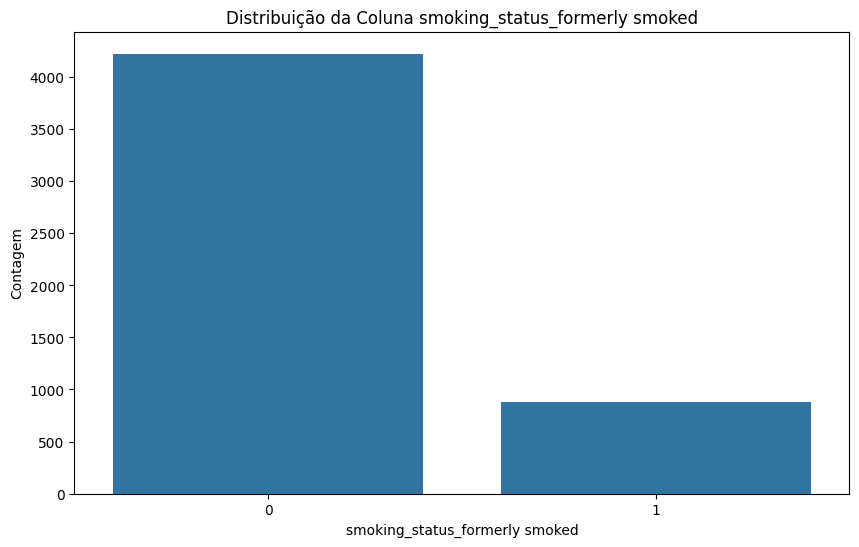

In [ ]:
plt.figure(figsize=(10, 6))
sb.countplot(x='smoking_status_formerly smoked', data=ds_final)
plt.title('Distribuição da Coluna smoking_status_formerly smoked')
plt.ylabel('Contagem')
plt.xticks([0, 1], ['0', '1'])
plt.show()

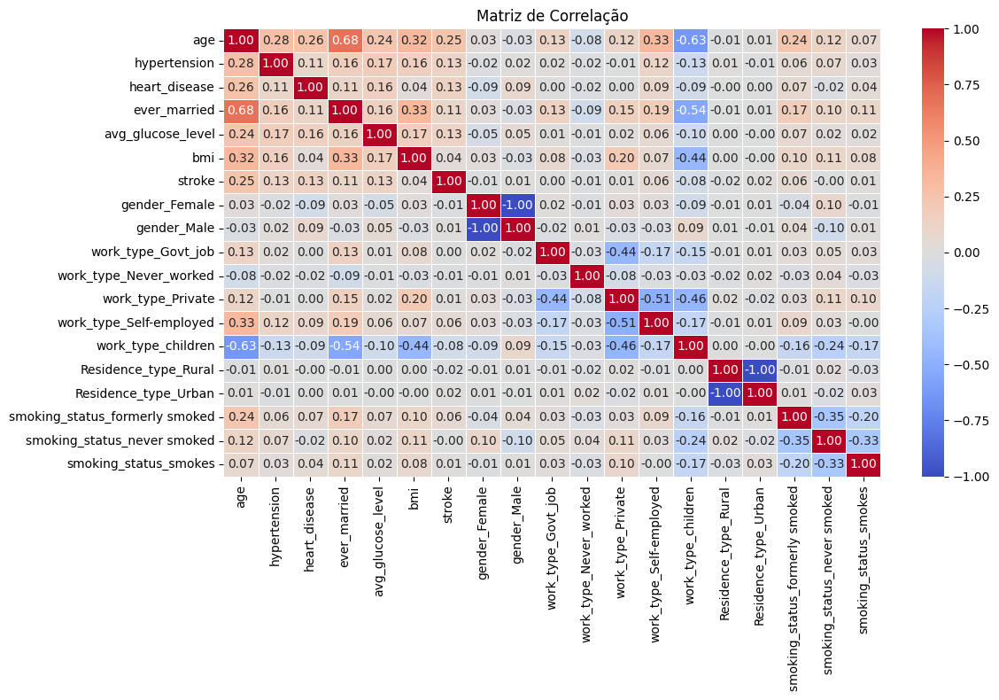

In [ ]:
corr = ds_final.corr(numeric_only=True)

plt.figure(figsize=(12, 8))
sb.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm', linewidths=0.5)
plt.title('Matriz de Correlação')
plt.tight_layout()
plt.show()

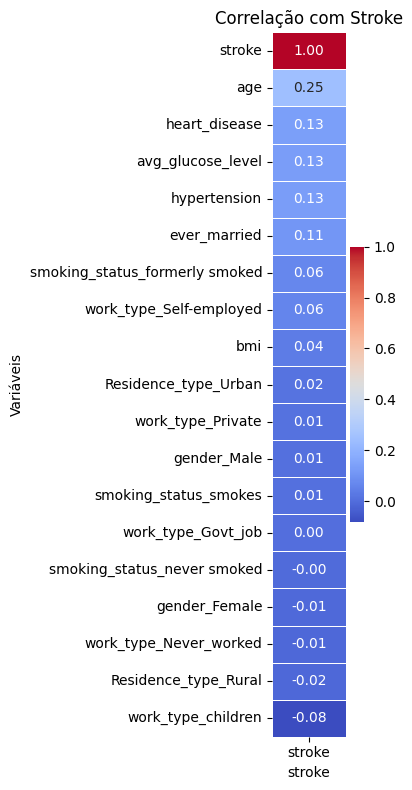

In [ ]:
corr_stroke = corr[['stroke']].sort_values(by='stroke', ascending=False)

# Cria o heatmap com stroke no eixo X
plt.figure(figsize=(4, 8))  # Estreito e alto para 1 coluna
sb.heatmap(corr_stroke, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5, cbar=True)
plt.title('Correlação com Stroke')
plt.xlabel('stroke')
plt.ylabel('Variáveis')
plt.tight_layout()
plt.show()

## Treinamento dos modelos ##

### Primeira iteração ####

#### Preparação dos dados ####

In [ ]:
ds =  ds_final.copy()

continuas = [col for col in ds.columns if ds[col].nunique() > 2]

scaler = StandardScaler()
ds[continuas] = scaler.fit_transform(ds[continuas])

ds1 = ds[['age', 'heart_disease', 'avg_glucose_level', 'hypertension', 'stroke']]
ds1 = shuffle(ds1, random_state = 42)

sel = ds1.columns.to_list()
sel.remove('stroke')

X = ds1[sel]
Y = ds1['stroke']

x_treino, x_teste, y_treino, y_teste = train_test_split(X, Y, test_size=0.3, random_state=42)

#### KNN ####

Modelo: KNN (Iteração 1)
  Accuracy:  0.9348
  Precision: 0.1111
  Recall:    0.0380
  F1 Score:  0.0566
----------------------------------------


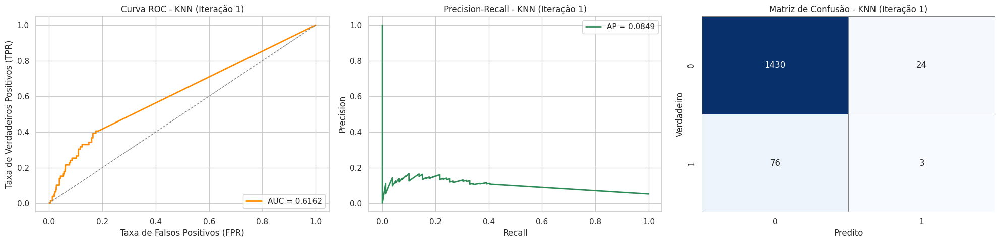

In [ ]:
knn = KNeighborsClassifier(n_neighbors=5, weights='distance', metric= 'euclidean')
knn.fit(x_treino, y_treino)
y_pred = knn.predict(x_teste)
y_proba = knn.predict_proba(x_teste)[:, 1]
metricas('KNN', 1, y_teste, y_pred, y_proba)

#### Árvore ####

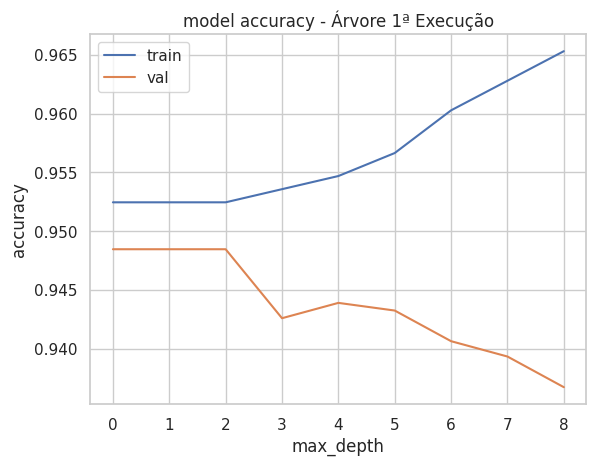

In [ ]:
history_acc_train = []
history_acc_test = []

for max_depth in range(1,10):
  clf = SKTree.DecisionTreeClassifier(criterion='entropy', max_depth=max_depth, random_state=42)
  clf = clf.fit(x_treino, y_treino)
  history_acc_train.append(accuracy_score(y_treino,  clf.predict(x_treino)))
  history_acc_test.append(accuracy_score(y_teste,  clf.predict(x_teste)))

plt.plot(history_acc_train)
plt.plot(history_acc_test)
plt.title('model accuracy - Árvore 1ª Execução')
plt.ylabel('accuracy')
plt.xlabel('max_depth')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

Modelo: Árvore (Iteração 1)
  Accuracy:  0.9485
  Precision: 0.0000
  Recall:    0.0000
  F1 Score:  0.0000
----------------------------------------


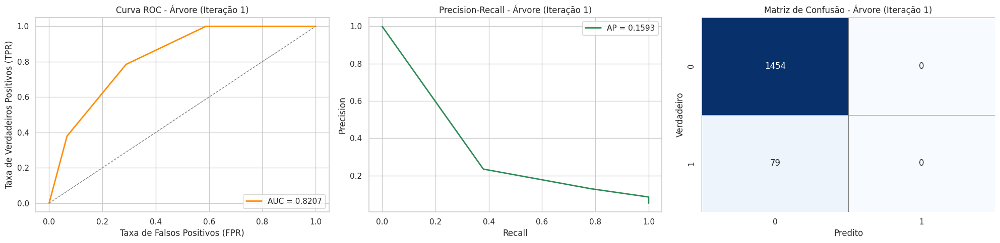

In [ ]:
tree = SKTree.DecisionTreeClassifier(criterion='entropy', max_depth=2, random_state=42)
tree.fit(x_treino, y_treino)
y_pred = tree.predict(x_teste)
y_proba = tree.predict_proba(x_teste)[:, 1]
metricas('Árvore', 1, y_teste, y_pred, y_proba)

[Text(0.5, 0.8333333333333334, 'x[0] <= 0.587\nentropy = 0.276\nsamples = 3576\nvalue = [3406, 170]'),
 Text(0.25, 0.5, 'x[0] <= -0.253\nentropy = 0.082\nsamples = 2439\nvalue = [2414, 25]'),
 Text(0.375, 0.6666666666666667, 'True  '),
 Text(0.125, 0.16666666666666666, 'entropy = 0.022\nsamples = 1427\nvalue = [1424.0, 3.0]'),
 Text(0.375, 0.16666666666666666, 'entropy = 0.151\nsamples = 1012\nvalue = [990, 22]'),
 Text(0.75, 0.5, 'x[0] <= 1.427\nentropy = 0.551\nsamples = 1137\nvalue = [992, 145]'),
 Text(0.625, 0.6666666666666667, '  False'),
 Text(0.625, 0.16666666666666666, 'entropy = 0.465\nsamples = 800\nvalue = [721, 79]'),
 Text(0.875, 0.16666666666666666, 'entropy = 0.714\nsamples = 337\nvalue = [271, 66]')]

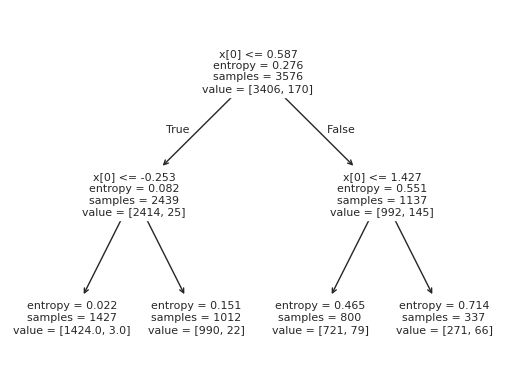

In [ ]:
SKTree.plot_tree(tree)

#### Random Forest ####

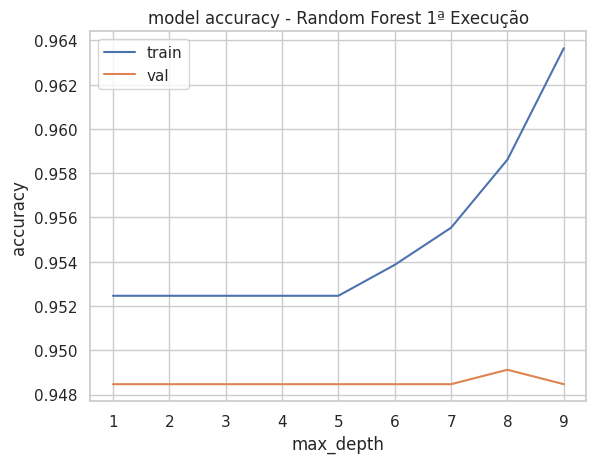

In [ ]:
history_acc_train = []
history_acc_test = []


for max_depth in range(1, 10):
    clf = RandomForestClassifier(
        n_estimators=100,
        criterion='entropy',
        max_depth=max_depth,
        random_state=42,
        n_jobs=-1
    )

    clf.fit(x_treino, y_treino)

    acc_train = accuracy_score(y_treino, clf.predict(x_treino))
    acc_test = accuracy_score(y_teste, clf.predict(x_teste))

    history_acc_train.append(acc_train)
    history_acc_test.append(acc_test)

plt.plot(range(1, 10), history_acc_train)
plt.plot(range(1, 10), history_acc_test)
plt.title('model accuracy - Random Forest 1ª Execução')
plt.ylabel('accuracy')
plt.xlabel('max_depth')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

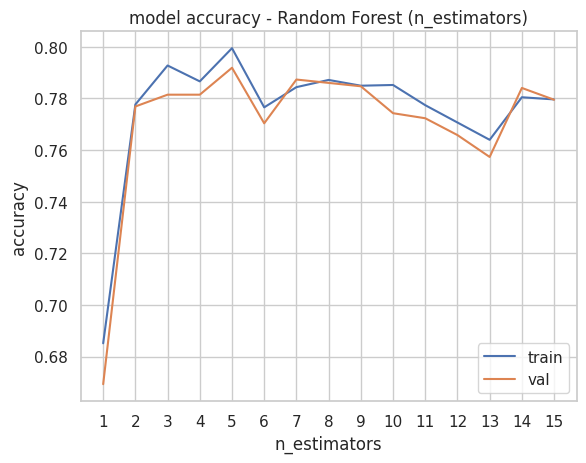

In [ ]:
history_acc_train = []
history_acc_test = []

estimators_range = range(1, 16)

for n_estimators in estimators_range:
    clf = RandomForestClassifier(
        n_estimators=n_estimators,
        criterion='entropy',
        max_depth=6,
        min_samples_split=4,
        min_samples_leaf=3,
        max_features='sqrt',
        class_weight='balanced',
        random_state=42,
        n_jobs=-1
    )

    clf.fit(x_treino, y_treino)

    acc_train = accuracy_score(y_treino, clf.predict(x_treino))
    acc_test = accuracy_score(y_teste, clf.predict(x_teste))

    history_acc_train.append(acc_train)
    history_acc_test.append(acc_test)

plt.plot(estimators_range, history_acc_train)
plt.plot(estimators_range, history_acc_test)
plt.title('model accuracy - Random Forest (n_estimators)')
plt.ylabel('accuracy')
plt.xlabel('n_estimators')
plt.xticks(estimators_range)
plt.legend(['train', 'val'], loc='lower right')
plt.show()

Modelo: Random Forest (Iteração 1)
  Accuracy:  0.7658
  Precision: 0.1335
  Recall:    0.6456
  F1 Score:  0.2213
----------------------------------------


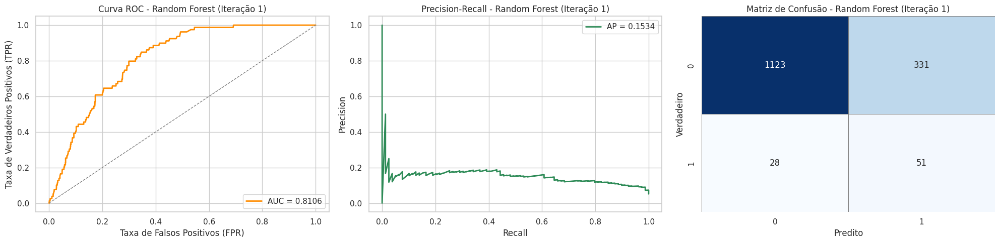

In [ ]:
rfc = RandomForestClassifier(n_estimators=12, max_depth= 6, max_features='sqrt', class_weight='balanced', random_state=42, n_jobs=-1)
rfc.fit(x_treino, y_treino)
y_pred = rfc.predict(x_teste)
y_proba = rfc.predict_proba(x_teste)[:, 1]
metricas('Random Forest', 1, y_teste, y_pred, y_proba)

#### Gradient Booster Classifier ####

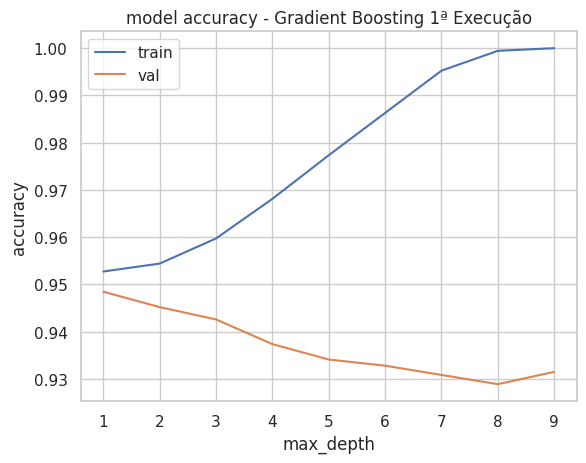

In [ ]:
history_acc_train = []
history_acc_test = []

for max_depth in range(1, 10):
    gbc = GradientBoostingClassifier(
        n_estimators=100,
        learning_rate=0.1,
        max_depth=max_depth,
        random_state=42
    )

    gbc.fit(x_treino, y_treino)

    acc_train = accuracy_score(y_treino, gbc.predict(x_treino))
    acc_test = accuracy_score(y_teste, gbc.predict(x_teste))

    history_acc_train.append(acc_train)
    history_acc_test.append(acc_test)


plt.plot(range(1, 10), history_acc_train)
plt.plot(range(1, 10), history_acc_test)
plt.title('model accuracy - Gradient Boosting 1ª Execução')
plt.ylabel('accuracy')
plt.xlabel('max_depth')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

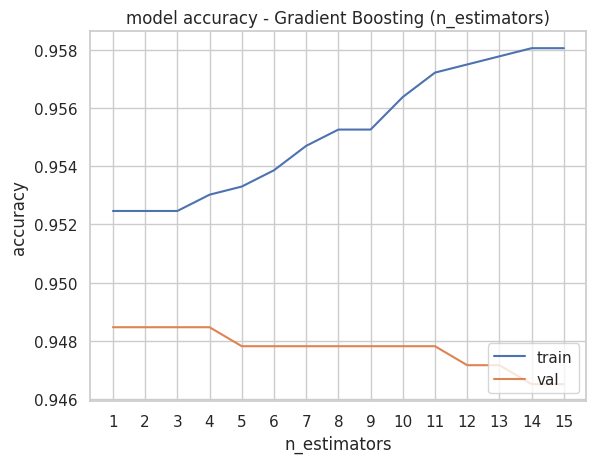

In [ ]:
history_acc_train = []
history_acc_test = []

estimators_range = range(1, 16)

for n_estimators in estimators_range:
    clf = GradientBoostingClassifier(
        n_estimators=n_estimators,
        learning_rate=0.1,
        max_depth=6,
        min_samples_split=4,
        min_samples_leaf=3,
        max_features='sqrt',
        random_state=42
    )

    clf.fit(x_treino, y_treino)

    acc_train = accuracy_score(y_treino, clf.predict(x_treino))
    acc_test = accuracy_score(y_teste, clf.predict(x_teste))

    history_acc_train.append(acc_train)
    history_acc_test.append(acc_test)

plt.plot(estimators_range, history_acc_train)
plt.plot(estimators_range, history_acc_test)
plt.title('model accuracy - Gradient Boosting (n_estimators)')
plt.ylabel('accuracy')
plt.xlabel('n_estimators')
plt.xticks(estimators_range)
plt.legend(['train', 'val'], loc='lower right')
plt.show()

Modelo: Gradient Boosting (Iteração 1)
  Accuracy:  0.9465
  Precision: 0.0000
  Recall:    0.0000
  F1 Score:  0.0000
----------------------------------------


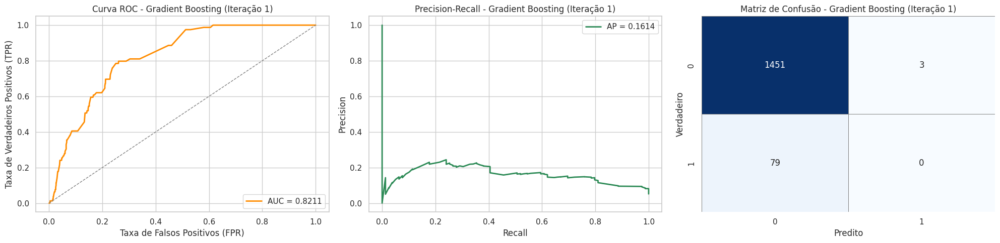

In [ ]:
gbc = GradientBoostingClassifier(n_estimators=10, max_depth=4, learning_rate=0.1, random_state=42)
gbc.fit(x_treino, y_treino)
y_pred = gbc.predict(x_teste)
y_proba = gbc.predict_proba(x_teste)[:, 1]
metricas('Gradient Boosting', 1, y_teste, y_pred, y_proba)

#### Naive bayes ####

Modelo: Naive Bayes - Gaussian (Iteração 1)
  Accuracy:  0.8813
  Precision: 0.1761
  Recall:    0.3544
  F1 Score:  0.2353
----------------------------------------


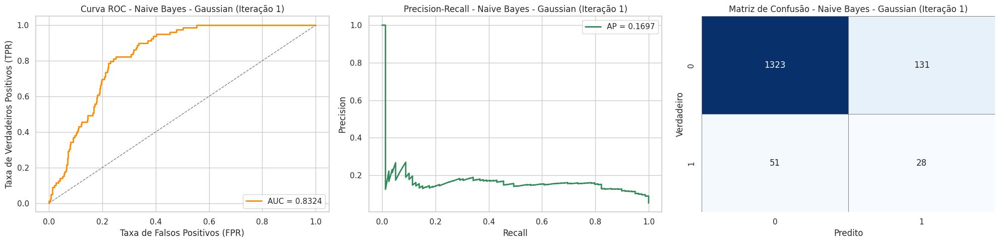

In [ ]:
nbg = SKNB.GaussianNB()

nbg.fit(x_treino, y_treino)
y_pred = nbg.predict(x_teste)
y_proba = nbg.predict_proba(x_teste)[:, 1]
metricas('Naive Bayes - Gaussian', 1, y_teste, y_pred, y_proba)

Modelo: Naive Bayes - Bernoulli (Iteração 1)
  Accuracy:  0.9439
  Precision: 0.1818
  Recall:    0.0253
  F1 Score:  0.0444
----------------------------------------


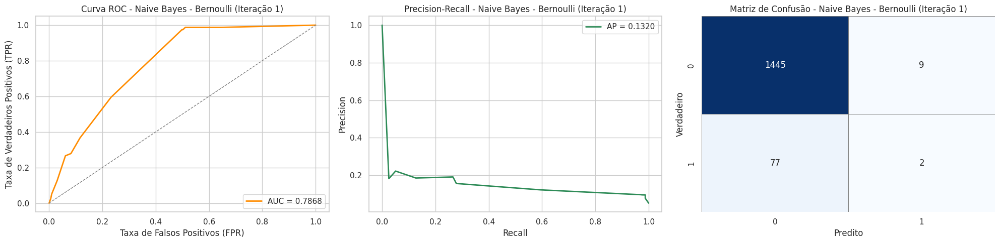

In [ ]:
nbb = SKNB.BernoulliNB()

nbb.fit(x_treino, y_treino)
y_pred = nbb.predict(x_teste)
y_proba = nbb.predict_proba(x_teste)[:, 1]
metricas('Naive Bayes - Bernoulli', 1, y_teste, y_pred, y_proba)

Modelo: Naive Bayes - Multinomial (Iteração 1)
  Accuracy:  0.7769
  Precision: 0.1166
  Recall:    0.5063
  F1 Score:  0.1896
----------------------------------------


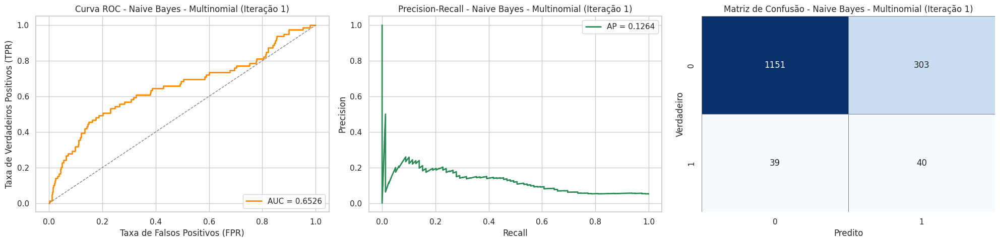

In [ ]:
nvm = SKNB.MultinomialNB()

ds2 = ds_final[['age', 'heart_disease', 'avg_glucose_level', 'hypertension', 'stroke']]
ds2 = shuffle(ds2, random_state = 42)
sel = ds2.columns.to_list()
sel.remove('stroke')

X1 = ds2[sel]
Y1 = ds2['stroke']

x_treino1, x_teste1, y_treino1, y_teste1 = train_test_split(X1, Y1, test_size=0.3, random_state=42)

nvm.fit(x_treino1, y_treino1)
y_pred = nvm.predict(x_teste1)
y_proba = nvm.predict_proba(x_teste1)[:, 1]
metricas('Naive Bayes - Multinomial', 1, y_teste, y_pred, y_proba)

#### Regressão Logistica ####

In [ ]:
rl = Sequential([
    Input(shape=(x_treino.shape[1],)),
    Dense(1, activation='sigmoid', kernel_regularizer=tf.keras.regularizers.l2(0.001))
])
rl.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy', 'auc', 'precision',  'recall'])
history1 = rl.fit(x_treino, y_treino, epochs=10, batch_size=8, validation_data=(x_teste, y_teste), verbose=0)

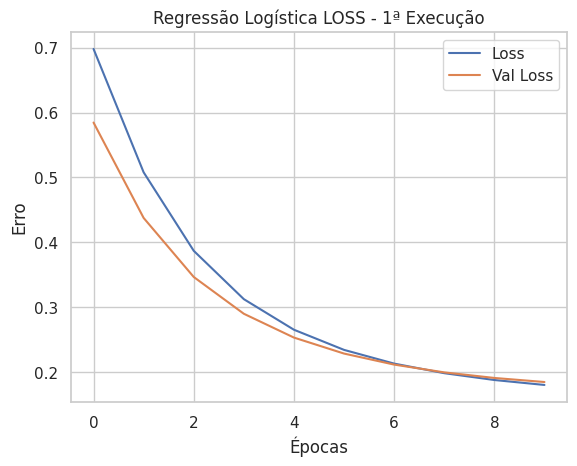

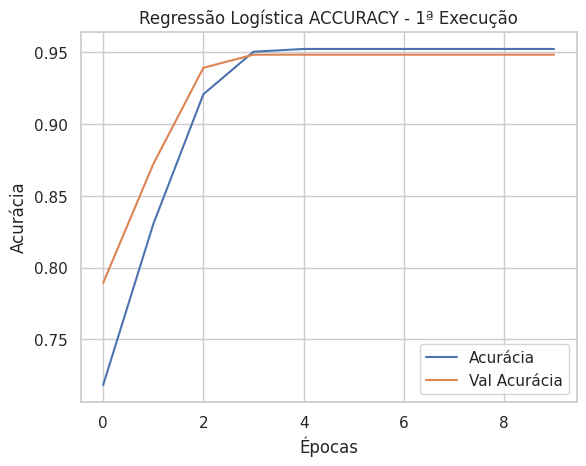

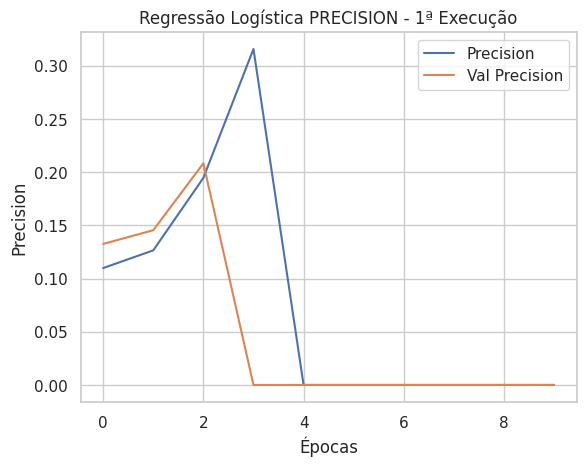

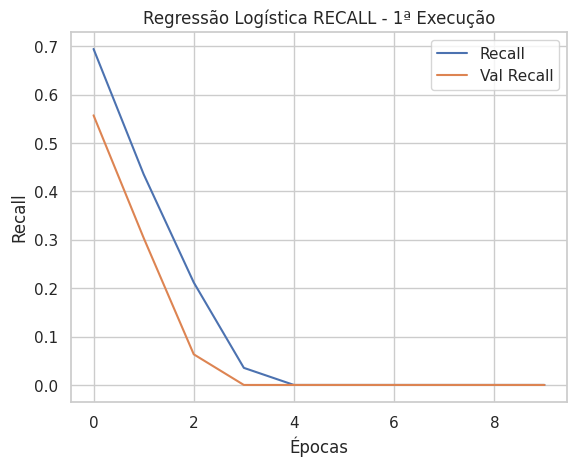

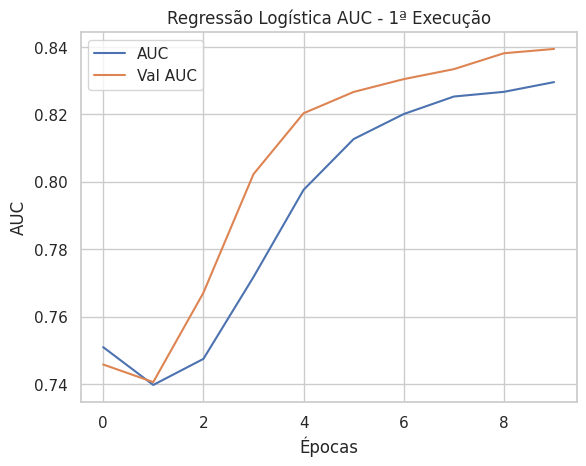

In [ ]:
plot_loss(history1, title='Regressão Logística LOSS - 1ª Execução')
plot_acc(history1, title='Regressão Logística ACCURACY - 1ª Execução')
plot_precision(history1, title='Regressão Logística PRECISION - 1ª Execução')
plot_recall(history1, title='Regressão Logística RECALL - 1ª Execução')
plot_auc(history1, title='Regressão Logística AUC - 1ª Execução')

48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Modelo: Regressão Logística (Iteração 1)
  Accuracy:  0.9485
  Precision: 0.0000
  Recall:    0.0000
  F1 Score:  0.0000
----------------------------------------


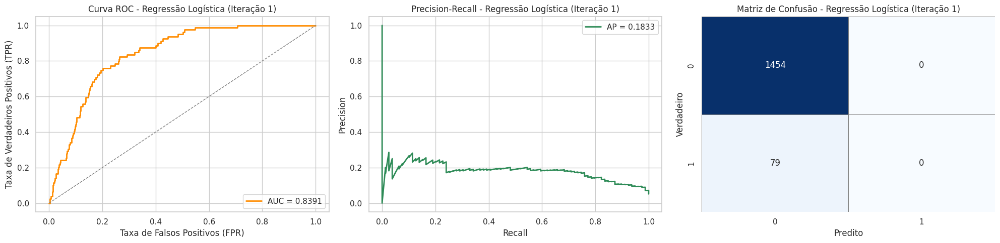

In [ ]:
y_pred = rl.predict(x_teste)
y_pred = np.round(y_pred).flatten()
y_proba = rl.predict(x_teste)
y_proba = y_proba.flatten()

metricas('Regressão Logística', 1, y_teste, y_pred, y_proba)

### Segunda Iteração ###

#### Preparação dos dados ####

In [ ]:
ds =  ds_final.copy()

continuas = [col for col in ds.columns if ds[col].nunique() > 2]

scaler = StandardScaler()
pca = PCA(n_components=0.95)
ds[continuas] = scaler.fit_transform(ds[continuas])


ds = shuffle(ds, random_state = 42)

sel = ds.columns.to_list()
sel.remove('stroke')

X = ds[sel]
X = pca.fit_transform(X)
Y = ds1['stroke']

x_treino, x_teste, y_treino, y_teste = train_test_split(X, Y, test_size=0.3, random_state=42)

#### KNN ####

Modelo: KNN (Iteração 2)
  Accuracy:  0.9426
  Precision: 0.0909
  Recall:    0.0127
  F1 Score:  0.0222
----------------------------------------


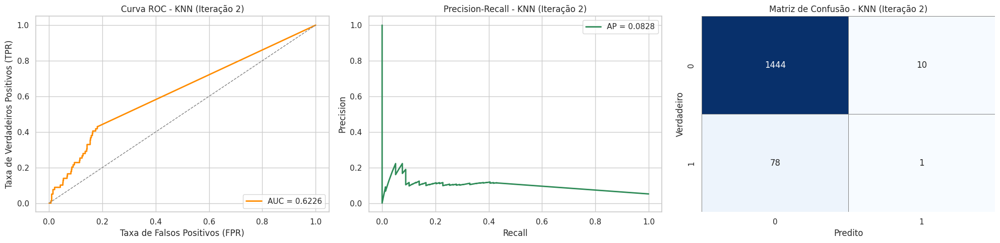

In [ ]:
knn = KNeighborsClassifier(n_neighbors=5, weights='distance', metric= 'euclidean')
knn.fit(x_treino, y_treino)
y_pred = knn.predict(x_teste)
y_proba = knn.predict_proba(x_teste)[:, 1]
metricas('KNN', 2, y_teste, y_pred, y_proba)

#### Tree ####

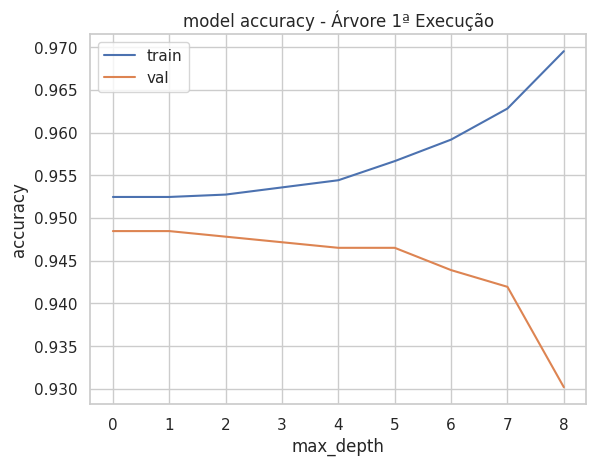

In [ ]:
history_acc_train = []
history_acc_test = []

for max_depth in range(1,10):
  clf = SKTree.DecisionTreeClassifier(criterion='entropy', max_depth=max_depth, random_state=42)
  clf = clf.fit(x_treino, y_treino)
  history_acc_train.append(accuracy_score(y_treino,  clf.predict(x_treino)))
  history_acc_test.append(accuracy_score(y_teste,  clf.predict(x_teste)))

plt.plot(history_acc_train)
plt.plot(history_acc_test)
plt.title('model accuracy - Árvore 1ª Execução')
plt.ylabel('accuracy')
plt.xlabel('max_depth')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

Modelo: Árvore (Iteração 2)
  Accuracy:  0.9478
  Precision: 0.0000
  Recall:    0.0000
  F1 Score:  0.0000
----------------------------------------


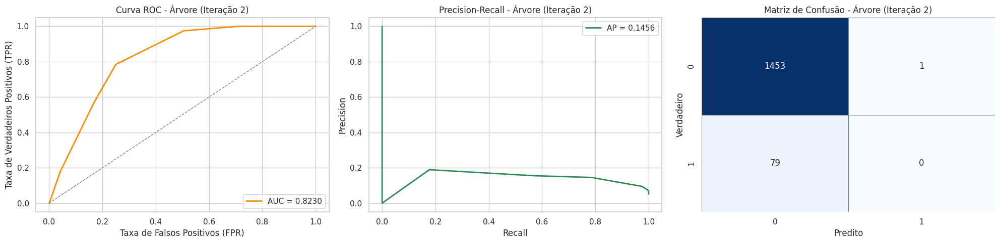

In [ ]:
tree = SKTree.DecisionTreeClassifier(criterion='entropy', max_depth=3, random_state=42)
tree.fit(x_treino, y_treino)
y_pred = tree.predict(x_teste)
y_proba = tree.predict_proba(x_teste)[:, 1]
metricas('Árvore', 2, y_teste, y_pred, y_proba)

[Text(0.4583333333333333, 0.875, 'x[0] <= 0.08\nentropy = 0.276\nsamples = 3576\nvalue = [3406, 170]'),
 Text(0.25, 0.625, 'x[1] <= -0.154\nentropy = 0.055\nsamples = 1752\nvalue = [1741, 11]'),
 Text(0.35416666666666663, 0.75, 'True  '),
 Text(0.16666666666666666, 0.375, 'x[1] <= -0.155\nentropy = 0.112\nsamples = 736\nvalue = [725, 11]'),
 Text(0.08333333333333333, 0.125, 'entropy = 0.104\nsamples = 735\nvalue = [725, 10]'),
 Text(0.25, 0.125, 'entropy = 0.0\nsamples = 1\nvalue = [0, 1]'),
 Text(0.3333333333333333, 0.375, 'entropy = 0.0\nsamples = 1016\nvalue = [1016, 0]'),
 Text(0.6666666666666666, 0.625, 'x[2] <= -0.483\nentropy = 0.427\nsamples = 1824\nvalue = [1665, 159]'),
 Text(0.5625, 0.75, '  False'),
 Text(0.5, 0.375, 'x[0] <= 1.068\nentropy = 0.603\nsamples = 692\nvalue = [590, 102]'),
 Text(0.4166666666666667, 0.125, 'entropy = 0.517\nsamples = 509\nvalue = [450, 59]'),
 Text(0.5833333333333334, 0.125, 'entropy = 0.787\nsamples = 183\nvalue = [140, 43]'),
 Text(0.833333333

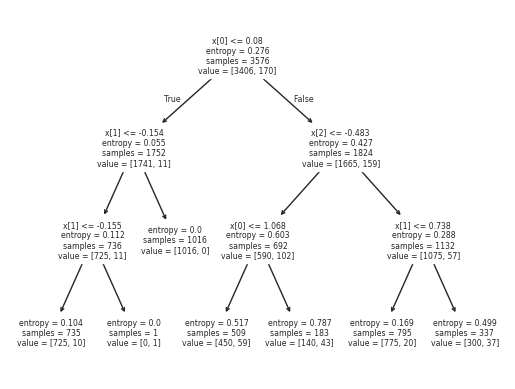

In [ ]:
SKTree.plot_tree(tree)

#### Random Forest

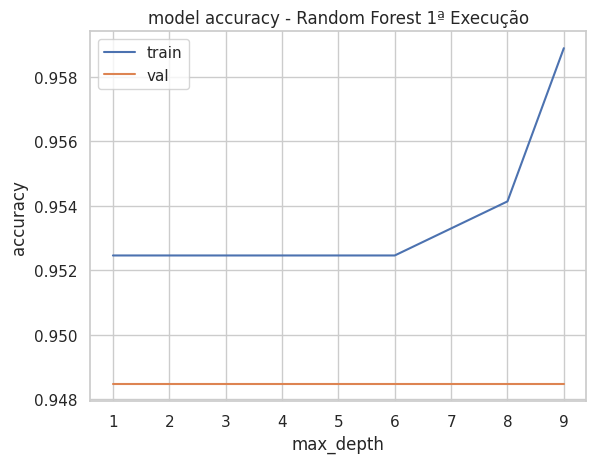

In [ ]:
history_acc_train = []
history_acc_test = []


for max_depth in range(1, 10):
    clf = RandomForestClassifier(
        n_estimators=100,
        criterion='entropy',
        max_depth=max_depth,
        random_state=42,
        n_jobs=-1
    )

    clf.fit(x_treino, y_treino)

    acc_train = accuracy_score(y_treino, clf.predict(x_treino))
    acc_test = accuracy_score(y_teste, clf.predict(x_teste))

    history_acc_train.append(acc_train)
    history_acc_test.append(acc_test)

plt.plot(range(1, 10), history_acc_train)
plt.plot(range(1, 10), history_acc_test)
plt.title('model accuracy - Random Forest 1ª Execução')
plt.ylabel('accuracy')
plt.xlabel('max_depth')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

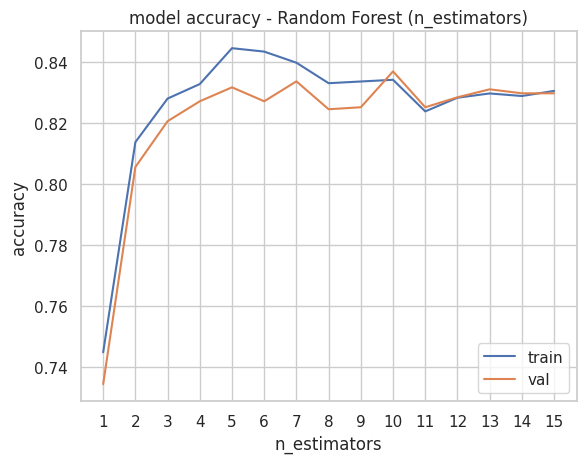

In [ ]:
history_acc_train = []
history_acc_test = []

estimators_range = range(1, 16)

for n_estimators in estimators_range:
    clf = RandomForestClassifier(
        n_estimators=n_estimators,
        criterion='entropy',
        max_depth=6,
        min_samples_split=4,
        min_samples_leaf=3,
        max_features='sqrt',
        class_weight='balanced',
        random_state=42,
        n_jobs=-1
    )

    clf.fit(x_treino, y_treino)

    acc_train = accuracy_score(y_treino, clf.predict(x_treino))
    acc_test = accuracy_score(y_teste, clf.predict(x_teste))

    history_acc_train.append(acc_train)
    history_acc_test.append(acc_test)

plt.plot(estimators_range, history_acc_train)
plt.plot(estimators_range, history_acc_test)
plt.title('model accuracy - Random Forest (n_estimators)')
plt.ylabel('accuracy')
plt.xlabel('n_estimators')
plt.xticks(estimators_range)
plt.legend(['train', 'val'], loc='lower right')
plt.show()

Modelo: Random Forest (Iteração 2)
  Accuracy:  0.8258
  Precision: 0.1569
  Recall:    0.5443
  F1 Score:  0.2436
----------------------------------------


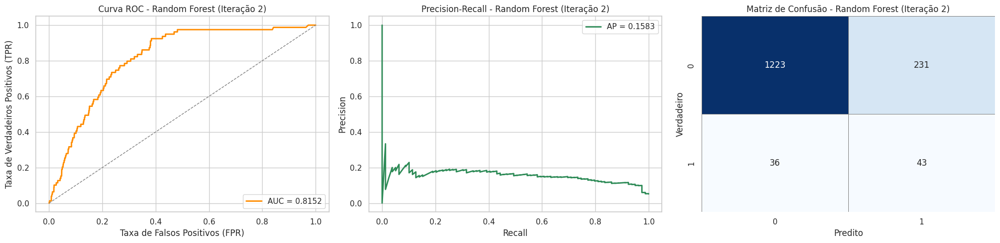

In [ ]:
rfc = RandomForestClassifier(n_estimators=10, max_depth= 6, max_features='sqrt', class_weight='balanced', random_state=42, n_jobs=-1)
rfc.fit(x_treino, y_treino)
y_pred = rfc.predict(x_teste)
y_proba = rfc.predict_proba(x_teste)[:, 1]
metricas('Random Forest', 2, y_teste, y_pred, y_proba)

#### Gradient Booster Classifier ####

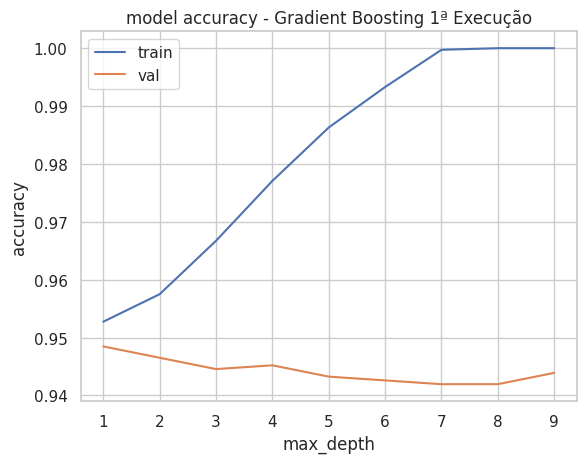

In [ ]:
history_acc_train = []
history_acc_test = []

for max_depth in range(1, 10):
    gbc = GradientBoostingClassifier(
        n_estimators=100,
        learning_rate=0.1,
        max_depth=max_depth,
        random_state=42
    )

    gbc.fit(x_treino, y_treino)

    acc_train = accuracy_score(y_treino, gbc.predict(x_treino))
    acc_test = accuracy_score(y_teste, gbc.predict(x_teste))

    history_acc_train.append(acc_train)
    history_acc_test.append(acc_test)


plt.plot(range(1, 10), history_acc_train)
plt.plot(range(1, 10), history_acc_test)
plt.title('model accuracy - Gradient Boosting 1ª Execução')
plt.ylabel('accuracy')
plt.xlabel('max_depth')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

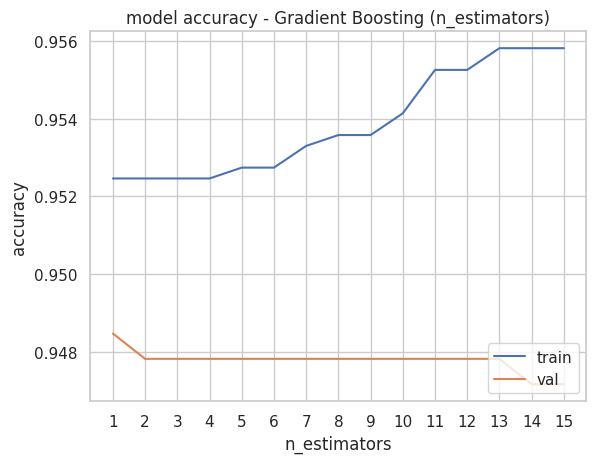

In [ ]:
history_acc_train = []
history_acc_test = []

estimators_range = range(1, 16)

for n_estimators in estimators_range:
    clf = GradientBoostingClassifier(
        n_estimators=n_estimators,
        learning_rate=0.1,
        max_depth=4,
        min_samples_split=4,
        min_samples_leaf=3,
        max_features='sqrt',
        random_state=42
    )

    clf.fit(x_treino, y_treino)

    acc_train = accuracy_score(y_treino, clf.predict(x_treino))
    acc_test = accuracy_score(y_teste, clf.predict(x_teste))

    history_acc_train.append(acc_train)
    history_acc_test.append(acc_test)

plt.plot(estimators_range, history_acc_train)
plt.plot(estimators_range, history_acc_test)
plt.title('model accuracy - Gradient Boosting (n_estimators)')
plt.ylabel('accuracy')
plt.xlabel('n_estimators')
plt.xticks(estimators_range)
plt.legend(['train', 'val'], loc='lower right')
plt.show()

Modelo: Gradient Boosting (Iteração 2)
  Accuracy:  0.9485
  Precision: 0.0000
  Recall:    0.0000
  F1 Score:  0.0000
----------------------------------------


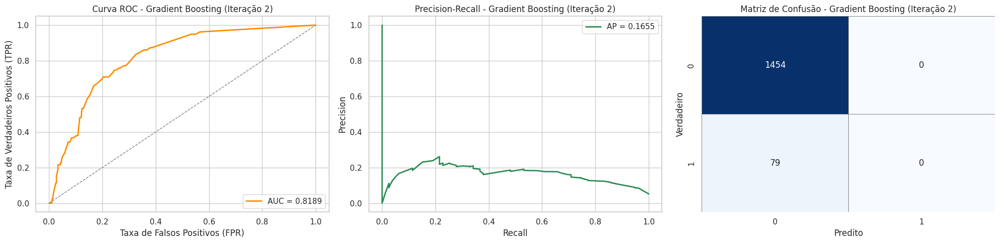

In [ ]:
gbc = GradientBoostingClassifier(n_estimators=5, max_depth=4, learning_rate=0.1, random_state=42)
gbc.fit(x_treino, y_treino)
y_pred = gbc.predict(x_teste)
y_proba = gbc.predict_proba(x_teste)[:, 1]
metricas('Gradient Boosting', 2, y_teste, y_pred, y_proba)

#### Naive bayes ####

Modelo: Naive Bayes - Gaussian (Iteração 2)
  Accuracy:  0.9472
  Precision: 0.4500
  Recall:    0.1139
  F1 Score:  0.1818
----------------------------------------


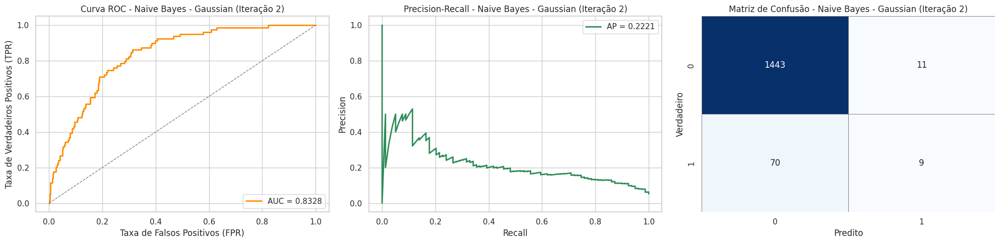

In [ ]:
nbg = SKNB.GaussianNB()

nbg.fit(x_treino, y_treino)
y_pred = nbg.predict(x_teste)
y_proba = nbg.predict_proba(x_teste)[:, 1]
metricas('Naive Bayes - Gaussian', 2, y_teste, y_pred, y_proba)

Modelo: Naive Bayes - Bernoulli (Iteração 2)
  Accuracy:  0.9485
  Precision: 0.0000
  Recall:    0.0000
  F1 Score:  0.0000
----------------------------------------


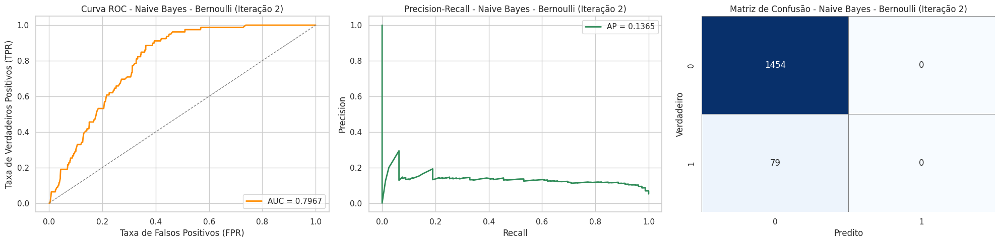

In [ ]:
nbb = SKNB.BernoulliNB()

nbb.fit(x_treino, y_treino)
y_pred = nbb.predict(x_teste)
y_proba = nbb.predict_proba(x_teste)[:, 1]
metricas('Naive Bayes - Bernoulli', 2, y_teste, y_pred, y_proba)

/usr/local/lib/python3.11/dist-packages/sklearn/decomposition/_nmf.py:1742: ConvergenceWarning: Maximum number of iterations 195 reached. Increase it to improve convergence.
  warnings.warn(


Modelo: Naive Bayes - Multinomial (Iteração 2)
  Accuracy:  0.8858
  Precision: 0.1800
  Recall:    0.3418
  F1 Score:  0.2358
----------------------------------------


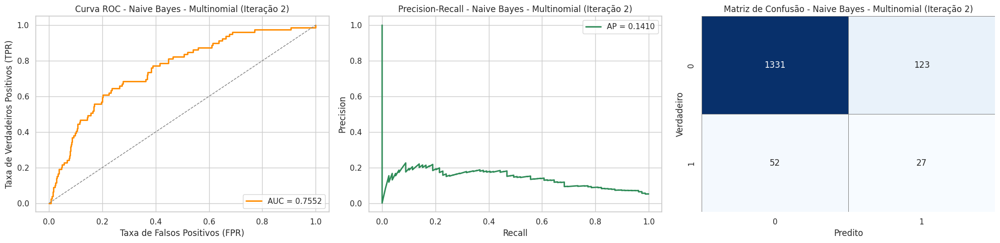

In [ ]:
nvm = SKNB.MultinomialNB()

ds2 = ds_final.copy()
ds2 = shuffle(ds2, random_state = 42)
sel = ds2.columns.to_list()
sel.remove('stroke')

nmf = NMF(n_components=8, init='random', random_state=42, verbose=0, max_iter=195)

X1 = ds2[sel]
X1 = nmf.fit_transform(X1)
Y1 = ds2['stroke']

x_treino1, x_teste1, y_treino1, y_teste1 = train_test_split(X1, Y1, test_size=0.3, random_state=42)

nvm.fit(x_treino1, y_treino1)
y_pred = nvm.predict(x_teste1)
y_proba = nvm.predict_proba(x_teste1)[:, 1]
metricas('Naive Bayes - Multinomial', 2, y_teste, y_pred, y_proba)

#### Regressão Logistica ####

In [ ]:
rl = Sequential([
    Input(shape=(x_treino.shape[1],)),
    Dense(1, activation='sigmoid', kernel_regularizer=tf.keras.regularizers.l2(0.001))
])
rl.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy', 'auc', 'precision',  'recall'])
history1 = rl.fit(x_treino, y_treino, epochs=8, batch_size=8, validation_data=(x_teste, y_teste), verbose=0)

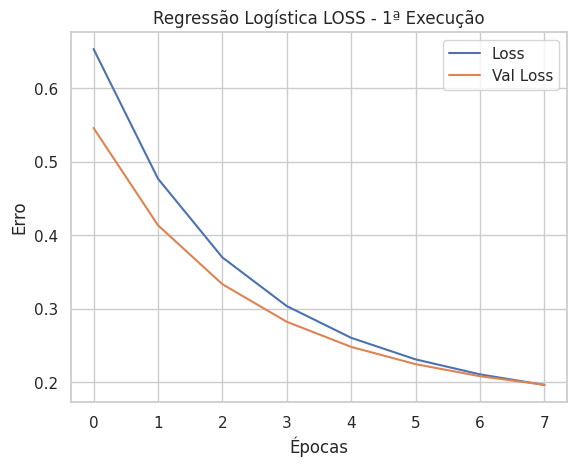

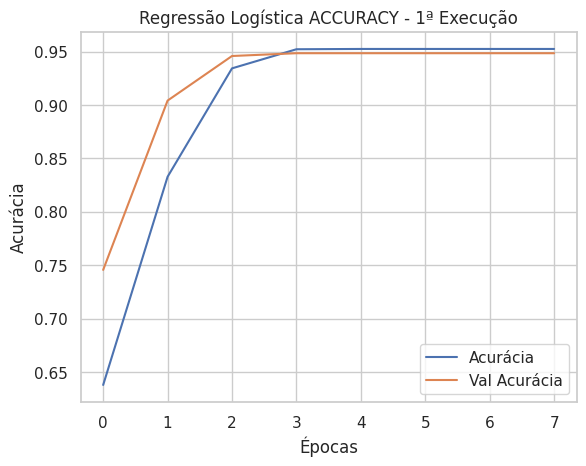

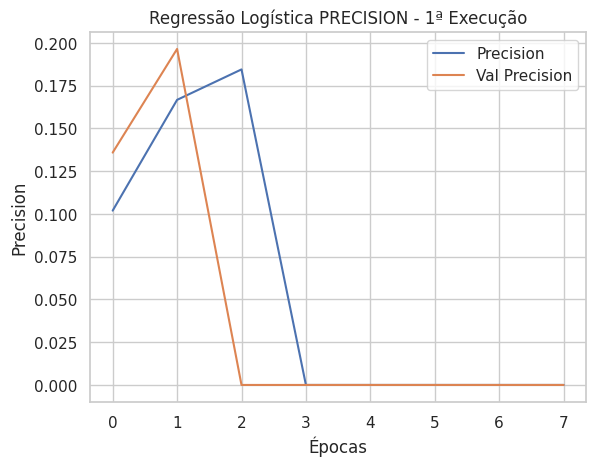

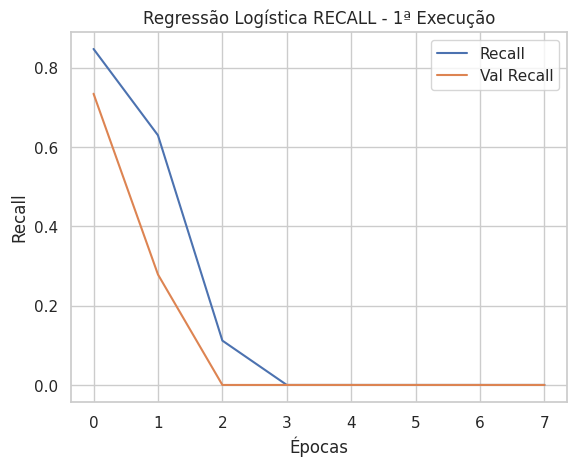

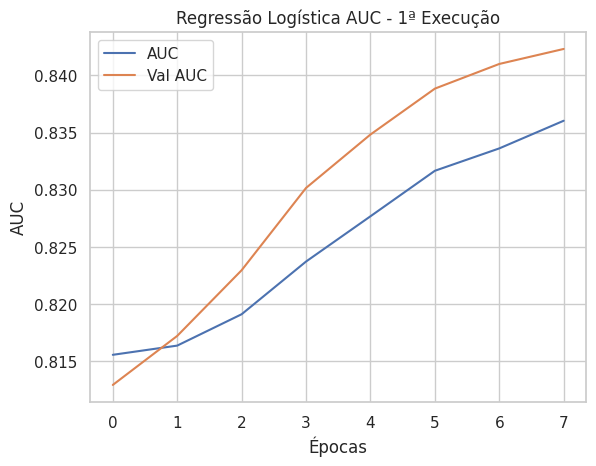

In [ ]:
plot_loss(history1, title='Regressão Logística LOSS - 1ª Execução')
plot_acc(history1, title='Regressão Logística ACCURACY - 1ª Execução')
plot_precision(history1, title='Regressão Logística PRECISION - 1ª Execução')
plot_recall(history1, title='Regressão Logística RECALL - 1ª Execução')
plot_auc(history1, title='Regressão Logística AUC - 1ª Execução')

48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Modelo: Regressão Logística (Iteração 2)
  Accuracy:  0.9485
  Precision: 0.0000
  Recall:    0.0000
  F1 Score:  0.0000
----------------------------------------


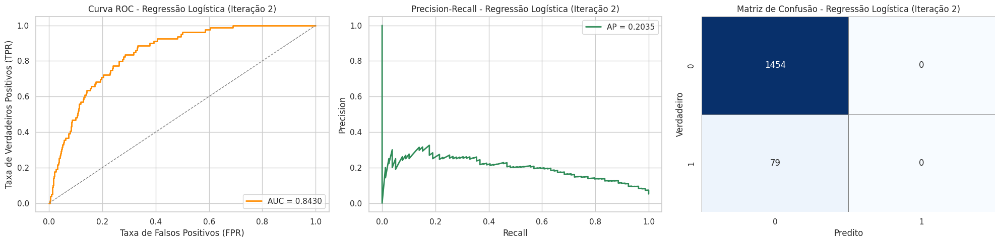

In [ ]:
y_pred = rl.predict(x_teste)
y_pred = np.round(y_pred).flatten()
y_proba = rl.predict(x_teste)
y_proba = y_proba.flatten()

metricas('Regressão Logística', 2, y_teste, y_pred, y_proba)

### Terceira iteração ####

#### Preparação dos dados ####

In [ ]:
ds =  ds_final.copy()

ds_maioria = ds[ds['stroke'] == 0]
ds_minoria = ds[ds['stroke'] == 1]

n_minoria = len(ds_minoria)
n_total = int(n_minoria / 0.10)
n_maioria = n_total - n_minoria

ds_maioria = resample(
    ds_maioria,
    replace=False,
    n_samples=n_maioria,
    random_state=42
)

ds_downsampled = pd.concat([ds_maioria, ds_minoria])
ds_downsampled = ds_downsampled.sample(frac=1, random_state=42).reset_index(drop=True)

continuas = [col for col in ds.columns if ds[col].nunique() > 2]

scaler = StandardScaler()
ds[continuas] = scaler.fit_transform(ds[continuas])

ds1 = ds[['age', 'heart_disease', 'avg_glucose_level', 'hypertension', 'stroke']]
ds1 = shuffle(ds1, random_state = 42)

sel = ds1.columns.to_list()
sel.remove('stroke')

X = ds1[sel]
Y = ds1['stroke']

x_treino, x_teste, y_treino, y_teste = train_test_split(X, Y, test_size=0.3, random_state=42)

#### KNN ####

Modelo: KNN (Iteração 3)
  Accuracy:  0.9348
  Precision: 0.1111
  Recall:    0.0380
  F1 Score:  0.0566
----------------------------------------


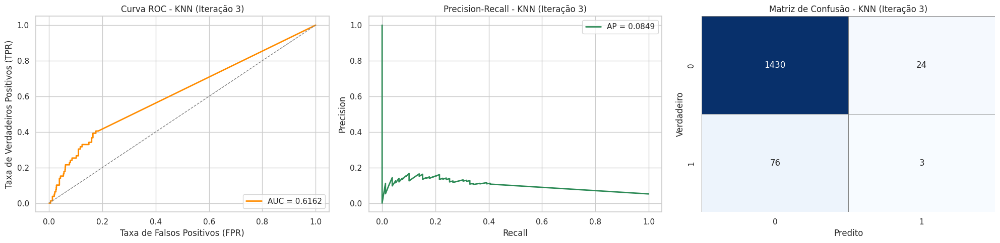

In [ ]:
knn = KNeighborsClassifier(n_neighbors=5, weights='distance', metric= 'euclidean')
knn.fit(x_treino, y_treino)
y_pred = knn.predict(x_teste)
y_proba = knn.predict_proba(x_teste)[:, 1]
metricas('KNN', 3, y_teste, y_pred, y_proba)

#### Árvore ####

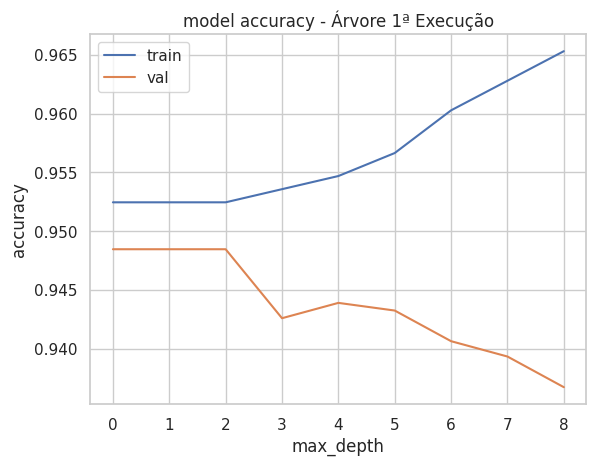

In [ ]:
history_acc_train = []
history_acc_test = []

for max_depth in range(1,10):
  clf = SKTree.DecisionTreeClassifier(criterion='entropy', max_depth=max_depth, random_state=42)
  clf = clf.fit(x_treino, y_treino)
  history_acc_train.append(accuracy_score(y_treino,  clf.predict(x_treino)))
  history_acc_test.append(accuracy_score(y_teste,  clf.predict(x_teste)))

plt.plot(history_acc_train)
plt.plot(history_acc_test)
plt.title('model accuracy - Árvore 1ª Execução')
plt.ylabel('accuracy')
plt.xlabel('max_depth')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

Modelo: Árvore (Iteração 3)
  Accuracy:  0.9485
  Precision: 0.0000
  Recall:    0.0000
  F1 Score:  0.0000
----------------------------------------


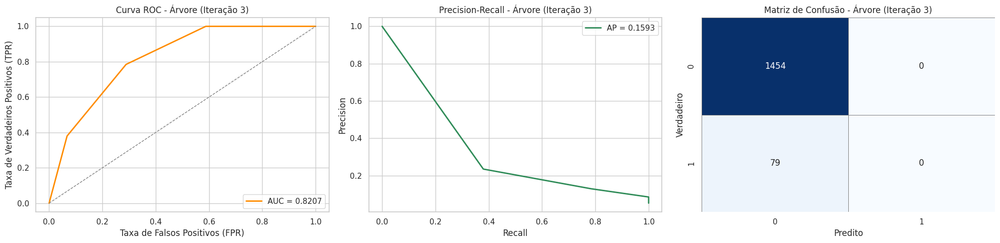

In [ ]:
tree = SKTree.DecisionTreeClassifier(criterion='entropy', max_depth=2, random_state=42)
tree.fit(x_treino, y_treino)
y_pred = tree.predict(x_teste)
y_proba = tree.predict_proba(x_teste)[:, 1]
metricas('Árvore', 3, y_teste, y_pred, y_proba)

[Text(0.5, 0.8333333333333334, 'x[0] <= 0.587\nentropy = 0.276\nsamples = 3576\nvalue = [3406, 170]'),
 Text(0.25, 0.5, 'x[0] <= -0.253\nentropy = 0.082\nsamples = 2439\nvalue = [2414, 25]'),
 Text(0.375, 0.6666666666666667, 'True  '),
 Text(0.125, 0.16666666666666666, 'entropy = 0.022\nsamples = 1427\nvalue = [1424.0, 3.0]'),
 Text(0.375, 0.16666666666666666, 'entropy = 0.151\nsamples = 1012\nvalue = [990, 22]'),
 Text(0.75, 0.5, 'x[0] <= 1.427\nentropy = 0.551\nsamples = 1137\nvalue = [992, 145]'),
 Text(0.625, 0.6666666666666667, '  False'),
 Text(0.625, 0.16666666666666666, 'entropy = 0.465\nsamples = 800\nvalue = [721, 79]'),
 Text(0.875, 0.16666666666666666, 'entropy = 0.714\nsamples = 337\nvalue = [271, 66]')]

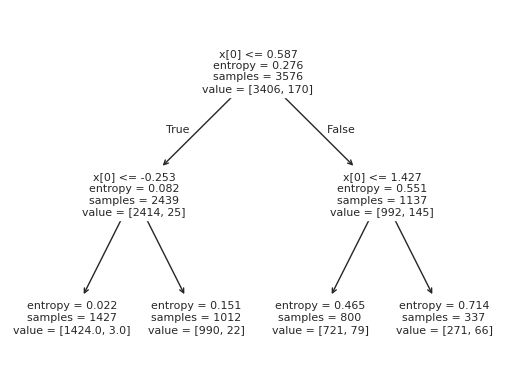

In [ ]:
SKTree.plot_tree(tree)

#### Random Forest ####

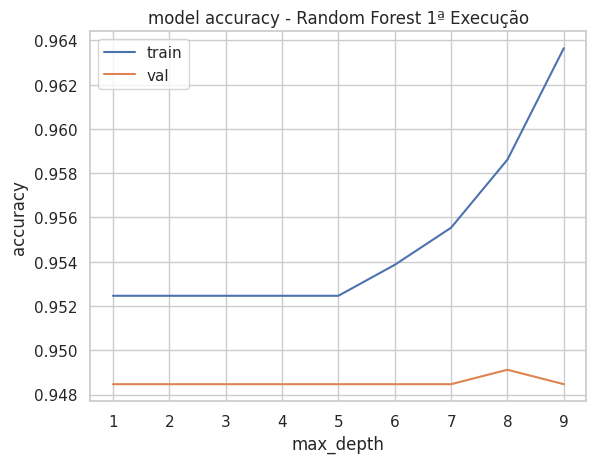

In [ ]:
history_acc_train = []
history_acc_test = []


for max_depth in range(1, 10):
    clf = RandomForestClassifier(
        n_estimators=100,
        criterion='entropy',
        max_depth=max_depth,
        random_state=42,
        n_jobs=-1
    )

    clf.fit(x_treino, y_treino)

    acc_train = accuracy_score(y_treino, clf.predict(x_treino))
    acc_test = accuracy_score(y_teste, clf.predict(x_teste))

    history_acc_train.append(acc_train)
    history_acc_test.append(acc_test)

plt.plot(range(1, 10), history_acc_train)
plt.plot(range(1, 10), history_acc_test)
plt.title('model accuracy - Random Forest 1ª Execução')
plt.ylabel('accuracy')
plt.xlabel('max_depth')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

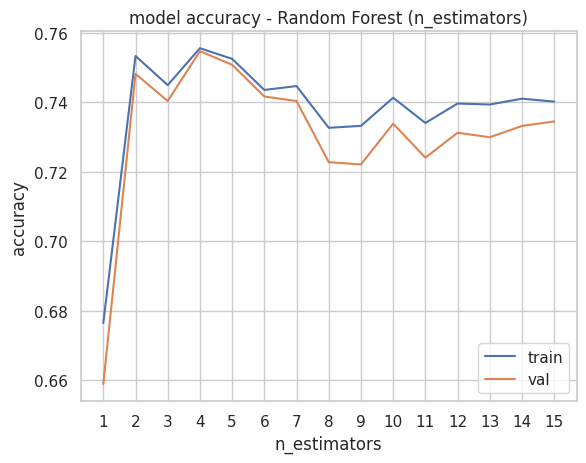

In [ ]:
history_acc_train = []
history_acc_test = []

estimators_range = range(1, 16)

for n_estimators in estimators_range:
    clf = RandomForestClassifier(
        n_estimators=n_estimators,
        criterion='entropy',
        max_depth=5,
        min_samples_split=4,
        min_samples_leaf=3,
        max_features='sqrt',
        class_weight='balanced',
        random_state=42,
        n_jobs=-1
    )

    clf.fit(x_treino, y_treino)

    acc_train = accuracy_score(y_treino, clf.predict(x_treino))
    acc_test = accuracy_score(y_teste, clf.predict(x_teste))

    history_acc_train.append(acc_train)
    history_acc_test.append(acc_test)

plt.plot(estimators_range, history_acc_train)
plt.plot(estimators_range, history_acc_test)
plt.title('model accuracy - Random Forest (n_estimators)')
plt.ylabel('accuracy')
plt.xlabel('n_estimators')
plt.xticks(estimators_range)
plt.legend(['train', 'val'], loc='lower right')
plt.show()

Modelo: Random Forest (Iteração 3)
  Accuracy:  0.7423
  Precision: 0.1291
  Recall:    0.6962
  F1 Score:  0.2178
----------------------------------------


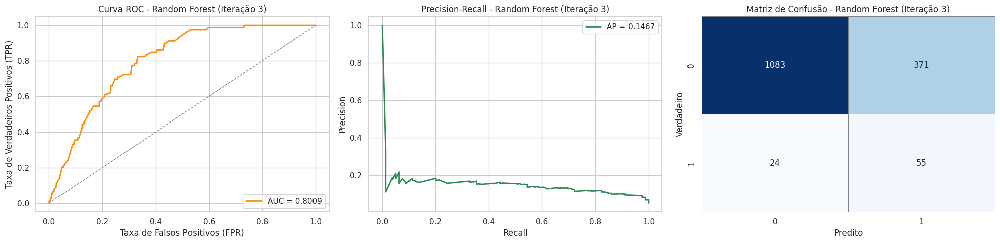

In [ ]:
rfc = RandomForestClassifier(n_estimators=4, max_depth= 5, max_features='sqrt', class_weight='balanced', random_state=42, n_jobs=-1)
rfc.fit(x_treino, y_treino)
y_pred = rfc.predict(x_teste)
y_proba = rfc.predict_proba(x_teste)[:, 1]
metricas('Random Forest', 3, y_teste, y_pred, y_proba)

#### Gradient Booster Classifier ####

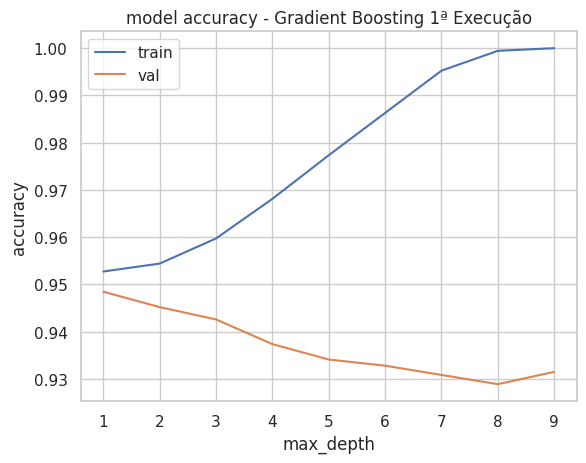

In [ ]:
history_acc_train = []
history_acc_test = []

for max_depth in range(1, 10):
    gbc = GradientBoostingClassifier(
        n_estimators=100,
        learning_rate=0.1,
        max_depth=max_depth,
        random_state=42
    )

    gbc.fit(x_treino, y_treino)

    acc_train = accuracy_score(y_treino, gbc.predict(x_treino))
    acc_test = accuracy_score(y_teste, gbc.predict(x_teste))

    history_acc_train.append(acc_train)
    history_acc_test.append(acc_test)


plt.plot(range(1, 10), history_acc_train)
plt.plot(range(1, 10), history_acc_test)
plt.title('model accuracy - Gradient Boosting 1ª Execução')
plt.ylabel('accuracy')
plt.xlabel('max_depth')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

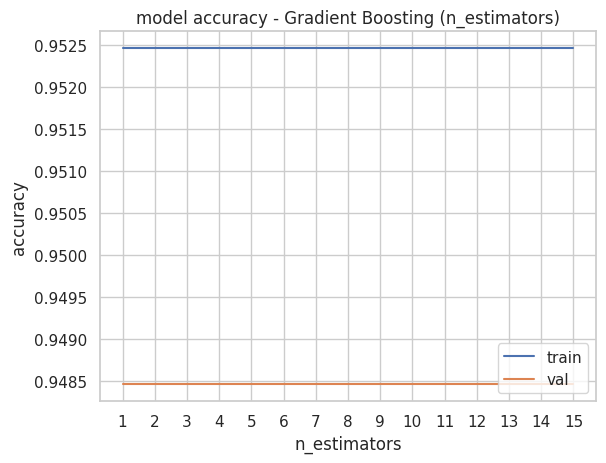

In [ ]:
history_acc_train = []
history_acc_test = []

estimators_range = range(1, 16)

for n_estimators in estimators_range:
    clf = GradientBoostingClassifier(
        n_estimators=n_estimators,
        learning_rate=0.1,
        max_depth=2,
        min_samples_split=4,
        min_samples_leaf=3,
        max_features='sqrt',
        random_state=42
    )

    clf.fit(x_treino, y_treino)

    acc_train = accuracy_score(y_treino, clf.predict(x_treino))
    acc_test = accuracy_score(y_teste, clf.predict(x_teste))

    history_acc_train.append(acc_train)
    history_acc_test.append(acc_test)

plt.plot(estimators_range, history_acc_train)
plt.plot(estimators_range, history_acc_test)
plt.title('model accuracy - Gradient Boosting (n_estimators)')
plt.ylabel('accuracy')
plt.xlabel('n_estimators')
plt.xticks(estimators_range)
plt.legend(['train', 'val'], loc='lower right')
plt.show()

Modelo: Gradient Boosting (Iteração 3)
  Accuracy:  0.9465
  Precision: 0.0000
  Recall:    0.0000
  F1 Score:  0.0000
----------------------------------------


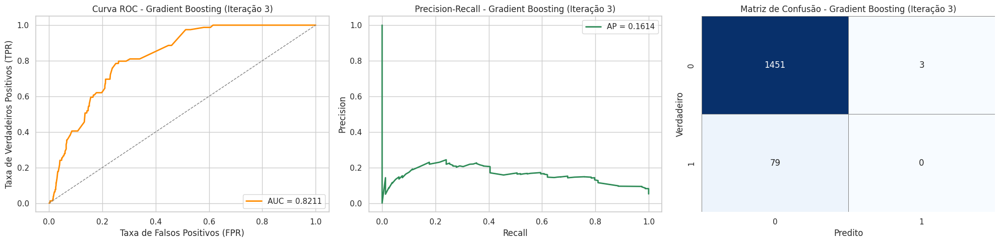

In [ ]:
gbc = GradientBoostingClassifier(n_estimators=10, max_depth=4, learning_rate=0.1, random_state=42)
gbc.fit(x_treino, y_treino)
y_pred = gbc.predict(x_teste)
y_proba = gbc.predict_proba(x_teste)[:, 1]
metricas('Gradient Boosting', 3, y_teste, y_pred, y_proba)

#### Naive bayes ####

Modelo: Naive Bayes - Gaussian (Iteração 3)
  Accuracy:  0.8813
  Precision: 0.1761
  Recall:    0.3544
  F1 Score:  0.2353
----------------------------------------


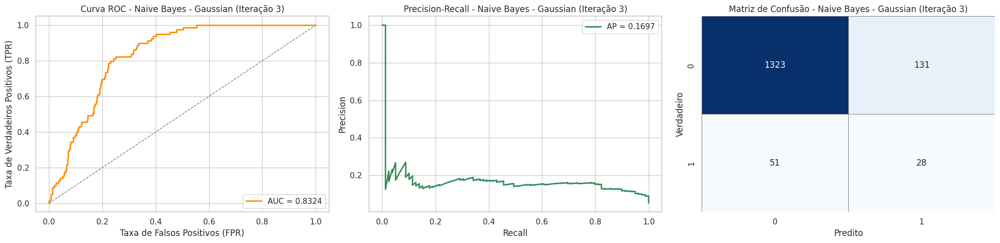

In [ ]:
nbg = SKNB.GaussianNB()

nbg.fit(x_treino, y_treino)
y_pred = nbg.predict(x_teste)
y_proba = nbg.predict_proba(x_teste)[:, 1]
metricas('Naive Bayes - Gaussian', 3, y_teste, y_pred, y_proba)

Modelo: Naive Bayes - Bernoulli (Iteração 3)
  Accuracy:  0.9439
  Precision: 0.1818
  Recall:    0.0253
  F1 Score:  0.0444
----------------------------------------


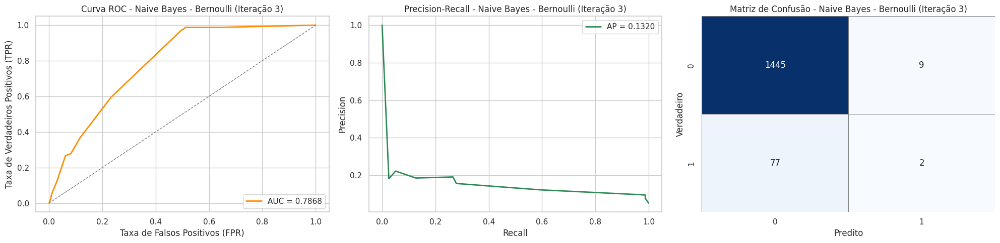

In [ ]:
nbb = SKNB.BernoulliNB()

nbb.fit(x_treino, y_treino)
y_pred = nbb.predict(x_teste)
y_proba = nbb.predict_proba(x_teste)[:, 1]
metricas('Naive Bayes - Bernoulli', 3, y_teste, y_pred, y_proba)

Modelo: Naive Bayes - Multinomial (Iteração 3)
  Accuracy:  0.7769
  Precision: 0.1166
  Recall:    0.5063
  F1 Score:  0.1896
----------------------------------------


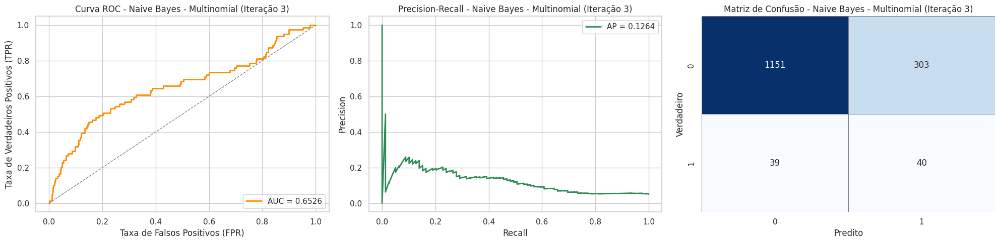

In [ ]:
nvm = SKNB.MultinomialNB()

ds2 = ds_final[['age', 'heart_disease', 'avg_glucose_level', 'hypertension', 'stroke']]

ds2_maioria = ds2[ds2['stroke'] == 0]
ds2_minoria = ds2[ds2['stroke'] == 1]

n_minoria = len(ds2_minoria)
n_total = int(n_minoria / 0.10)
n_maioria = n_total - n_minoria

ds2_maioria = resample(
    ds2_maioria,
    replace=False,
    n_samples=n_maioria,
    random_state=4
)

ds2_downsampled = pd.concat([ds2_maioria, ds2_minoria])
ds2_downsampled = ds2_downsampled.sample(frac=1, random_state=42).reset_index(drop=True)

ds2 = shuffle(ds2, random_state = 42)
sel = ds2.columns.to_list()
sel.remove('stroke')

X1 = ds2[sel]
Y1 = ds2['stroke']

x_treino1, x_teste1, y_treino1, y_teste1 = train_test_split(X1, Y1, test_size=0.3, random_state=42)

nvm.fit(x_treino1, y_treino1)
y_pred = nvm.predict(x_teste1)
y_proba = nvm.predict_proba(x_teste1)[:, 1]
metricas('Naive Bayes - Multinomial', 3, y_teste, y_pred, y_proba)

#### Regressão Logistica ####

In [ ]:
rl = Sequential([
    Input(shape=(x_treino.shape[1],)),
    Dense(1, activation='sigmoid', kernel_regularizer=tf.keras.regularizers.l2(0.001))
])
rl.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy', 'auc', 'precision',  'recall'])
history1 = rl.fit(x_treino, y_treino, epochs=10, batch_size=8, validation_data=(x_teste, y_teste), verbose=0)

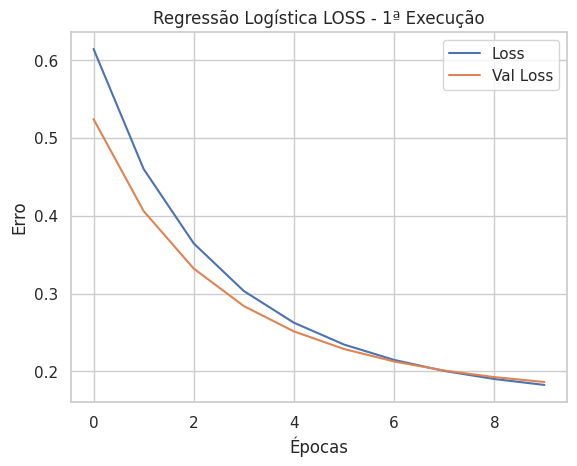

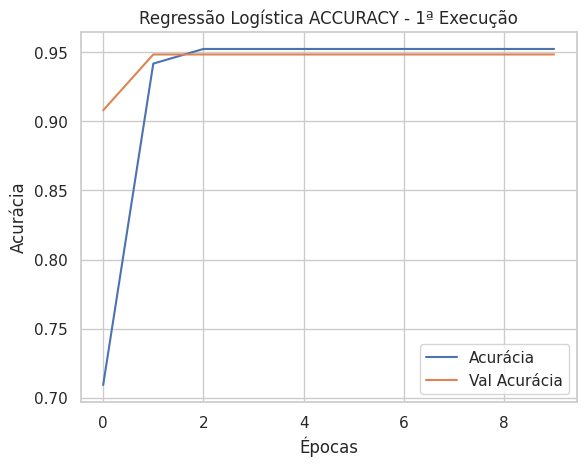

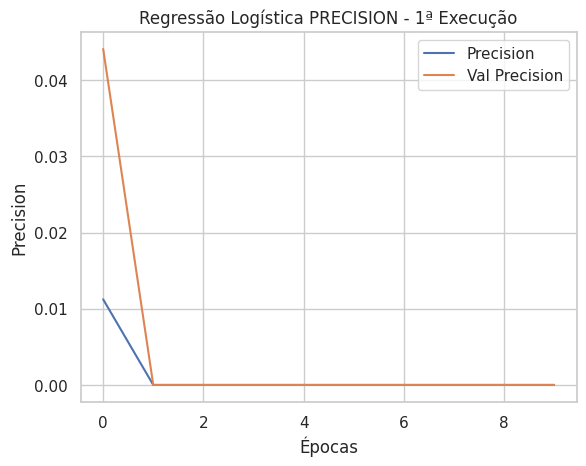

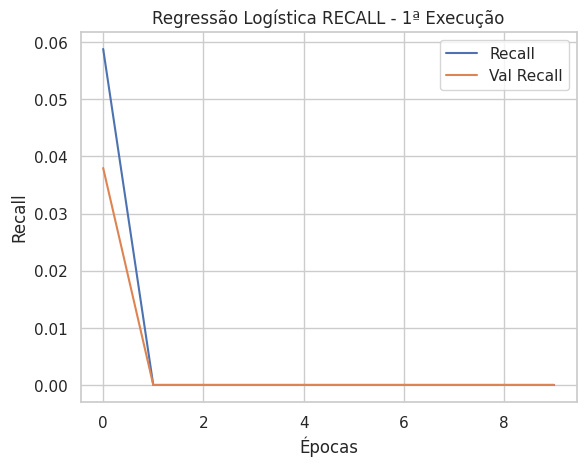

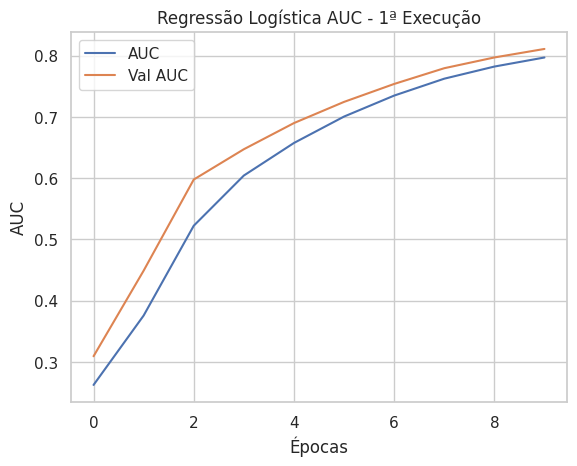

In [ ]:
plot_loss(history1, title='Regressão Logística LOSS - 1ª Execução')
plot_acc(history1, title='Regressão Logística ACCURACY - 1ª Execução')
plot_precision(history1, title='Regressão Logística PRECISION - 1ª Execução')
plot_recall(history1, title='Regressão Logística RECALL - 1ª Execução')
plot_auc(history1, title='Regressão Logística AUC - 1ª Execução')

48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Modelo: Regressão Logística (Iteração 3)
  Accuracy:  0.9485
  Precision: 0.0000
  Recall:    0.0000
  F1 Score:  0.0000
----------------------------------------


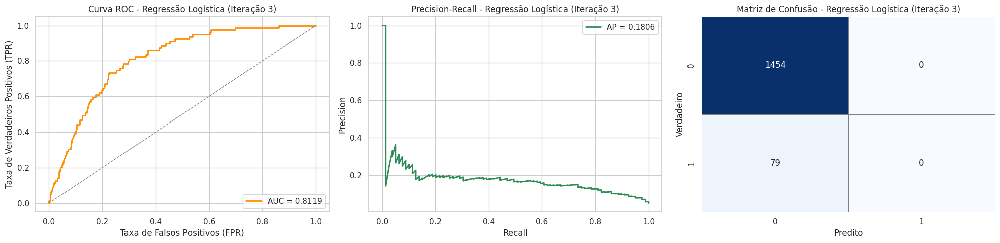

In [ ]:
y_pred = rl.predict(x_teste)
y_pred = np.round(y_pred).flatten()
y_proba = rl.predict(x_teste)
y_proba = y_proba.flatten()

metricas('Regressão Logística', 3, y_teste, y_pred, y_proba)

### Quarta iteração ####

#### Preparação dos dados ####

In [ ]:
ds =  ds_final.copy()

ds_maioria = ds[ds['stroke'] == 0]
ds_minoria = ds[ds['stroke'] == 1]

n_minoria = len(ds_minoria)
n_total = int(n_minoria / 0.10)
n_maioria = n_total - n_minoria

ds_maioria = resample(
    ds_maioria,
    replace=False,
    n_samples=n_maioria,
    random_state=42
)

ds_downsampled = pd.concat([ds_maioria, ds_minoria])
ds_downsampled = ds_downsampled.sample(frac=1, random_state=42).reset_index(drop=True)

continuas = [col for col in ds.columns if ds[col].nunique() > 2]

scaler = StandardScaler()
ds[continuas] = scaler.fit_transform(ds[continuas])

ds = shuffle(ds, random_state = 42)

sel = ds.columns.to_list()
sel.remove('stroke')

X = ds[sel]
X = pca.fit_transform(X)
Y = ds['stroke']

x_treino, x_teste, y_treino, y_teste = train_test_split(X, Y, test_size=0.3, random_state=42)

#### KNN ####

Modelo: KNN (Iteração 4)
  Accuracy:  0.9426
  Precision: 0.0909
  Recall:    0.0127
  F1 Score:  0.0222
----------------------------------------


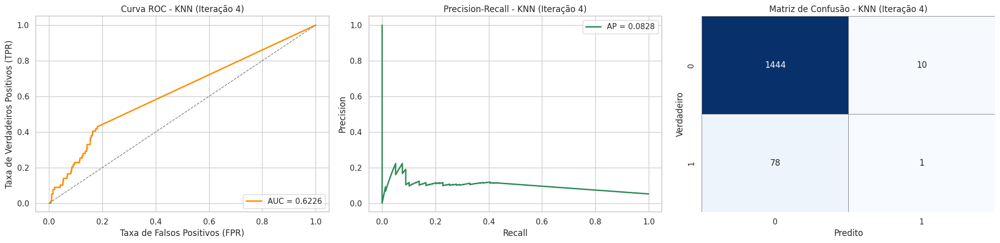

In [ ]:
knn = KNeighborsClassifier(n_neighbors=5, weights='distance', metric= 'euclidean')
knn.fit(x_treino, y_treino)
y_pred = knn.predict(x_teste)
y_proba = knn.predict_proba(x_teste)[:, 1]
metricas('KNN', 4, y_teste, y_pred, y_proba)

#### Árvore ####

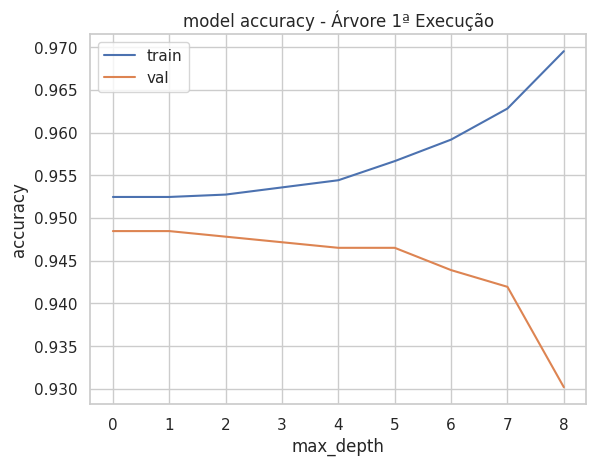

In [ ]:
history_acc_train = []
history_acc_test = []

for max_depth in range(1,10):
  clf = SKTree.DecisionTreeClassifier(criterion='entropy', max_depth=max_depth, random_state=42)
  clf = clf.fit(x_treino, y_treino)
  history_acc_train.append(accuracy_score(y_treino,  clf.predict(x_treino)))
  history_acc_test.append(accuracy_score(y_teste,  clf.predict(x_teste)))

plt.plot(history_acc_train)
plt.plot(history_acc_test)
plt.title('model accuracy - Árvore 1ª Execução')
plt.ylabel('accuracy')
plt.xlabel('max_depth')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

Modelo: Árvore (Iteração 4)
  Accuracy:  0.9478
  Precision: 0.0000
  Recall:    0.0000
  F1 Score:  0.0000
----------------------------------------


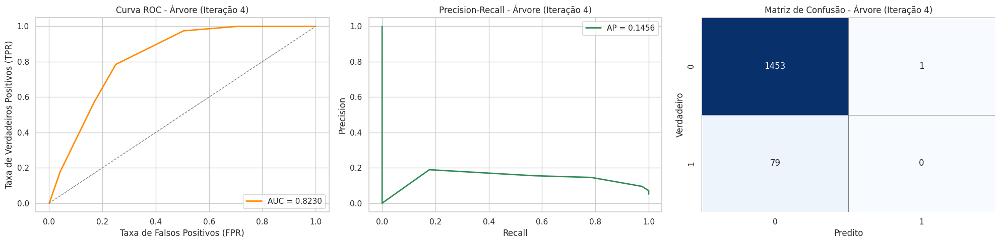

In [ ]:
tree = SKTree.DecisionTreeClassifier(criterion='entropy', max_depth=3, random_state=42)
tree.fit(x_treino, y_treino)
y_pred = tree.predict(x_teste)
y_proba = tree.predict_proba(x_teste)[:, 1]
metricas('Árvore', 4, y_teste, y_pred, y_proba)

[Text(0.4583333333333333, 0.875, 'x[0] <= 0.08\nentropy = 0.276\nsamples = 3576\nvalue = [3406, 170]'),
 Text(0.25, 0.625, 'x[1] <= -0.154\nentropy = 0.055\nsamples = 1752\nvalue = [1741, 11]'),
 Text(0.35416666666666663, 0.75, 'True  '),
 Text(0.16666666666666666, 0.375, 'x[1] <= -0.155\nentropy = 0.112\nsamples = 736\nvalue = [725, 11]'),
 Text(0.08333333333333333, 0.125, 'entropy = 0.104\nsamples = 735\nvalue = [725, 10]'),
 Text(0.25, 0.125, 'entropy = 0.0\nsamples = 1\nvalue = [0, 1]'),
 Text(0.3333333333333333, 0.375, 'entropy = 0.0\nsamples = 1016\nvalue = [1016, 0]'),
 Text(0.6666666666666666, 0.625, 'x[2] <= -0.483\nentropy = 0.427\nsamples = 1824\nvalue = [1665, 159]'),
 Text(0.5625, 0.75, '  False'),
 Text(0.5, 0.375, 'x[0] <= 1.068\nentropy = 0.603\nsamples = 692\nvalue = [590, 102]'),
 Text(0.4166666666666667, 0.125, 'entropy = 0.517\nsamples = 509\nvalue = [450, 59]'),
 Text(0.5833333333333334, 0.125, 'entropy = 0.787\nsamples = 183\nvalue = [140, 43]'),
 Text(0.833333333

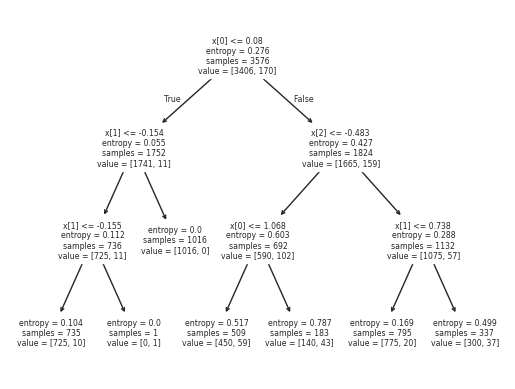

In [ ]:
SKTree.plot_tree(tree)

#### Random Forest ####

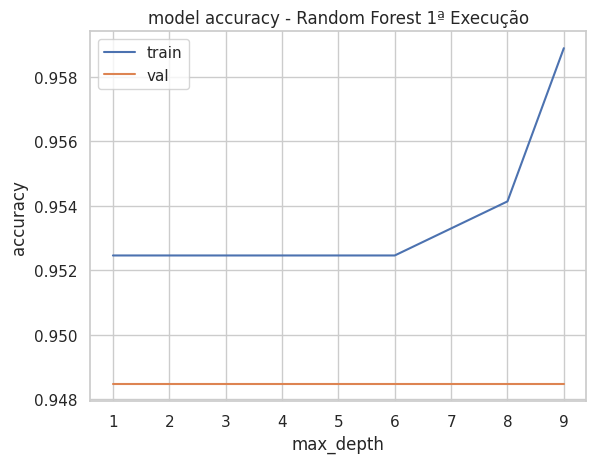

In [ ]:
history_acc_train = []
history_acc_test = []


for max_depth in range(1, 10):
    clf = RandomForestClassifier(
        n_estimators=100,
        criterion='entropy',
        max_depth=max_depth,
        random_state=42,
        n_jobs=-1
    )

    clf.fit(x_treino, y_treino)

    acc_train = accuracy_score(y_treino, clf.predict(x_treino))
    acc_test = accuracy_score(y_teste, clf.predict(x_teste))

    history_acc_train.append(acc_train)
    history_acc_test.append(acc_test)

plt.plot(range(1, 10), history_acc_train)
plt.plot(range(1, 10), history_acc_test)
plt.title('model accuracy - Random Forest 1ª Execução')
plt.ylabel('accuracy')
plt.xlabel('max_depth')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

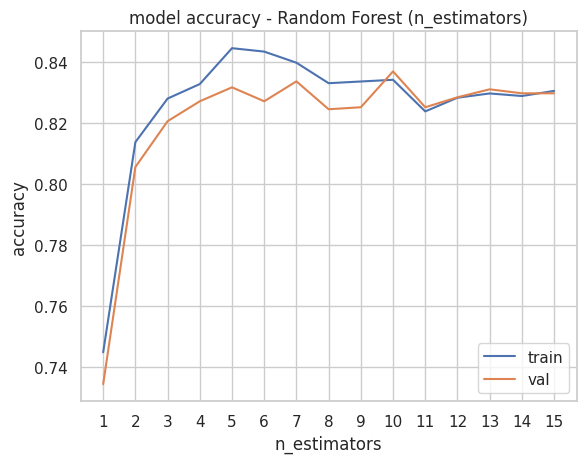

In [ ]:
history_acc_train = []
history_acc_test = []

estimators_range = range(1, 16)

for n_estimators in estimators_range:
    clf = RandomForestClassifier(
        n_estimators=n_estimators,
        criterion='entropy',
        max_depth=6,
        min_samples_split=4,
        min_samples_leaf=3,
        max_features='sqrt',
        class_weight='balanced',
        random_state=42,
        n_jobs=-1
    )

    clf.fit(x_treino, y_treino)

    acc_train = accuracy_score(y_treino, clf.predict(x_treino))
    acc_test = accuracy_score(y_teste, clf.predict(x_teste))

    history_acc_train.append(acc_train)
    history_acc_test.append(acc_test)

plt.plot(estimators_range, history_acc_train)
plt.plot(estimators_range, history_acc_test)
plt.title('model accuracy - Random Forest (n_estimators)')
plt.ylabel('accuracy')
plt.xlabel('n_estimators')
plt.xticks(estimators_range)
plt.legend(['train', 'val'], loc='lower right')
plt.show()

Modelo: Random Forest (Iteração 4)
  Accuracy:  0.8258
  Precision: 0.1569
  Recall:    0.5443
  F1 Score:  0.2436
----------------------------------------


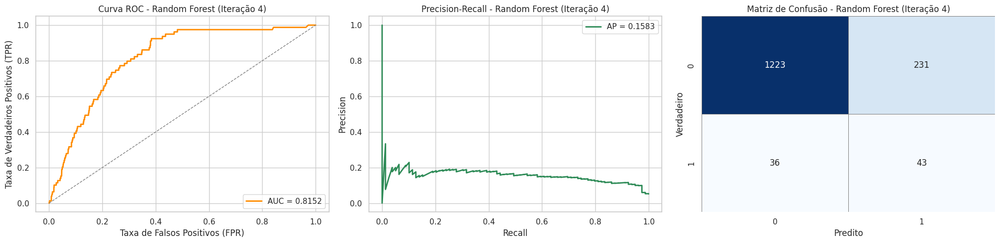

In [ ]:
rfc = RandomForestClassifier(n_estimators=10, max_depth= 6, max_features='sqrt', class_weight='balanced', random_state=42, n_jobs=-1)
rfc.fit(x_treino, y_treino)
y_pred = rfc.predict(x_teste)
y_proba = rfc.predict_proba(x_teste)[:, 1]
metricas('Random Forest', 4, y_teste, y_pred, y_proba)

#### Gradient Booster Classifier ####

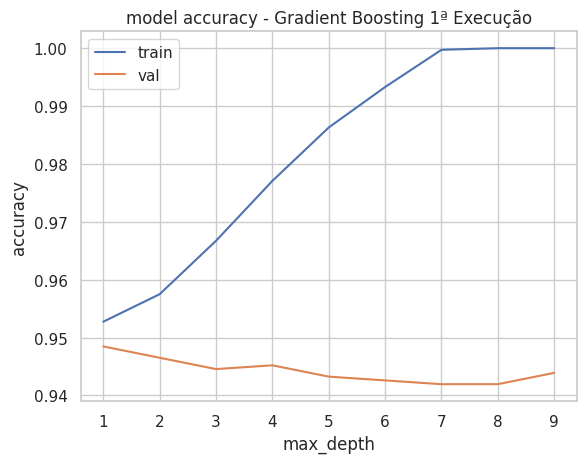

In [ ]:
history_acc_train = []
history_acc_test = []

for max_depth in range(1, 10):
    gbc = GradientBoostingClassifier(
        n_estimators=100,
        learning_rate=0.1,
        max_depth=max_depth,
        random_state=42
    )

    gbc.fit(x_treino, y_treino)

    acc_train = accuracy_score(y_treino, gbc.predict(x_treino))
    acc_test = accuracy_score(y_teste, gbc.predict(x_teste))

    history_acc_train.append(acc_train)
    history_acc_test.append(acc_test)


plt.plot(range(1, 10), history_acc_train)
plt.plot(range(1, 10), history_acc_test)
plt.title('model accuracy - Gradient Boosting 1ª Execução')
plt.ylabel('accuracy')
plt.xlabel('max_depth')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

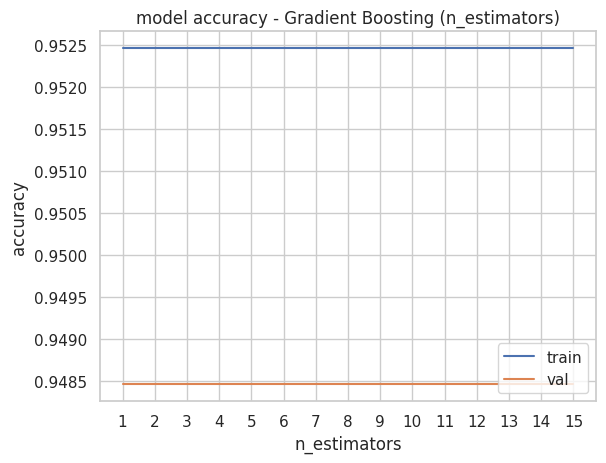

In [ ]:
history_acc_train = []
history_acc_test = []

estimators_range = range(1, 16)

for n_estimators in estimators_range:
    clf = GradientBoostingClassifier(
        n_estimators=n_estimators,
        learning_rate=0.1,
        max_depth=2,
        min_samples_split=4,
        min_samples_leaf=3,
        max_features='sqrt',
        random_state=42
    )

    clf.fit(x_treino, y_treino)

    acc_train = accuracy_score(y_treino, clf.predict(x_treino))
    acc_test = accuracy_score(y_teste, clf.predict(x_teste))

    history_acc_train.append(acc_train)
    history_acc_test.append(acc_test)

plt.plot(estimators_range, history_acc_train)
plt.plot(estimators_range, history_acc_test)
plt.title('model accuracy - Gradient Boosting (n_estimators)')
plt.ylabel('accuracy')
plt.xlabel('n_estimators')
plt.xticks(estimators_range)
plt.legend(['train', 'val'], loc='lower right')
plt.show()

Modelo: Gradient Boosting (Iteração 4)
  Accuracy:  0.9491
  Precision: 1.0000
  Recall:    0.0127
  F1 Score:  0.0250
----------------------------------------


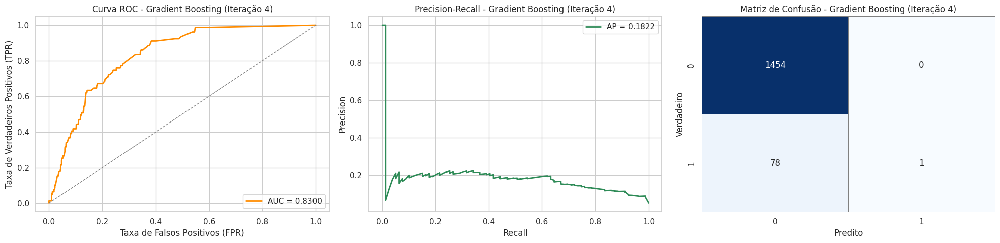

In [ ]:
gbc = GradientBoostingClassifier(n_estimators=10, max_depth=4, learning_rate=0.1, random_state=42)
gbc.fit(x_treino, y_treino)
y_pred = gbc.predict(x_teste)
y_proba = gbc.predict_proba(x_teste)[:, 1]
metricas('Gradient Boosting', 4, y_teste, y_pred, y_proba)

#### Naive bayes ####

Modelo: Naive Bayes - Gaussian (Iteração 4)
  Accuracy:  0.9472
  Precision: 0.4500
  Recall:    0.1139
  F1 Score:  0.1818
----------------------------------------


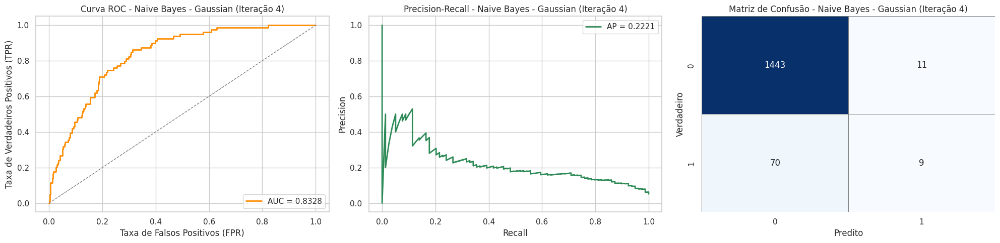

In [ ]:
nbg = SKNB.GaussianNB()

nbg.fit(x_treino, y_treino)
y_pred = nbg.predict(x_teste)
y_proba = nbg.predict_proba(x_teste)[:, 1]
metricas('Naive Bayes - Gaussian', 4, y_teste, y_pred, y_proba)

Modelo: Naive Bayes - Bernoulli (Iteração 4)
  Accuracy:  0.9485
  Precision: 0.0000
  Recall:    0.0000
  F1 Score:  0.0000
----------------------------------------


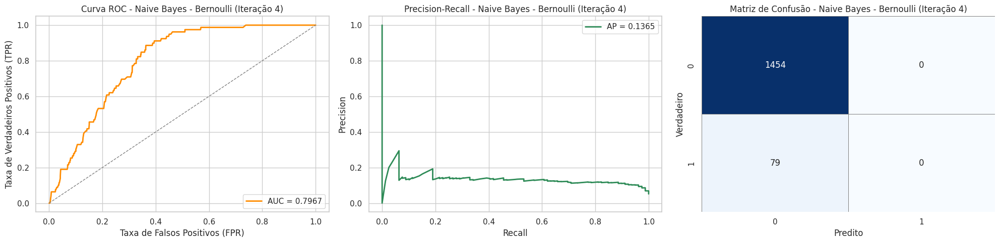

In [ ]:
nbb = SKNB.BernoulliNB()

nbb.fit(x_treino, y_treino)
y_pred = nbb.predict(x_teste)
y_proba = nbb.predict_proba(x_teste)[:, 1]
metricas('Naive Bayes - Bernoulli', 4, y_teste, y_pred, y_proba)

/usr/local/lib/python3.11/dist-packages/sklearn/decomposition/_nmf.py:1742: ConvergenceWarning: Maximum number of iterations 195 reached. Increase it to improve convergence.
  warnings.warn(


Modelo: Naive Bayes - Multinomial (Iteração 4)
  Accuracy:  0.8858
  Precision: 0.1800
  Recall:    0.3418
  F1 Score:  0.2358
----------------------------------------


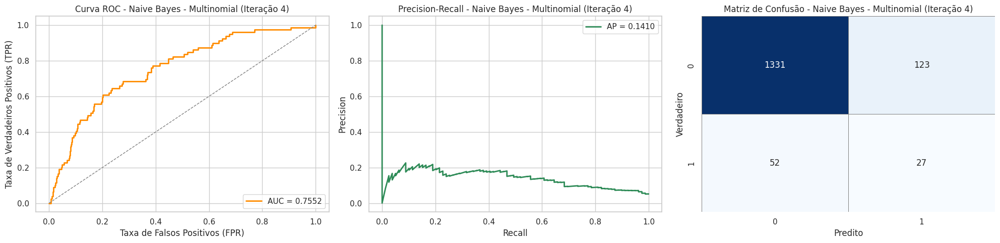

In [ ]:
nvm = SKNB.MultinomialNB()

ds2 = ds_final.copy()

ds2_maioria = ds2[ds2['stroke'] == 0]
ds2_minoria = ds2[ds2['stroke'] == 1]

n_minoria = len(ds2_minoria)
n_total = int(n_minoria / 0.10)
n_maioria = n_total - n_minoria

ds2_maioria = resample(
    ds2_maioria,
    replace=False,
    n_samples=n_maioria,
    random_state=4
)

ds2_downsampled = pd.concat([ds2_maioria, ds2_minoria])
ds2_downsampled = ds2_downsampled.sample(frac=1, random_state=42).reset_index(drop=True)

ds2 = shuffle(ds2, random_state = 42)
sel = ds2.columns.to_list()
sel.remove('stroke')

X1 = ds2[sel]
X1 = nmf.fit_transform(X1)
Y1 = ds2['stroke']

x_treino1, x_teste1, y_treino1, y_teste1 = train_test_split(X1, Y1, test_size=0.3, random_state=42)

nvm.fit(x_treino1, y_treino1)
y_pred = nvm.predict(x_teste1)
y_proba = nvm.predict_proba(x_teste1)[:, 1]
metricas('Naive Bayes - Multinomial', 4, y_teste, y_pred, y_proba)

#### Regressão Logistica ####

In [ ]:
rl = Sequential([
    Input(shape=(x_treino.shape[1],)),
    Dense(1, activation='sigmoid', kernel_regularizer=tf.keras.regularizers.l2(0.001))
])
rl.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy', 'auc', 'precision',  'recall'])
history1 = rl.fit(x_treino, y_treino, epochs=6, batch_size=8, validation_data=(x_teste, y_teste), verbose=0)

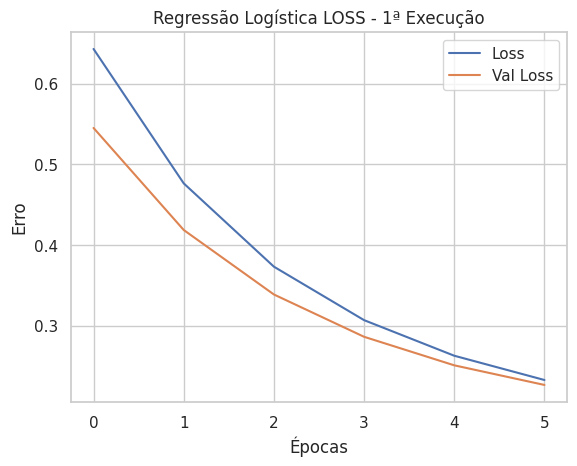

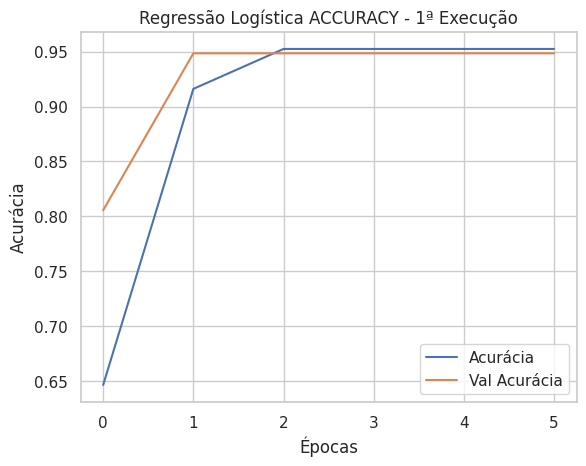

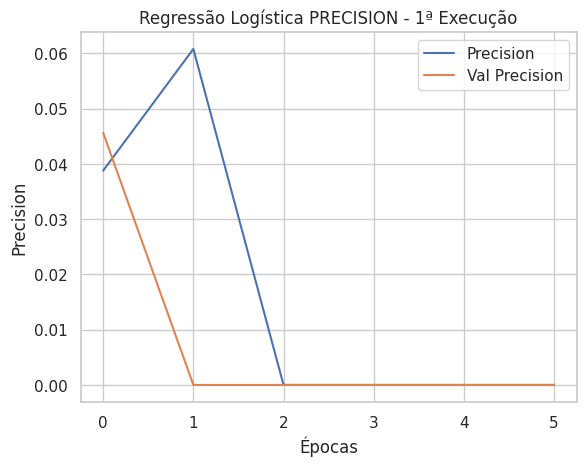

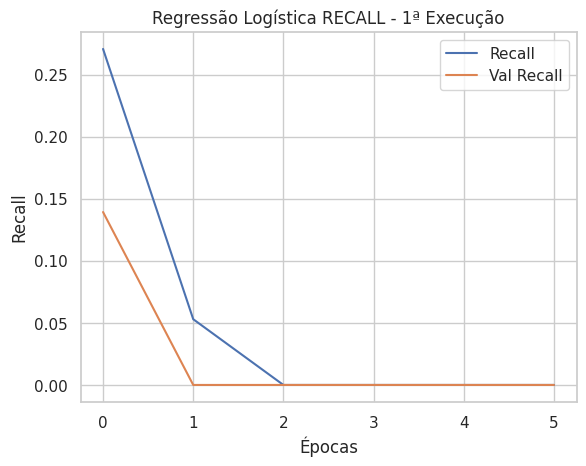

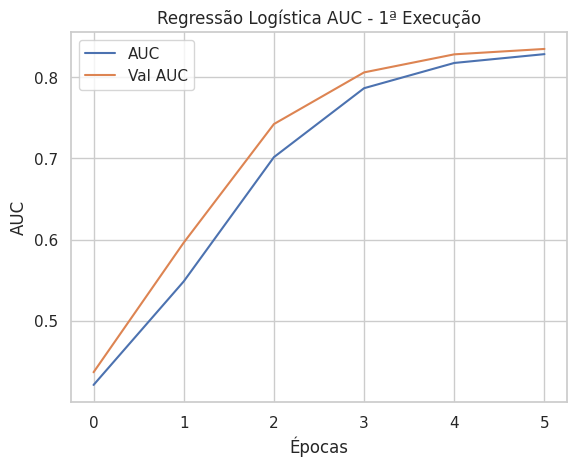

In [ ]:
plot_loss(history1, title='Regressão Logística LOSS - 1ª Execução')
plot_acc(history1, title='Regressão Logística ACCURACY - 1ª Execução')
plot_precision(history1, title='Regressão Logística PRECISION - 1ª Execução')
plot_recall(history1, title='Regressão Logística RECALL - 1ª Execução')
plot_auc(history1, title='Regressão Logística AUC - 1ª Execução')

48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Modelo: Regressão Logística (Iteração 4)
  Accuracy:  0.9485
  Precision: 0.0000
  Recall:    0.0000
  F1 Score:  0.0000
----------------------------------------


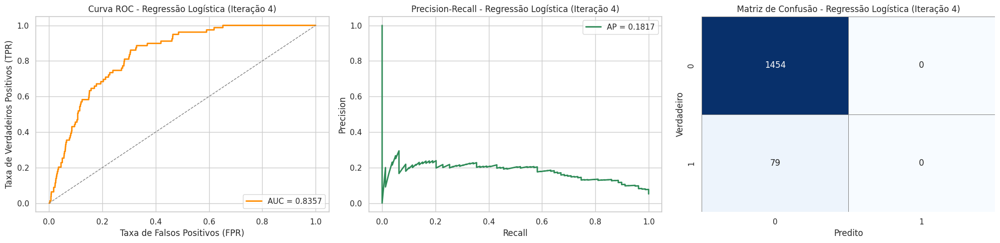

In [ ]:
y_pred = rl.predict(x_teste)
y_pred = np.round(y_pred).flatten()
y_proba = rl.predict(x_teste)
y_proba = y_proba.flatten()

metricas('Regressão Logística', 4, y_teste, y_pred, y_proba)

### Quinta iteração ####

#### Preparação dos dados ####

In [ ]:
ds =  ds_final.copy()

ds_maioria = ds[ds['stroke'] == 0]
ds_minoria = ds[ds['stroke'] == 1]

ds_maioria = resample(
    ds_maioria,
    replace=False,
    n_samples=len(ds_minoria),
    random_state=42
)

ds_downsampled = pd.concat([ds_maioria, ds_minoria])
ds_downsampled = ds_downsampled.sample(frac=1, random_state=42).reset_index(drop=True)

continuas = [col for col in ds.columns if ds[col].nunique() > 2]

scaler = StandardScaler()
ds[continuas] = scaler.fit_transform(ds[continuas])

ds1 = ds[['age', 'heart_disease', 'avg_glucose_level', 'hypertension', 'stroke']]
ds1 = shuffle(ds1, random_state = 42)

sel = ds1.columns.to_list()
sel.remove('stroke')

X = ds1[sel]
Y = ds1['stroke']

x_treino, x_teste, y_treino, y_teste = train_test_split(X, Y, test_size=0.3, random_state=42)

#### KNN ####

Modelo: KNN (Iteração 5)
  Accuracy:  0.9348
  Precision: 0.1111
  Recall:    0.0380
  F1 Score:  0.0566
----------------------------------------


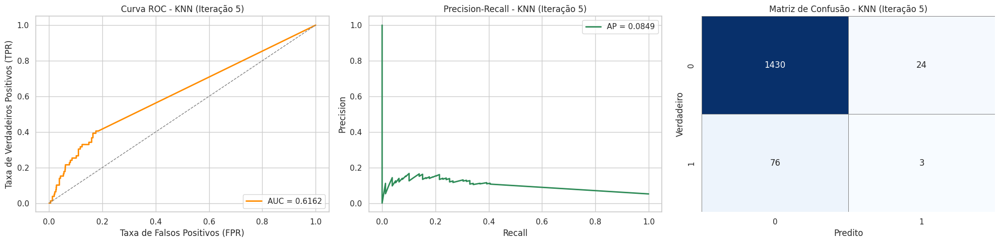

In [ ]:
knn = KNeighborsClassifier(n_neighbors=5, weights='distance', metric= 'euclidean')
knn.fit(x_treino, y_treino)
y_pred = knn.predict(x_teste)
y_proba = knn.predict_proba(x_teste)[:, 1]
metricas('KNN', 5, y_teste, y_pred, y_proba)

#### Árvore ####

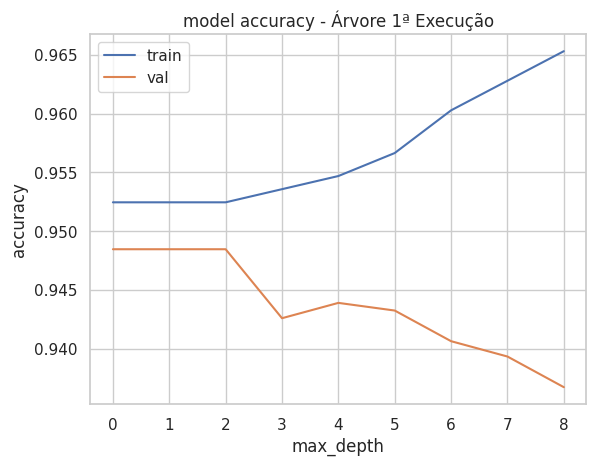

In [ ]:
history_acc_train = []
history_acc_test = []

for max_depth in range(1,10):
  clf = SKTree.DecisionTreeClassifier(criterion='entropy', max_depth=max_depth, random_state=42)
  clf = clf.fit(x_treino, y_treino)
  history_acc_train.append(accuracy_score(y_treino,  clf.predict(x_treino)))
  history_acc_test.append(accuracy_score(y_teste,  clf.predict(x_teste)))

plt.plot(history_acc_train)
plt.plot(history_acc_test)
plt.title('model accuracy - Árvore 1ª Execução')
plt.ylabel('accuracy')
plt.xlabel('max_depth')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

Modelo: Árvore (Iteração 5)
  Accuracy:  0.9485
  Precision: 0.0000
  Recall:    0.0000
  F1 Score:  0.0000
----------------------------------------


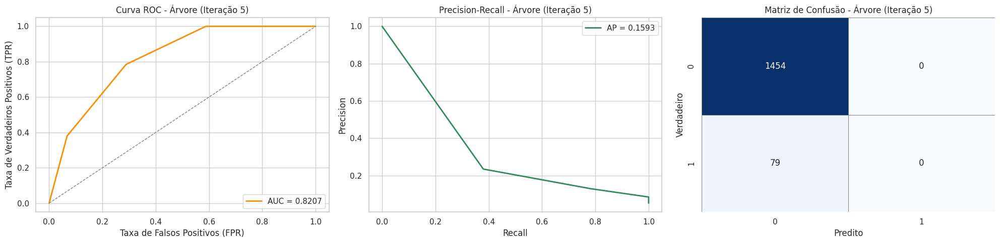

In [ ]:
tree = SKTree.DecisionTreeClassifier(criterion='entropy', max_depth=2, random_state=42)
tree.fit(x_treino, y_treino)
y_pred = tree.predict(x_teste)
y_proba = tree.predict_proba(x_teste)[:, 1]
metricas('Árvore', 5, y_teste, y_pred, y_proba)

[Text(0.5, 0.8333333333333334, 'x[0] <= 0.587\nentropy = 0.276\nsamples = 3576\nvalue = [3406, 170]'),
 Text(0.25, 0.5, 'x[0] <= -0.253\nentropy = 0.082\nsamples = 2439\nvalue = [2414, 25]'),
 Text(0.375, 0.6666666666666667, 'True  '),
 Text(0.125, 0.16666666666666666, 'entropy = 0.022\nsamples = 1427\nvalue = [1424.0, 3.0]'),
 Text(0.375, 0.16666666666666666, 'entropy = 0.151\nsamples = 1012\nvalue = [990, 22]'),
 Text(0.75, 0.5, 'x[0] <= 1.427\nentropy = 0.551\nsamples = 1137\nvalue = [992, 145]'),
 Text(0.625, 0.6666666666666667, '  False'),
 Text(0.625, 0.16666666666666666, 'entropy = 0.465\nsamples = 800\nvalue = [721, 79]'),
 Text(0.875, 0.16666666666666666, 'entropy = 0.714\nsamples = 337\nvalue = [271, 66]')]

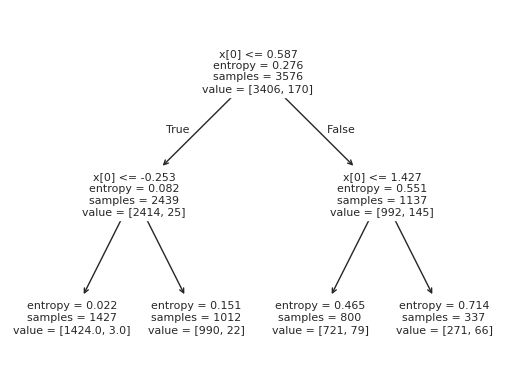

In [ ]:
SKTree.plot_tree(tree)

#### Random Forest ####

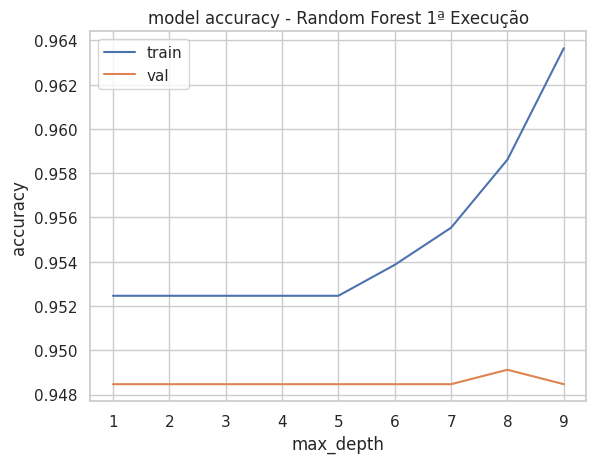

In [ ]:
history_acc_train = []
history_acc_test = []


for max_depth in range(1, 10):
    clf = RandomForestClassifier(
        n_estimators=100,
        criterion='entropy',
        max_depth=max_depth,
        random_state=42,
        n_jobs=-1
    )

    clf.fit(x_treino, y_treino)

    acc_train = accuracy_score(y_treino, clf.predict(x_treino))
    acc_test = accuracy_score(y_teste, clf.predict(x_teste))

    history_acc_train.append(acc_train)
    history_acc_test.append(acc_test)

plt.plot(range(1, 10), history_acc_train)
plt.plot(range(1, 10), history_acc_test)
plt.title('model accuracy - Random Forest 1ª Execução')
plt.ylabel('accuracy')
plt.xlabel('max_depth')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

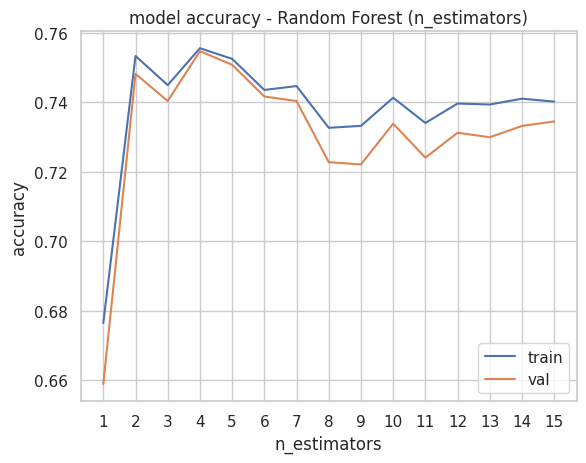

In [ ]:
history_acc_train = []
history_acc_test = []

estimators_range = range(1, 16)

for n_estimators in estimators_range:
    clf = RandomForestClassifier(
        n_estimators=n_estimators,
        criterion='entropy',
        max_depth=5,
        min_samples_split=4,
        min_samples_leaf=3,
        max_features='sqrt',
        class_weight='balanced',
        random_state=42,
        n_jobs=-1
    )

    clf.fit(x_treino, y_treino)

    acc_train = accuracy_score(y_treino, clf.predict(x_treino))
    acc_test = accuracy_score(y_teste, clf.predict(x_teste))

    history_acc_train.append(acc_train)
    history_acc_test.append(acc_test)

plt.plot(estimators_range, history_acc_train)
plt.plot(estimators_range, history_acc_test)
plt.title('model accuracy - Random Forest (n_estimators)')
plt.ylabel('accuracy')
plt.xlabel('n_estimators')
plt.xticks(estimators_range)
plt.legend(['train', 'val'], loc='lower right')
plt.show()

Modelo: Random Forest (Iteração 5)
  Accuracy:  0.7423
  Precision: 0.1291
  Recall:    0.6962
  F1 Score:  0.2178
----------------------------------------


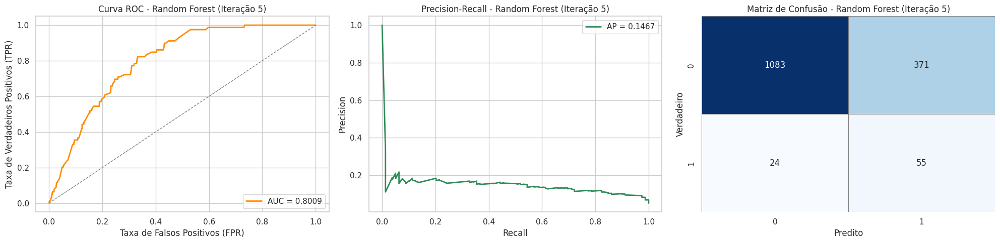

In [ ]:
rfc = RandomForestClassifier(n_estimators=4, max_depth= 5, max_features='sqrt', class_weight='balanced', random_state=42, n_jobs=-1)
rfc.fit(x_treino, y_treino)
y_pred = rfc.predict(x_teste)
y_proba = rfc.predict_proba(x_teste)[:, 1]
metricas('Random Forest', 5, y_teste, y_pred, y_proba)

#### Gradient Booster Classifier ####

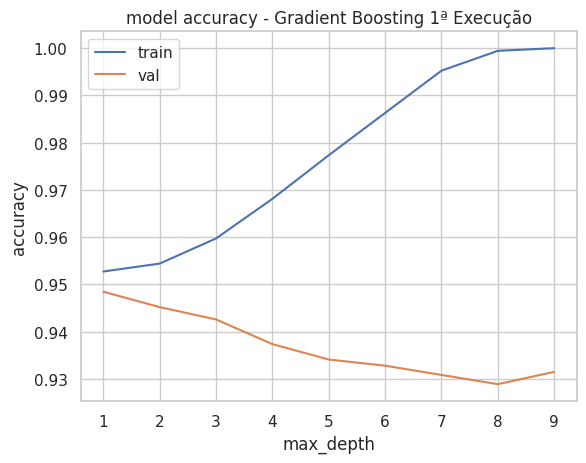

In [ ]:
history_acc_train = []
history_acc_test = []

for max_depth in range(1, 10):
    gbc = GradientBoostingClassifier(
        n_estimators=100,
        learning_rate=0.1,
        max_depth=max_depth,
        random_state=42
    )

    gbc.fit(x_treino, y_treino)

    acc_train = accuracy_score(y_treino, gbc.predict(x_treino))
    acc_test = accuracy_score(y_teste, gbc.predict(x_teste))

    history_acc_train.append(acc_train)
    history_acc_test.append(acc_test)


plt.plot(range(1, 10), history_acc_train)
plt.plot(range(1, 10), history_acc_test)
plt.title('model accuracy - Gradient Boosting 1ª Execução')
plt.ylabel('accuracy')
plt.xlabel('max_depth')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

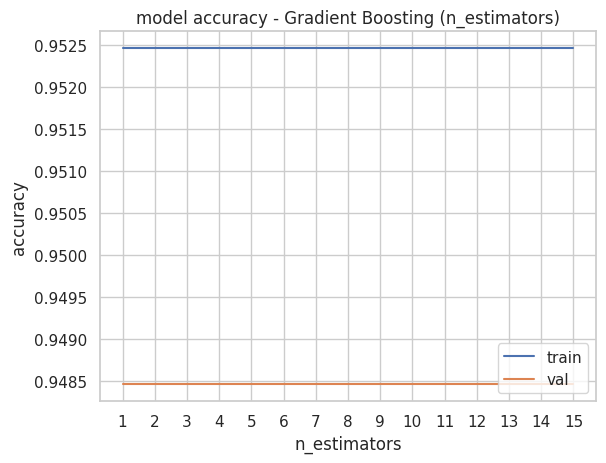

In [ ]:
history_acc_train = []
history_acc_test = []

estimators_range = range(1, 16)

for n_estimators in estimators_range:
    clf = GradientBoostingClassifier(
        n_estimators=n_estimators,
        learning_rate=0.1,
        max_depth=2,
        min_samples_split=4,
        min_samples_leaf=3,
        max_features='sqrt',
        random_state=42
    )

    clf.fit(x_treino, y_treino)

    acc_train = accuracy_score(y_treino, clf.predict(x_treino))
    acc_test = accuracy_score(y_teste, clf.predict(x_teste))

    history_acc_train.append(acc_train)
    history_acc_test.append(acc_test)

plt.plot(estimators_range, history_acc_train)
plt.plot(estimators_range, history_acc_test)
plt.title('model accuracy - Gradient Boosting (n_estimators)')
plt.ylabel('accuracy')
plt.xlabel('n_estimators')
plt.xticks(estimators_range)
plt.legend(['train', 'val'], loc='lower right')
plt.show()

Modelo: Gradient Boosting (Iteração 5)
  Accuracy:  0.9465
  Precision: 0.0000
  Recall:    0.0000
  F1 Score:  0.0000
----------------------------------------


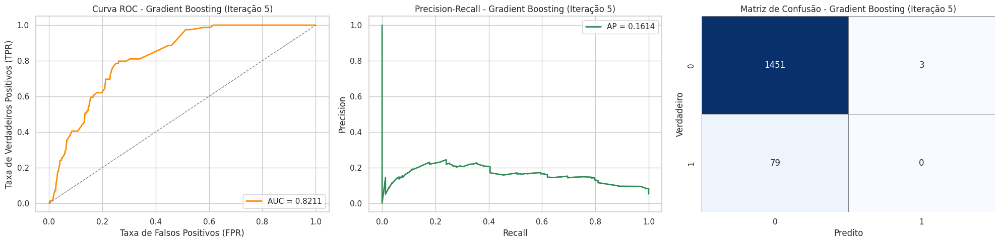

In [ ]:
gbc = GradientBoostingClassifier(n_estimators=10, max_depth=4, learning_rate=0.1, random_state=42)
gbc.fit(x_treino, y_treino)
y_pred = gbc.predict(x_teste)
y_proba = gbc.predict_proba(x_teste)[:, 1]
metricas('Gradient Boosting', 5, y_teste, y_pred, y_proba)

#### Naive bayes ####

Modelo: Naive Bayes - Gaussian (Iteração 5)
  Accuracy:  0.8813
  Precision: 0.1761
  Recall:    0.3544
  F1 Score:  0.2353
----------------------------------------


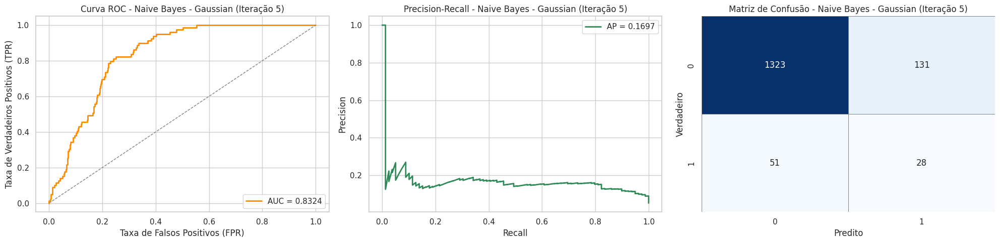

In [ ]:
nbg = SKNB.GaussianNB()

nbg.fit(x_treino, y_treino)
y_pred = nbg.predict(x_teste)
y_proba = nbg.predict_proba(x_teste)[:, 1]
metricas('Naive Bayes - Gaussian', 5, y_teste, y_pred, y_proba)

Modelo: Naive Bayes - Bernoulli (Iteração 5)
  Accuracy:  0.9439
  Precision: 0.1818
  Recall:    0.0253
  F1 Score:  0.0444
----------------------------------------


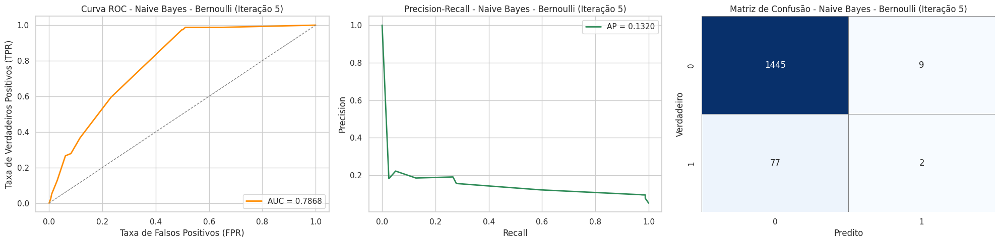

In [ ]:
nbb = SKNB.BernoulliNB()

nbb.fit(x_treino, y_treino)
y_pred = nbb.predict(x_teste)
y_proba = nbb.predict_proba(x_teste)[:, 1]
metricas('Naive Bayes - Bernoulli', 5, y_teste, y_pred, y_proba)

Modelo: Naive Bayes - Multinomial (Iteração 5)
  Accuracy:  0.7769
  Precision: 0.1166
  Recall:    0.5063
  F1 Score:  0.1896
----------------------------------------


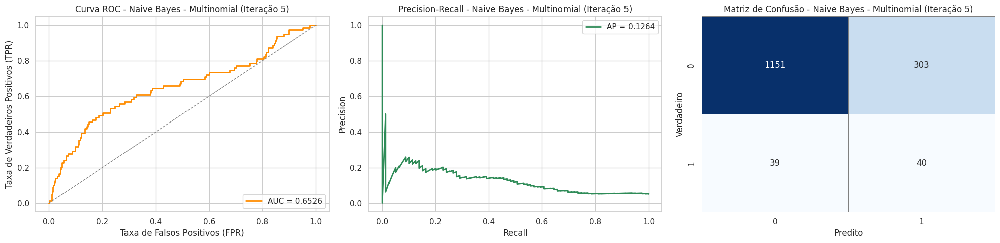

In [ ]:
nvm = SKNB.MultinomialNB()

ds2 = ds_final[['age', 'heart_disease', 'avg_glucose_level', 'hypertension', 'stroke']]

ds2_maioria = ds2[ds2['stroke'] == 0]
ds2_minoria = ds2[ds2['stroke'] == 1]

ds2_maioria = resample(
    ds2_maioria,
    replace=False,
    n_samples=len(ds2_minoria),
    random_state=4
)

ds2_downsampled = pd.concat([ds2_maioria, ds2_minoria])
ds2_downsampled = ds2_downsampled.sample(frac=1, random_state=42).reset_index(drop=True)

ds2 = shuffle(ds2, random_state = 42)
sel = ds2.columns.to_list()
sel.remove('stroke')

X1 = ds2[sel]
Y1 = ds2['stroke']

x_treino1, x_teste1, y_treino1, y_teste1 = train_test_split(X1, Y1, test_size=0.3, random_state=42)

nvm.fit(x_treino1, y_treino1)
y_pred = nvm.predict(x_teste1)
y_proba = nvm.predict_proba(x_teste1)[:, 1]
metricas('Naive Bayes - Multinomial', 5, y_teste, y_pred, y_proba)

#### Regressão Logistica ####

In [ ]:
rl = Sequential([
    Input(shape=(x_treino.shape[1],)),
    Dense(1, activation='sigmoid', kernel_regularizer=tf.keras.regularizers.l2(0.001))
])
rl.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy', 'auc', 'precision',  'recall'])
history1 = rl.fit(x_treino, y_treino, epochs=8, batch_size=8, validation_data=(x_teste, y_teste), verbose=0)

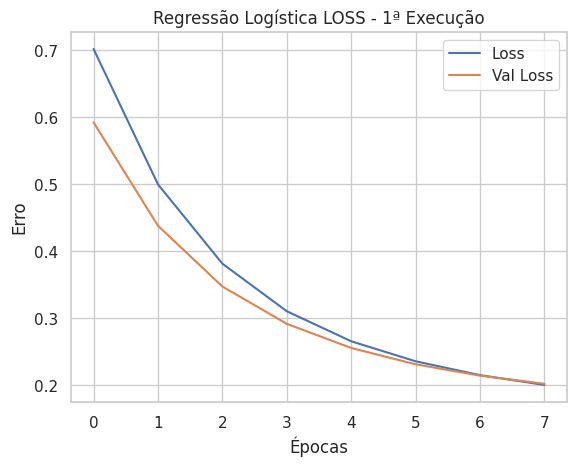

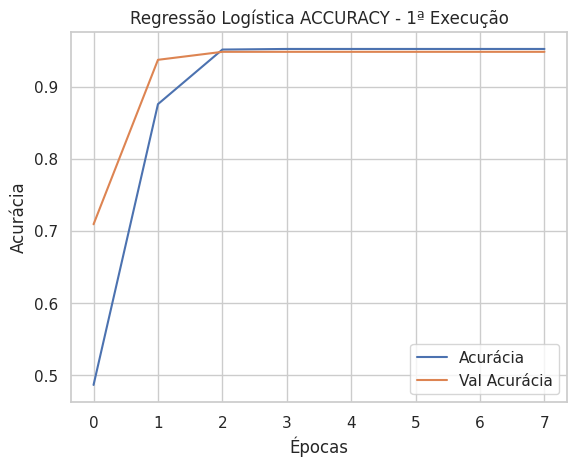

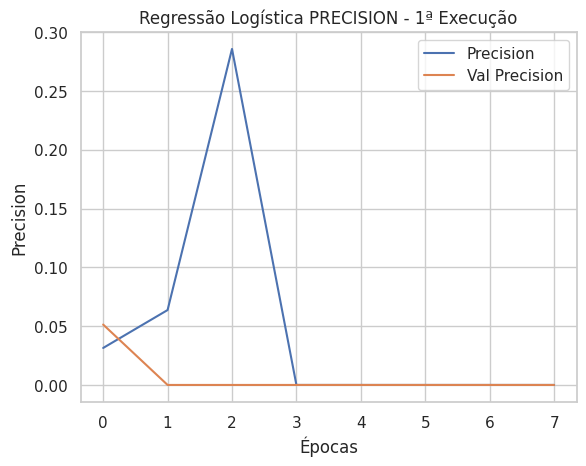

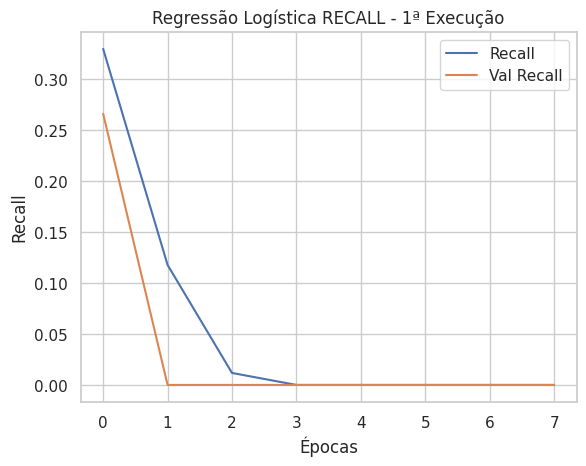

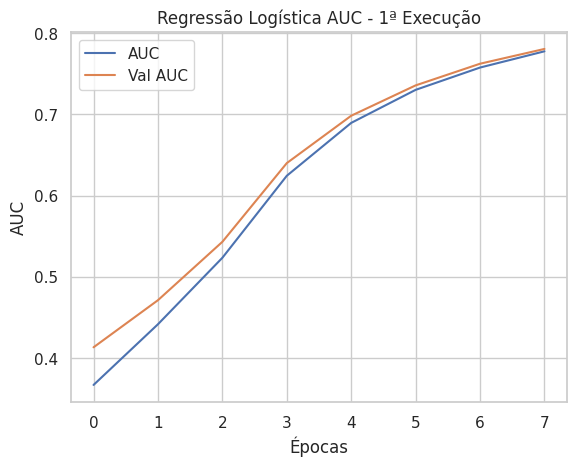

In [ ]:
plot_loss(history1, title='Regressão Logística LOSS - 1ª Execução')
plot_acc(history1, title='Regressão Logística ACCURACY - 1ª Execução')
plot_precision(history1, title='Regressão Logística PRECISION - 1ª Execução')
plot_recall(history1, title='Regressão Logística RECALL - 1ª Execução')
plot_auc(history1, title='Regressão Logística AUC - 1ª Execução')

48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Modelo: Regressão Logística (Iteração 5)
  Accuracy:  0.9485
  Precision: 0.0000
  Recall:    0.0000
  F1 Score:  0.0000
----------------------------------------


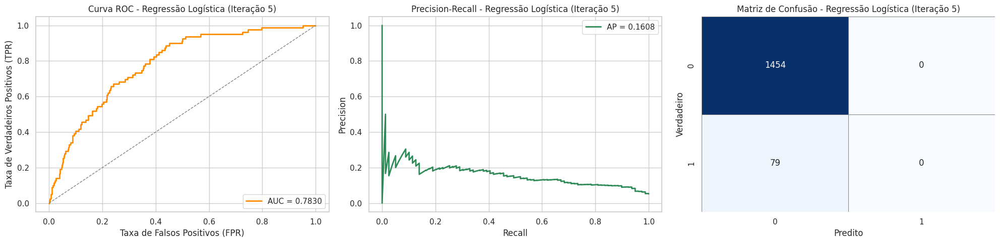

In [ ]:
y_pred = rl.predict(x_teste)
y_pred = np.round(y_pred).flatten()
y_proba = rl.predict(x_teste)
y_proba = y_proba.flatten()

metricas('Regressão Logística', 5, y_teste, y_pred, y_proba)

### Sexta iteração ####

#### Preparação dos dados ####

In [ ]:
ds =  ds_final.copy()

ds_maioria = ds[ds['stroke'] == 0]
ds_minoria = ds[ds['stroke'] == 1]

ds_maioria = resample(
    ds_maioria,
    replace=False,
    n_samples=len(ds_minoria),
    random_state=42
)

ds_downsampled = pd.concat([ds_maioria, ds_minoria])
ds_downsampled = ds_downsampled.sample(frac=1, random_state=42).reset_index(drop=True)

continuas = [col for col in ds.columns if ds[col].nunique() > 2]

scaler = StandardScaler()
ds[continuas] = scaler.fit_transform(ds[continuas])

ds = shuffle(ds, random_state = 42)

sel = ds.columns.to_list()
sel.remove('stroke')

X = ds[sel]
X = pca.fit_transform(X)
Y = ds['stroke']

x_treino, x_teste, y_treino, y_teste = train_test_split(X, Y, test_size=0.3, random_state=42)

#### KNN ####

Modelo: KNN (Iteração 6)
  Accuracy:  0.9426
  Precision: 0.0909
  Recall:    0.0127
  F1 Score:  0.0222
----------------------------------------


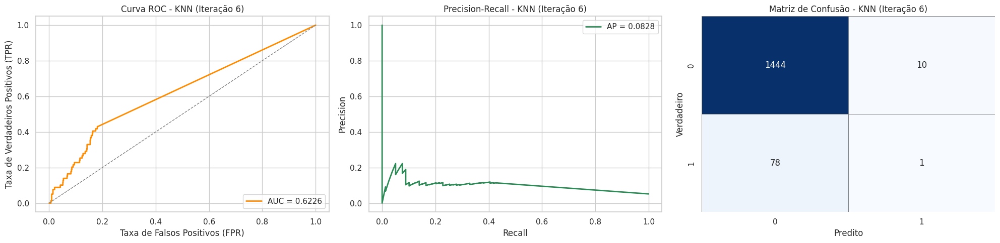

In [ ]:
knn = KNeighborsClassifier(n_neighbors=5, weights='distance', metric= 'euclidean')
knn.fit(x_treino, y_treino)
y_pred = knn.predict(x_teste)
y_proba = knn.predict_proba(x_teste)[:, 1]
metricas('KNN', 6, y_teste, y_pred, y_proba)

#### Árvore ####

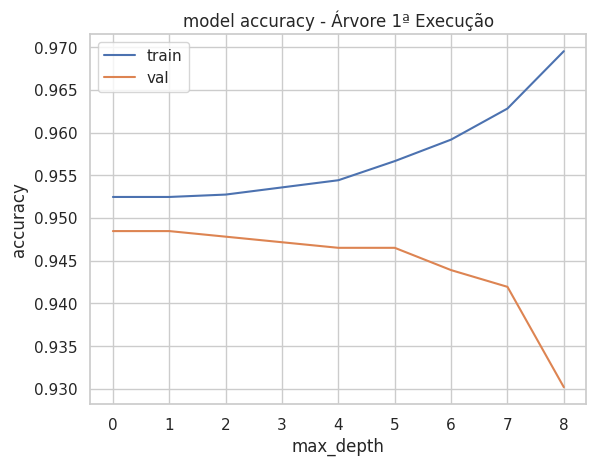

In [ ]:
history_acc_train = []
history_acc_test = []

for max_depth in range(1,10):
  clf = SKTree.DecisionTreeClassifier(criterion='entropy', max_depth=max_depth, random_state=42)
  clf = clf.fit(x_treino, y_treino)
  history_acc_train.append(accuracy_score(y_treino,  clf.predict(x_treino)))
  history_acc_test.append(accuracy_score(y_teste,  clf.predict(x_teste)))

plt.plot(history_acc_train)
plt.plot(history_acc_test)
plt.title('model accuracy - Árvore 1ª Execução')
plt.ylabel('accuracy')
plt.xlabel('max_depth')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

Modelo: Árvore (Iteração 6)
  Accuracy:  0.9478
  Precision: 0.0000
  Recall:    0.0000
  F1 Score:  0.0000
----------------------------------------


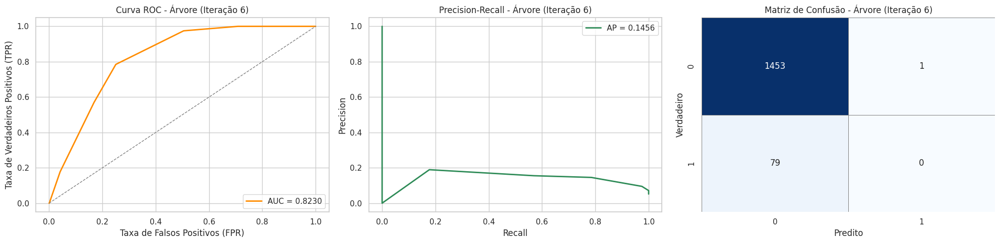

In [ ]:
tree = SKTree.DecisionTreeClassifier(criterion='entropy', max_depth=3, random_state=42)
tree.fit(x_treino, y_treino)
y_pred = tree.predict(x_teste)
y_proba = tree.predict_proba(x_teste)[:, 1]
metricas('Árvore', 6, y_teste, y_pred, y_proba)

[Text(0.4583333333333333, 0.875, 'x[0] <= 0.08\nentropy = 0.276\nsamples = 3576\nvalue = [3406, 170]'),
 Text(0.25, 0.625, 'x[1] <= -0.154\nentropy = 0.055\nsamples = 1752\nvalue = [1741, 11]'),
 Text(0.35416666666666663, 0.75, 'True  '),
 Text(0.16666666666666666, 0.375, 'x[1] <= -0.155\nentropy = 0.112\nsamples = 736\nvalue = [725, 11]'),
 Text(0.08333333333333333, 0.125, 'entropy = 0.104\nsamples = 735\nvalue = [725, 10]'),
 Text(0.25, 0.125, 'entropy = 0.0\nsamples = 1\nvalue = [0, 1]'),
 Text(0.3333333333333333, 0.375, 'entropy = 0.0\nsamples = 1016\nvalue = [1016, 0]'),
 Text(0.6666666666666666, 0.625, 'x[2] <= -0.483\nentropy = 0.427\nsamples = 1824\nvalue = [1665, 159]'),
 Text(0.5625, 0.75, '  False'),
 Text(0.5, 0.375, 'x[0] <= 1.068\nentropy = 0.603\nsamples = 692\nvalue = [590, 102]'),
 Text(0.4166666666666667, 0.125, 'entropy = 0.517\nsamples = 509\nvalue = [450, 59]'),
 Text(0.5833333333333334, 0.125, 'entropy = 0.787\nsamples = 183\nvalue = [140, 43]'),
 Text(0.833333333

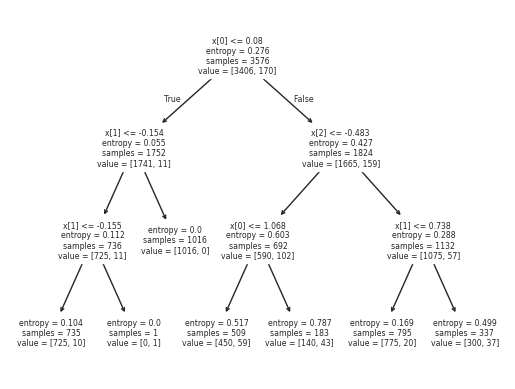

In [ ]:
SKTree.plot_tree(tree)

#### Random Forest ####

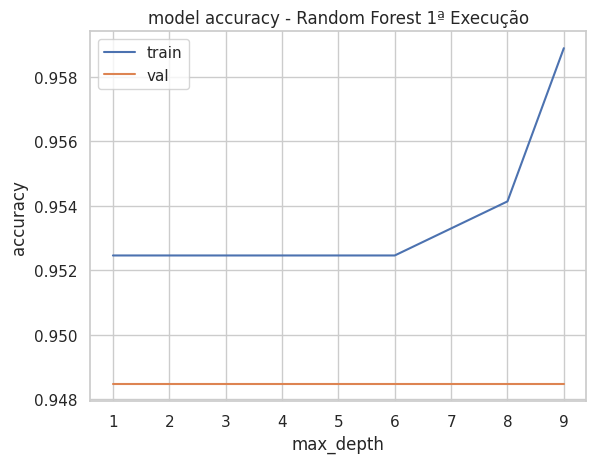

In [ ]:
history_acc_train = []
history_acc_test = []


for max_depth in range(1, 10):
    clf = RandomForestClassifier(
        n_estimators=100,
        criterion='entropy',
        max_depth=max_depth,
        random_state=42,
        n_jobs=-1
    )

    clf.fit(x_treino, y_treino)

    acc_train = accuracy_score(y_treino, clf.predict(x_treino))
    acc_test = accuracy_score(y_teste, clf.predict(x_teste))

    history_acc_train.append(acc_train)
    history_acc_test.append(acc_test)

plt.plot(range(1, 10), history_acc_train)
plt.plot(range(1, 10), history_acc_test)
plt.title('model accuracy - Random Forest 1ª Execução')
plt.ylabel('accuracy')
plt.xlabel('max_depth')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

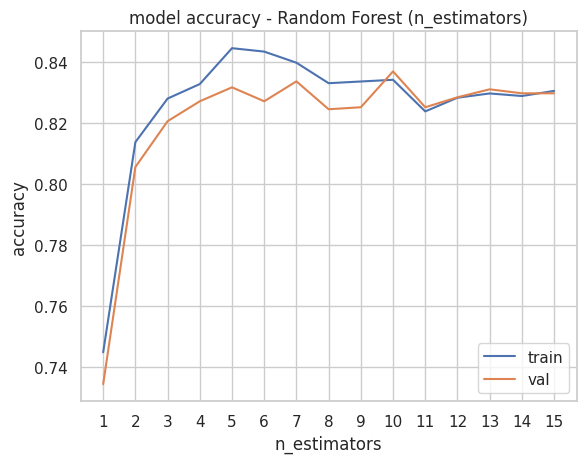

In [ ]:
history_acc_train = []
history_acc_test = []

estimators_range = range(1, 16)

for n_estimators in estimators_range:
    clf = RandomForestClassifier(
        n_estimators=n_estimators,
        criterion='entropy',
        max_depth=6,
        min_samples_split=4,
        min_samples_leaf=3,
        max_features='sqrt',
        class_weight='balanced',
        random_state=42,
        n_jobs=-1
    )

    clf.fit(x_treino, y_treino)

    acc_train = accuracy_score(y_treino, clf.predict(x_treino))
    acc_test = accuracy_score(y_teste, clf.predict(x_teste))

    history_acc_train.append(acc_train)
    history_acc_test.append(acc_test)

plt.plot(estimators_range, history_acc_train)
plt.plot(estimators_range, history_acc_test)
plt.title('model accuracy - Random Forest (n_estimators)')
plt.ylabel('accuracy')
plt.xlabel('n_estimators')
plt.xticks(estimators_range)
plt.legend(['train', 'val'], loc='lower right')
plt.show()

Modelo: Random Forest (Iteração 6)
  Accuracy:  0.8258
  Precision: 0.1569
  Recall:    0.5443
  F1 Score:  0.2436
----------------------------------------


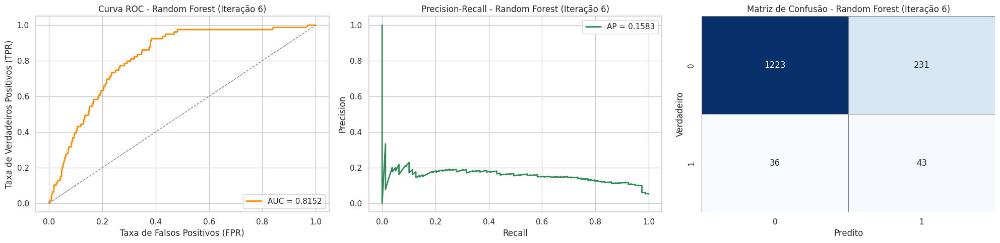

In [ ]:
rfc = RandomForestClassifier(n_estimators=10, max_depth= 6, max_features='sqrt', class_weight='balanced', random_state=42, n_jobs=-1)
rfc.fit(x_treino, y_treino)
y_pred = rfc.predict(x_teste)
y_proba = rfc.predict_proba(x_teste)[:, 1]
metricas('Random Forest', 6, y_teste, y_pred, y_proba)

#### Gradient Booster Classifier ####

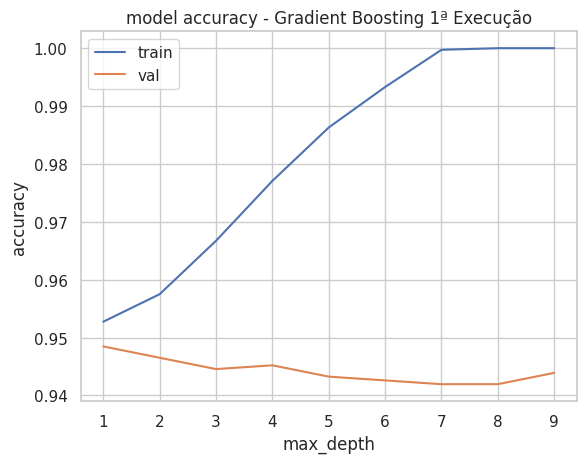

In [ ]:
history_acc_train = []
history_acc_test = []

for max_depth in range(1, 10):
    gbc = GradientBoostingClassifier(
        n_estimators=100,
        learning_rate=0.1,
        max_depth=max_depth,
        random_state=42
    )

    gbc.fit(x_treino, y_treino)

    acc_train = accuracy_score(y_treino, gbc.predict(x_treino))
    acc_test = accuracy_score(y_teste, gbc.predict(x_teste))

    history_acc_train.append(acc_train)
    history_acc_test.append(acc_test)


plt.plot(range(1, 10), history_acc_train)
plt.plot(range(1, 10), history_acc_test)
plt.title('model accuracy - Gradient Boosting 1ª Execução')
plt.ylabel('accuracy')
plt.xlabel('max_depth')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

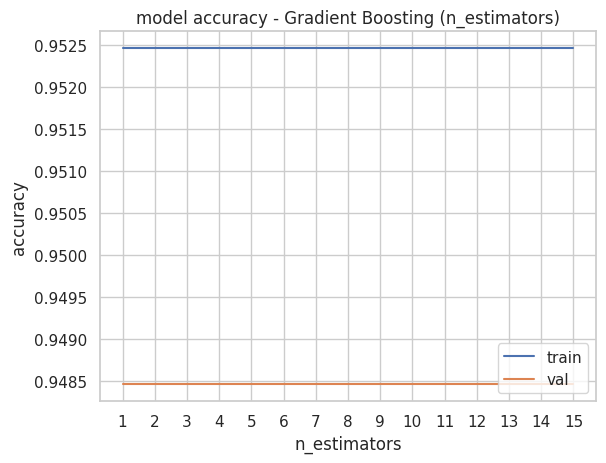

In [ ]:
history_acc_train = []
history_acc_test = []

estimators_range = range(1, 16)

for n_estimators in estimators_range:
    clf = GradientBoostingClassifier(
        n_estimators=n_estimators,
        learning_rate=0.1,
        max_depth=2,
        min_samples_split=4,
        min_samples_leaf=3,
        max_features='sqrt',
        random_state=42
    )

    clf.fit(x_treino, y_treino)

    acc_train = accuracy_score(y_treino, clf.predict(x_treino))
    acc_test = accuracy_score(y_teste, clf.predict(x_teste))

    history_acc_train.append(acc_train)
    history_acc_test.append(acc_test)

plt.plot(estimators_range, history_acc_train)
plt.plot(estimators_range, history_acc_test)
plt.title('model accuracy - Gradient Boosting (n_estimators)')
plt.ylabel('accuracy')
plt.xlabel('n_estimators')
plt.xticks(estimators_range)
plt.legend(['train', 'val'], loc='lower right')
plt.show()

Modelo: Gradient Boosting (Iteração 6)
  Accuracy:  0.9491
  Precision: 1.0000
  Recall:    0.0127
  F1 Score:  0.0250
----------------------------------------


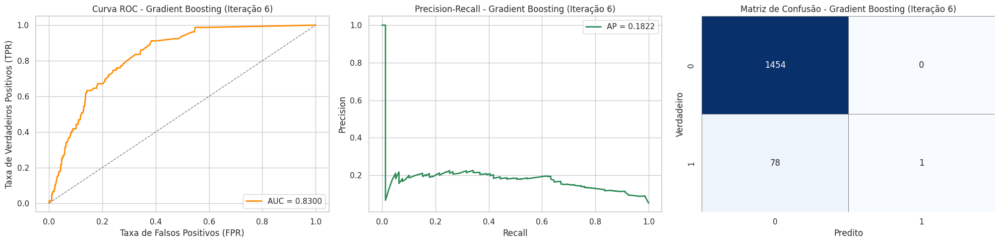

In [ ]:
gbc = GradientBoostingClassifier(n_estimators=10, max_depth=4, learning_rate=0.1, random_state=42)
gbc.fit(x_treino, y_treino)
y_pred = gbc.predict(x_teste)
y_proba = gbc.predict_proba(x_teste)[:, 1]
metricas('Gradient Boosting', 6, y_teste, y_pred, y_proba)

#### Naive bayes ####

Modelo: Naive Bayes - Gaussian (Iteração 6)
  Accuracy:  0.9472
  Precision: 0.4500
  Recall:    0.1139
  F1 Score:  0.1818
----------------------------------------


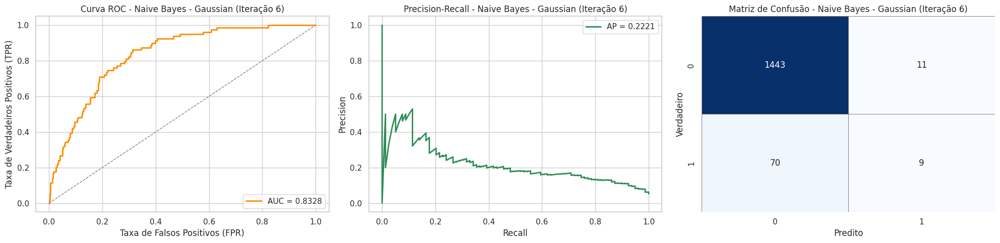

In [ ]:
nbg = SKNB.GaussianNB()

nbg.fit(x_treino, y_treino)
y_pred = nbg.predict(x_teste)
y_proba = nbg.predict_proba(x_teste)[:, 1]
metricas('Naive Bayes - Gaussian', 6, y_teste, y_pred, y_proba)

Modelo: Naive Bayes - Bernoulli (Iteração 6)
  Accuracy:  0.9485
  Precision: 0.0000
  Recall:    0.0000
  F1 Score:  0.0000
----------------------------------------


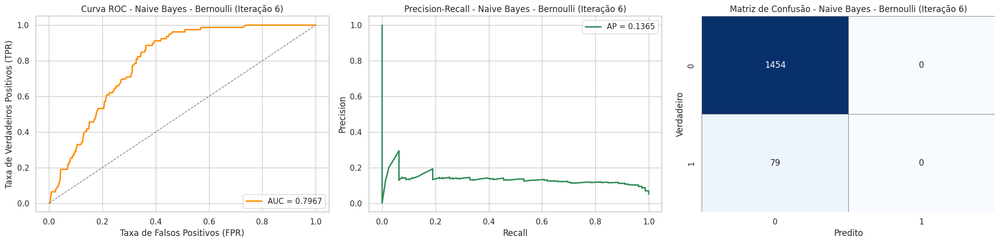

In [ ]:
nbb = SKNB.BernoulliNB()

nbb.fit(x_treino, y_treino)
y_pred = nbb.predict(x_teste)
y_proba = nbb.predict_proba(x_teste)[:, 1]
metricas('Naive Bayes - Bernoulli', 6, y_teste, y_pred, y_proba)

/usr/local/lib/python3.11/dist-packages/sklearn/decomposition/_nmf.py:1742: ConvergenceWarning: Maximum number of iterations 195 reached. Increase it to improve convergence.
  warnings.warn(


Modelo: Naive Bayes - Multinomial (Iteração 6)
  Accuracy:  0.8858
  Precision: 0.1800
  Recall:    0.3418
  F1 Score:  0.2358
----------------------------------------


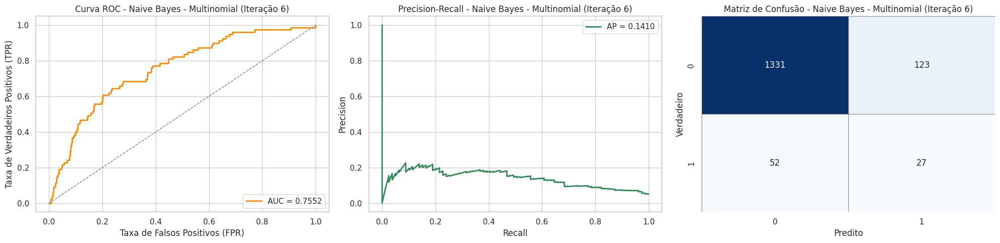

In [ ]:
nvm = SKNB.MultinomialNB()

ds2 = ds_final.copy()

ds2_maioria = ds2[ds2['stroke'] == 0]
ds2_minoria = ds2[ds2['stroke'] == 1]

ds2_maioria = resample(
    ds2_maioria,
    replace=False,
    n_samples=len(ds2_minoria),
    random_state=4
)

ds2_downsampled = pd.concat([ds2_maioria, ds2_minoria])
ds2_downsampled = ds2_downsampled.sample(frac=1, random_state=42).reset_index(drop=True)

ds2 = shuffle(ds2, random_state = 42)
sel = ds2.columns.to_list()
sel.remove('stroke')

X1 = ds2[sel]
X1 = nmf.fit_transform(X1)
Y1 = ds2['stroke']

x_treino1, x_teste1, y_treino1, y_teste1 = train_test_split(X1, Y1, test_size=0.3, random_state=42)

nvm.fit(x_treino1, y_treino1)
y_pred = nvm.predict(x_teste1)
y_proba = nvm.predict_proba(x_teste1)[:, 1]
metricas('Naive Bayes - Multinomial', 6, y_teste, y_pred, y_proba)

#### Regressão Logistica ####

In [ ]:
rl = Sequential([
    Input(shape=(x_treino.shape[1],)),
    Dense(1, activation='sigmoid', kernel_regularizer=tf.keras.regularizers.l2(0.001))
])
rl.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy', 'auc', 'precision',  'recall'])
history1 = rl.fit(x_treino, y_treino, epochs=7, batch_size=8, validation_data=(x_teste, y_teste), verbose=0)

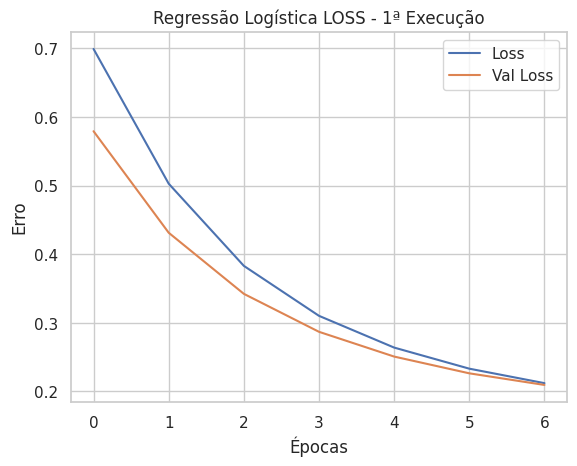

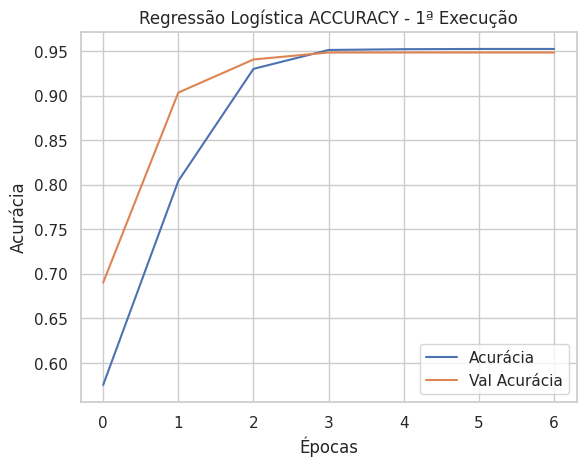

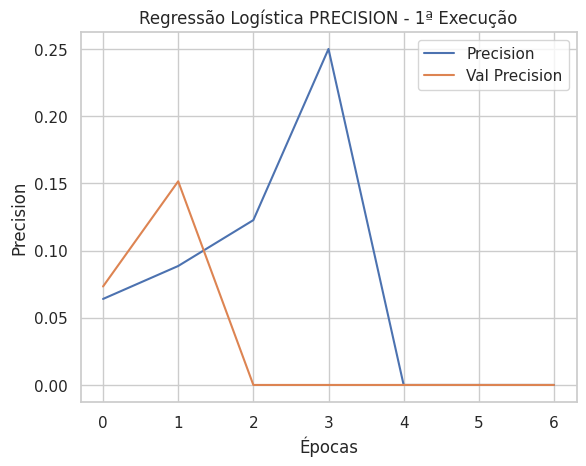

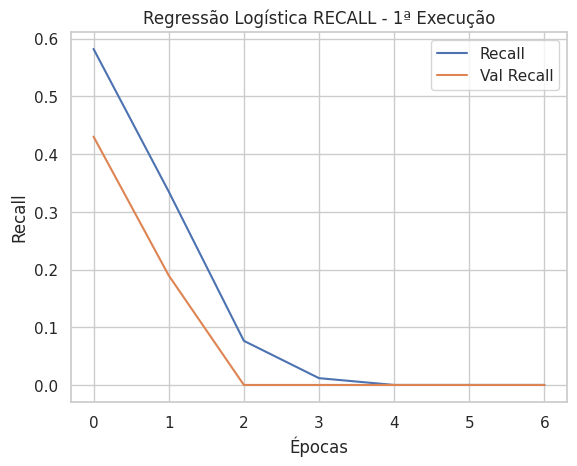

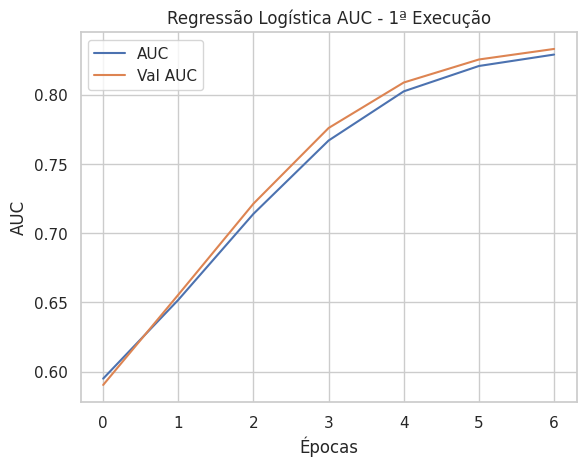

In [ ]:
plot_loss(history1, title='Regressão Logística LOSS - 1ª Execução')
plot_acc(history1, title='Regressão Logística ACCURACY - 1ª Execução')
plot_precision(history1, title='Regressão Logística PRECISION - 1ª Execução')
plot_recall(history1, title='Regressão Logística RECALL - 1ª Execução')
plot_auc(history1, title='Regressão Logística AUC - 1ª Execução')

48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Modelo: Regressão Logística (Iteração 6)
  Accuracy:  0.9485
  Precision: 0.0000
  Recall:    0.0000
  F1 Score:  0.0000
----------------------------------------


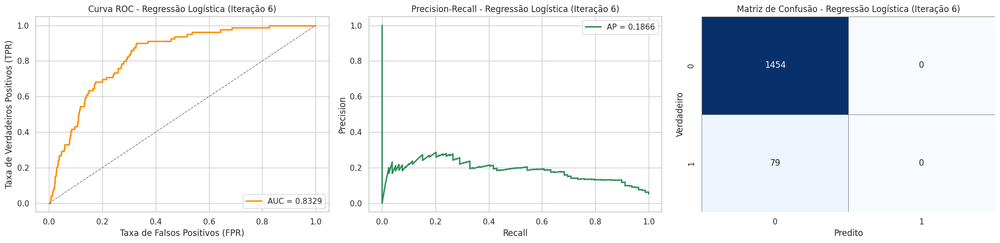

In [ ]:
y_pred = rl.predict(x_teste)
y_pred = np.round(y_pred).flatten()
y_proba = rl.predict(x_teste)
y_proba = y_proba.flatten()

metricas('Regressão Logística', 6, y_teste, y_pred, y_proba)

## Análise dos resultados ##

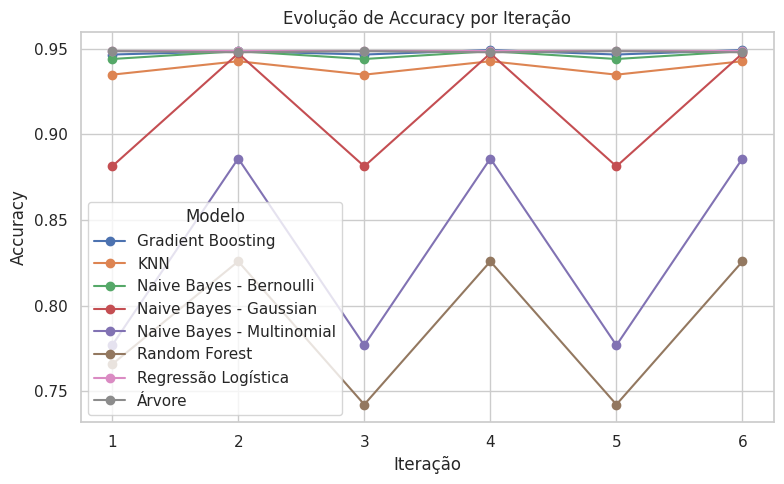

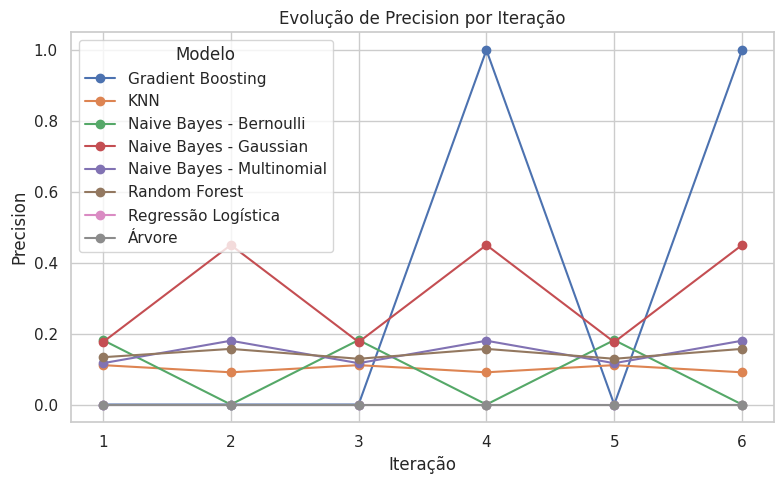

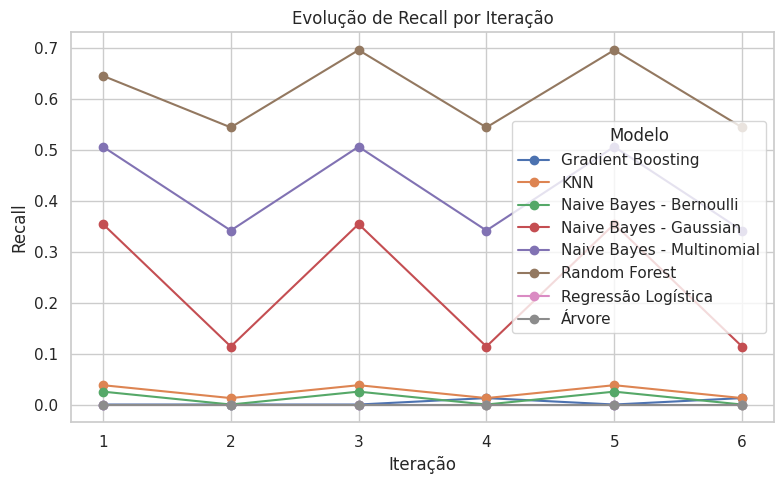

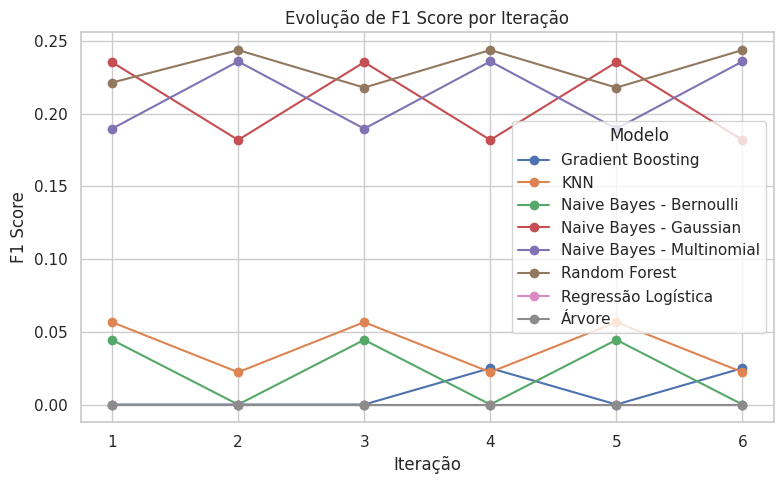

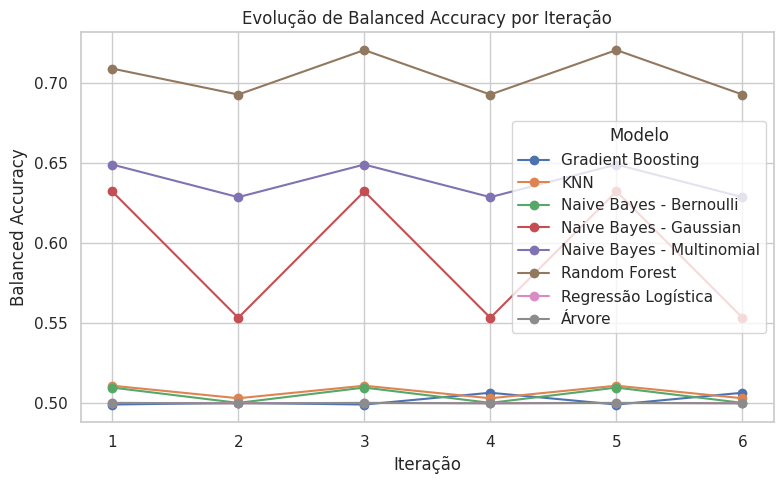

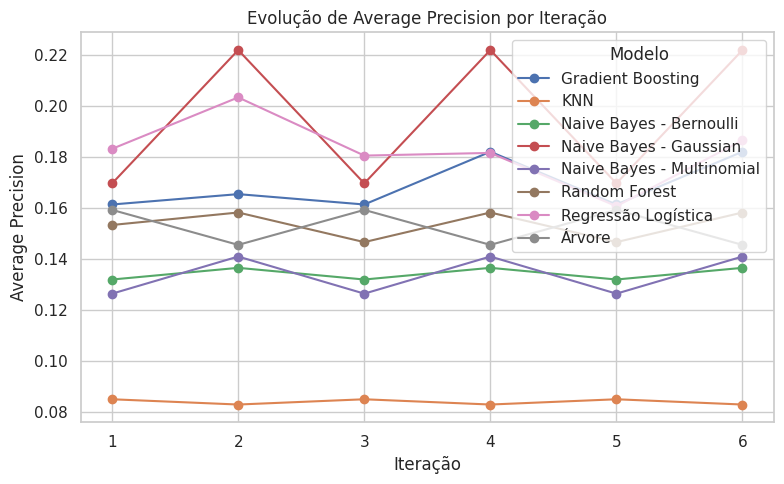

In [ ]:
plotar_metricas_evolucao(resultados)

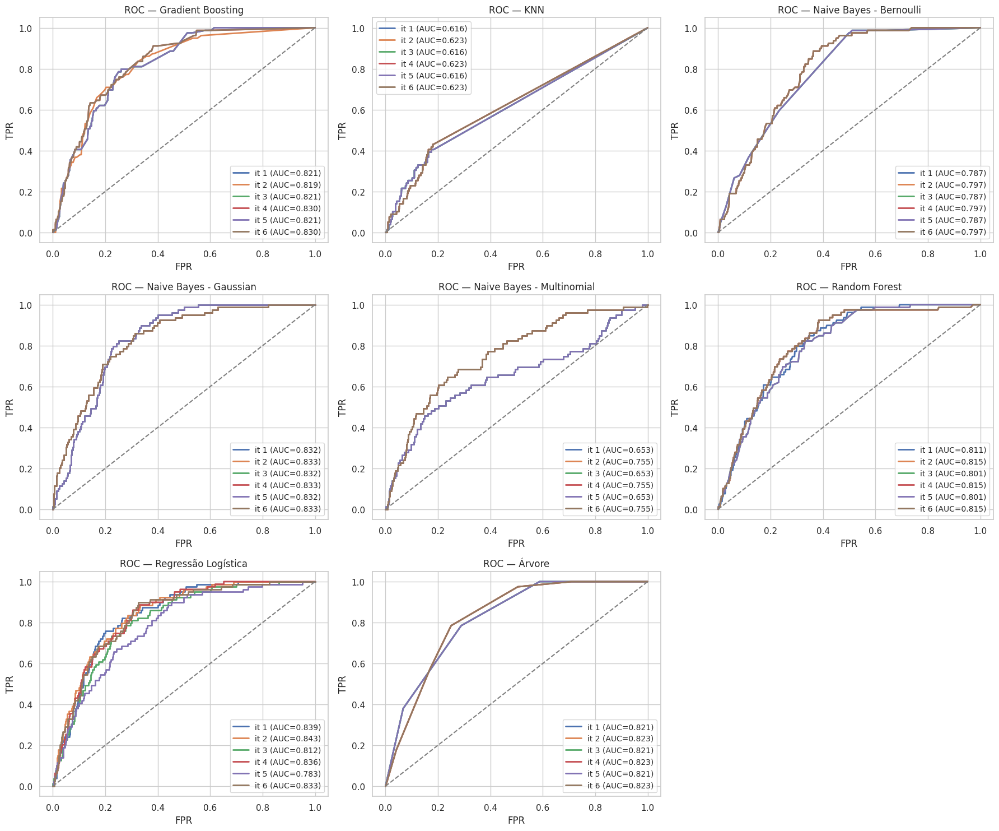

In [ ]:
plot_roc_por_modelo(resultados)

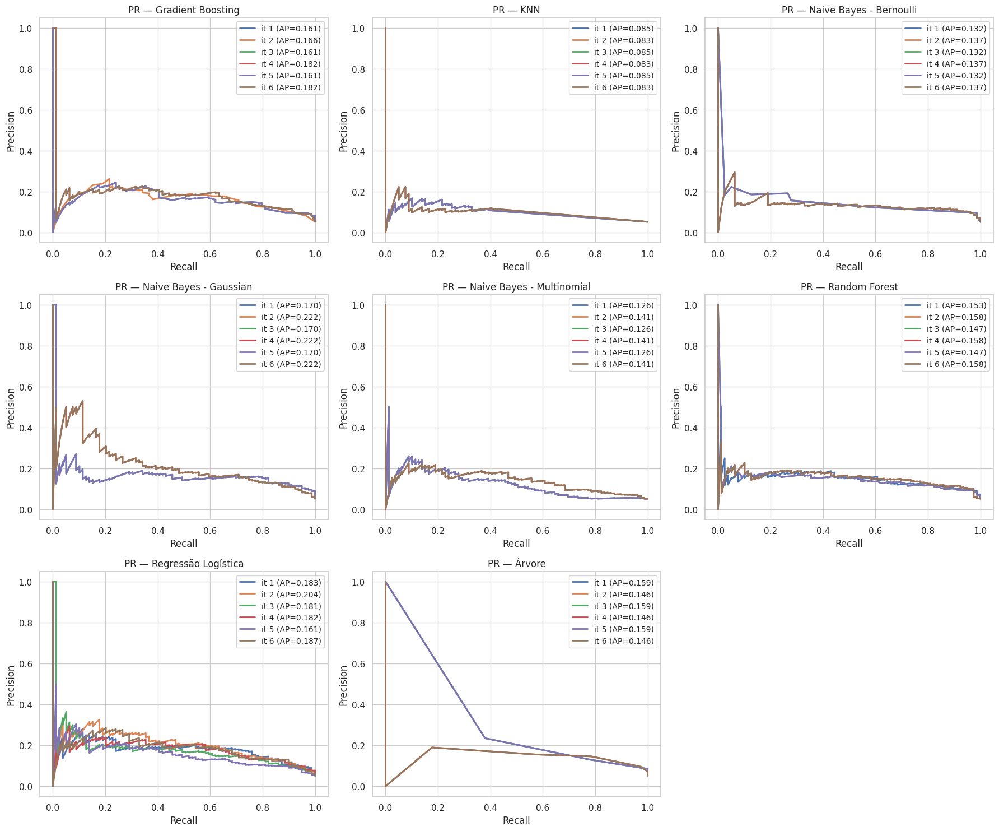

In [ ]:
plot_pr_por_modelo(resultados)

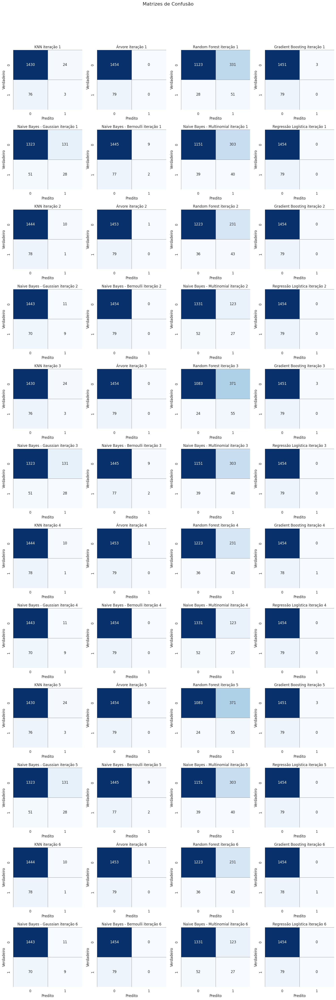

In [ ]:
plot_conf_matrices(resultados)